In [849]:
import os
import pandas as pd
import numpy as np
from glob import glob
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats.mstats import pearsonr
from flexitext import flexitext
import matplotlib.pyplot as plt
import statsmodels.api as sm


Run lmm regression:

Pos_arousal = w_score + NAcc_TR_x + (subject)

# Homemade functions

In [850]:
def get_trailer_peak(timecourse, max_min):

    # Get the maximum peak of the timecourse.
    if(max_min == 'max'):
        peak_id = np.argmax(timecourse)
    elif(max_min == 'min'):
        peak_id = np.argmin(timecourse)
    else: 
        print("Incorrect max_min value. Please use 'max' or 'min'.")

    # Check if the peak is the first or last timepoint.
    # For the peak, I am getting the average for all time points 
    # one TR before and after the peak.
    if(peak_id == 0):
        peak = np.mean(timecourse[peak_id:peak_id+1])
    elif(peak_id == len(timecourse)-1):
        peak = np.mean(timecourse[peak_id-1:peak_id])
    else:
        peak = np.mean(timecourse[peak_id-1:peak_id+1])
    
    return peak, peak_id

In [851]:

def plot_correlations_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Add annotations to the first plot. 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the second plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the third plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fourth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fifth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the sixth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)



In [852]:

def plot_correlations3_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled", "W_score_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Calculate coordinates for plotting. 
    NAcc_x_coord = np.mean(dataset_df[NAcc_label].max() + np.abs(dataset_df[NAcc_label].min())) * -0.15
    AIns_x_coord = np.mean(dataset_df[AIns_label].max() + np.abs(dataset_df[AIns_label].min())) * -0.15
    MPFC_x_coord = np.mean(dataset_df[MPFC_label].max() + np.abs(dataset_df[MPFC_label].min())) * -0.15

    PA_y_coord = (dataset_df["Pos_arousal_scaled"].max() - dataset_df["Pos_arousal_scaled"].min()) * -0.35 
    NA_y_coord = (dataset_df["Neg_arousal_scaled"].max() - dataset_df["Neg_arousal_scaled"].min()) * -0.4 
    W_y_coord = (dataset_df["W_score_scaled"].max() - dataset_df["W_score_scaled"].min()) * -0.45

    # Add annotations to the first plot (NAcc-Pos_arousal_scaled). 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=NAcc_x_coord, y=PA_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=NAcc_x_coord, y=PA_y_coord-0.1, fontsize=12,  weight='bold')
    whole_both_trailers_plot.axes[0, 0].set_ylabel('Positive arousal', fontsize = 12, weight='bold')

    # Add annotations to the second plot (NAcc-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=NAcc_x_coord, y=NA_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=NAcc_x_coord, y=NA_y_coord-0.1, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[1, 0].set_ylabel('Negative arousal', fontsize = 12, weight='bold')

    # Add annotations to the third plot (NAcc-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[2][0], 4)) + "; p-value: " + str(round(comedy_corr[2][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[2][0], 4)) + "; p-value: " + str(round(horror_corr[2][1], 5))
    whole_both_trailers_plot.axes[2, 0].text(s=horror_cor_string, x=NAcc_x_coord, y=W_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[2, 0].text(s=comedy_cor_string, x=NAcc_x_coord, y=W_y_coord-0.2, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[2, 0].set_xlabel('NAcc ' + type, fontsize = 12, weight='bold')
    whole_both_trailers_plot.axes[2, 0].set_ylabel('Watch scores', fontsize = 12, weight='bold')

    # Add annotations to the fourth plot (AIns-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=AIns_x_coord, y=PA_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=AIns_x_coord, y=PA_y_coord-0.1, fontsize=12, weight='bold')

    # Add annotations to the fifth plot (AIns-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=AIns_x_coord, y=NA_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=AIns_x_coord, y=NA_y_coord-0.1, fontsize=12, weight='bold')

    # Add annotations to the sixth plot (AIns-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[5][0], 4)) + "; p-value: " + str(round(comedy_corr[5][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[5][0], 4)) + "; p-value: " + str(round(horror_corr[5][1], 5))
    whole_both_trailers_plot.axes[2, 1].text(s=horror_cor_string, x=AIns_x_coord, y=W_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[2, 1].text(s=comedy_cor_string, x=AIns_x_coord, y=W_y_coord-0.2, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[2, 1].set_xlabel('AIns ' + type, fontsize = 12, weight='bold')

    # Add annotations to the seventh plot (MPFC-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=MPFC_x_coord, y=PA_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=MPFC_x_coord, y=PA_y_coord-0.1, fontsize=12, weight='bold')

    # Add annotations to the eighth plot (MPFC-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=MPFC_x_coord, y=NA_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=MPFC_x_coord, y=NA_y_coord-0.1, fontsize=12, weight='bold')

    # Add annotations to the ninth plot (MPFC-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[8][0], 4)) + "; p-value: " + str(round(comedy_corr[8][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[8][0], 4)) + "; p-value: " + str(round(horror_corr[8][1], 5))
    whole_both_trailers_plot.axes[2, 2].text(s=horror_cor_string, x=MPFC_x_coord, y=W_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[2, 2].text(s=comedy_cor_string, x=MPFC_x_coord, y=W_y_coord-0.2, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[2, 2].set_xlabel('MPFC ' + type, fontsize = 12, weight='bold')


    # Path to save the plot.
    save_path = "/Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/Figures/IndividualChoice/Correlations_" + type 
    whole_both_trailers_plot.savefig(save_path + ".png", dpi=300, bbox_inches="tight")



In [853]:
# Fuction to create scatter plots with corr.
def plot_correlations(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.regplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green")
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

In [854]:
# Fuction to create scatter plots with corr.
def plot_correlations_2trailers(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.relplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", hue="Type", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green", logistic=True)
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

In [855]:
def compute_and_plot_corrs(dataframe, signal, title):

    NAcc_key = "NAcc_" + signal
    AIns_key = "AIns_" + signal
    MPFC_key = "MPFC_" + signal

    PA_key = "Pos_arousal_scaled" 
    NA_key = "Neg_arousal_scaled" 
    W_key = "W_score_scaled" 

    #Compute PA correlations
    NAcc_PA_corr = pearsonr(dataframe[NAcc_key], dataframe[PA_key])
    AIns_PA_corr = pearsonr(dataframe[AIns_key], dataframe[PA_key])
    MPFC_PA_corr = pearsonr(dataframe[MPFC_key], dataframe[PA_key])

    #Compute NA correlations
    NAcc_NA_corr = pearsonr(dataframe[NAcc_key], dataframe[NA_key])
    AIns_NA_corr = pearsonr(dataframe[AIns_key], dataframe[NA_key])
    MPFC_NA_corr = pearsonr(dataframe[MPFC_key], dataframe[NA_key])

    #Compute W correlations
    NAcc_W_corr = pearsonr(dataframe[NAcc_key], dataframe[W_key])
    AIns_W_corr = pearsonr(dataframe[AIns_key], dataframe[W_key])
    MPFC_W_corr = pearsonr(dataframe[MPFC_key], dataframe[W_key])

    #Create a list with all the correlations
    corrs = [NAcc_PA_corr, NAcc_NA_corr, NAcc_W_corr, AIns_PA_corr, AIns_NA_corr, AIns_W_corr, MPFC_PA_corr, MPFC_NA_corr, MPFC_W_corr]

    # Print the correlations results.
    print("The correlation between " + str(NAcc_key) + " activation and positive arousal is: " + str(round(NAcc_PA_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and positive arousal is: " + str(round(AIns_PA_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and positive arousal is: " + str(round(MPFC_PA_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and negative arousal is: " + str(round(NAcc_NA_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and negative arousal is: " + str(round(AIns_NA_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and negative arousal is: " + str(round(MPFC_NA_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and watch scores is: " + str(round(NAcc_W_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and watch scores is: " + str(round(AIns_W_corr[0], 5)) + " with a p-value of: " + str((AIns_W_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and watch scores is: " + str(round(MPFC_W_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_corr[1])))

    plot_correlations(dataframe, corrs, signal, title)

In [856]:
def compute_and_plot_both_corrs(dataframe_main, dataframe_C, dataframe_H, signal, title):

    NAcc_key = "NAcc_" + signal
    AIns_key = "AIns_" + signal
    MPFC_key = "MPFC_" + signal

    PA_key = "Pos_arousal_scaled" 
    NA_key = "Neg_arousal_scaled" 
    W_key = "W_score_scaled" 

    # Compute PA correlations for Comedy trailers.
    NAcc_PA_comedy_corr = pearsonr(dataframe_C[NAcc_key], dataframe_C[PA_key])
    AIns_PA_comedy_corr = pearsonr(dataframe_C[AIns_key], dataframe_C[PA_key])
    MPFC_PA_comedy_corr = pearsonr(dataframe_C[MPFC_key], dataframe_C[PA_key])

    # Compute PA correlations for Horror trailers.
    NAcc_PA_horror_corr = pearsonr(dataframe_H[NAcc_key], dataframe_H[PA_key])
    AIns_PA_horror_corr = pearsonr(dataframe_H[AIns_key], dataframe_H[PA_key])
    MPFC_PA_horror_corr = pearsonr(dataframe_H[MPFC_key], dataframe_H[PA_key])

    # Compute NA correlations for Comedy trailers.
    NAcc_NA_comedy_corr = pearsonr(dataframe_C[NAcc_key], dataframe_C[NA_key])
    AIns_NA_comedy_corr = pearsonr(dataframe_C[AIns_key], dataframe_C[NA_key])
    MPFC_NA_comedy_corr = pearsonr(dataframe_C[MPFC_key], dataframe_C[NA_key])

    # Compute NA correlations for Horror trailers.
    NAcc_NA_horror_corr = pearsonr(dataframe_H[NAcc_key], dataframe_H[NA_key])
    AIns_NA_horror_corr = pearsonr(dataframe_H[AIns_key], dataframe_H[NA_key])
    MPFC_NA_horror_corr = pearsonr(dataframe_H[MPFC_key], dataframe_H[NA_key])

    # Compute W correlations for Comedy trailers.
    NAcc_W_comedy_corr = pearsonr(dataframe_C[NAcc_key], dataframe_C[W_key])
    AIns_W_comedy_corr = pearsonr(dataframe_C[AIns_key], dataframe_C[W_key])
    MPFC_W_comedy_corr = pearsonr(dataframe_C[MPFC_key], dataframe_C[W_key])

    # Compute W correlations for Horror trailers.
    NAcc_W_horror_corr = pearsonr(dataframe_H[NAcc_key], dataframe_H[W_key])
    AIns_W_horror_corr = pearsonr(dataframe_H[AIns_key], dataframe_H[W_key])
    MPFC_W_horror_corr = pearsonr(dataframe_H[MPFC_key], dataframe_H[W_key])

    # Create a list with all the correlations for Comedy trailers.
    corrs_comedy = [NAcc_PA_comedy_corr, NAcc_NA_comedy_corr, NAcc_W_comedy_corr, AIns_PA_comedy_corr, AIns_NA_comedy_corr, AIns_W_comedy_corr, MPFC_PA_comedy_corr, MPFC_NA_comedy_corr, MPFC_W_comedy_corr]

    # Create a list with all the correlations for Horror trailers.
    corrs_horror = [NAcc_PA_horror_corr, NAcc_NA_horror_corr, NAcc_W_horror_corr, AIns_PA_horror_corr, AIns_NA_horror_corr, AIns_W_horror_corr, MPFC_PA_horror_corr, MPFC_NA_horror_corr, MPFC_W_horror_corr]
    
    # Print the correlations results for Comedy trailers.
    print("The correlation between " + str(NAcc_key) + " activation and positive arousal for Comedy trailers is: " + str(round(NAcc_PA_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_comedy_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and positive arousal for Comedy trailers is: " + str(round(AIns_PA_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_comedy_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and positive arousal for Comedy trailers is: " + str(round(MPFC_PA_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_comedy_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and negative arousal for Comedy trailers is: " + str(round(NAcc_NA_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_comedy_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and negative arousal for Comedy trailers is: " + str(round(AIns_NA_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_comedy_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and negative arousal for Comedy trailers is: " + str(round(MPFC_NA_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_comedy_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and watch scores for Comedy trailers is: " + str(round(NAcc_W_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_comedy_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and watch scores for Comedy trailers is: " + str(round(AIns_W_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_W_comedy_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and watch scores for Comedy trailers is: " + str(round(MPFC_W_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_comedy_corr[1])))

    # Print the correlations results for Horror trailers.
    print("\n\nThe correlation between " + str(NAcc_key) + " activation and positive arousal for Horror trailers is: " + str(round(NAcc_PA_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_horror_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and positive arousal for Horror trailers is: " + str(round(AIns_PA_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_horror_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and positive arousal for Horror trailers is: " + str(round(MPFC_PA_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_horror_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and negative arousal for Horror trailers is: " + str(round(NAcc_NA_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_horror_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and negative arousal for Horror trailers is: " + str(round(AIns_NA_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_horror_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and negative arousal for Horror trailers is: " + str(round(MPFC_NA_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_horror_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and watch scores for Horror trailers is: " + str(round(NAcc_W_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_horror_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and watch scores for Horror trailers is: " + str(round(AIns_W_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_W_horror_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and watch scores for Horror trailers is: " + str(round(MPFC_W_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_horror_corr[1])))

    # Plot the correlations for both types of trailers.
    plot_correlations3_bothTrailers(dataframe_main, signal, corrs_comedy, corrs_horror, title)

In [857]:
def process_clean_df(path, filter_threshold):

    # Load dataset. 
    all_subs_events_df = pd.read_csv(path)

    # Create dataframe to store cooks scores. 
    all_cooks_df = pd.DataFrame()
    participants_list = all_subs_events_df['Participant'].unique()

    for sub_id in participants_list: 

        # Get dataframe of current subject.
        current_sub_df = all_subs_events_df[all_subs_events_df['Participant'] == sub_id]
        current_sub_cooks_df = pd.DataFrame()

        # Define response variable.
        Y = current_sub_df['W_score_scaled']

        # Define explanatory variables for each model.
        X_affect = current_sub_df[['Pos_arousal_scaled', 'Neg_arousal_scaled']]
        X_whole = current_sub_df[['NAcc_whole', 'AIns_whole', 'MPFC_whole']]
        X_onset = current_sub_df[['NAcc_onset', 'AIns_onset', 'MPFC_onset']]
        X_middle = current_sub_df[['NAcc_middle', 'AIns_middle', 'MPFC_middle']]
        X_offset = current_sub_df[['NAcc_offset', 'AIns_offset', 'MPFC_offset']]
        X_ind_peaks_pos = current_sub_df[['NAcc_ind_peaks_pos', 'AIns_ind_peaks_pos', 'MPFC_ind_peaks_pos']]
        X_ind_peaks_neg = current_sub_df[['NAcc_ind_peaks_neg', 'AIns_ind_peaks_neg', 'MPFC_ind_peaks_neg']]

        # Add constant to predictor variables.
        X_affect = sm.add_constant(X_affect)
        X_whole = sm.add_constant(X_whole)
        X_onset = sm.add_constant(X_onset)
        X_middle = sm.add_constant(X_middle)
        X_offset = sm.add_constant(X_offset)
        X_ind_peaks_pos = sm.add_constant(X_ind_peaks_pos)
        X_ind_peaks_neg = sm.add_constant(X_ind_peaks_neg)

        # Fit linear regression models
        model_affect = sm.OLS(Y.astype(float), X_affect.astype(float)).fit()
        model_whole = sm.OLS(Y.astype(float), X_whole.astype(float)).fit()
        model_onset = sm.OLS(Y.astype(float), X_onset.astype(float)).fit()
        model_middle = sm.OLS(Y.astype(float), X_middle.astype(float)).fit()
        model_offset = sm.OLS(Y.astype(float), X_offset.astype(float)).fit()
        model_ind_peaks_pos = sm.OLS(Y.astype(float), X_ind_peaks_pos.astype(float)).fit()
        model_ind_peaks_neg = sm.OLS(Y.astype(float), X_ind_peaks_neg.astype(float)).fit()

        # Create instance of influence for each model.
        influence_affect = model_affect.get_influence()
        influence_whole = model_whole.get_influence()
        influence_onset = model_onset.get_influence()
        influence_middle = model_middle.get_influence()
        influence_offset = model_offset.get_influence()
        influence_ind_peaks_pos = model_ind_peaks_pos.get_influence()
        influence_ind_peaks_neg = model_ind_peaks_neg.get_influence()

        # Obtain Cook's distance for each observation in each model.
        affect_cooks_scores = influence_affect.cooks_distance
        whole_cooks_scores = influence_whole.cooks_distance
        onset_cooks_scores = influence_onset.cooks_distance
        middle_cooks_scores = influence_middle.cooks_distance
        offset_cooks_scores = influence_offset.cooks_distance
        ind_peaks_pos_cooks_scores = influence_ind_peaks_pos.cooks_distance
        ind_peaks_neg_cooks_scores = influence_ind_peaks_neg.cooks_distance

        # Add Cook's distance to the dataframe.
        current_sub_cooks_df["Participant_cooks"] = current_sub_df["Participant"]
        current_sub_cooks_df["Affect_cooks"] = affect_cooks_scores[0]
        current_sub_cooks_df["Whole_cooks"] = whole_cooks_scores[0]
        current_sub_cooks_df["Onset_cooks"] = onset_cooks_scores[0]
        current_sub_cooks_df["Middle_cooks"] = middle_cooks_scores[0]
        current_sub_cooks_df["Offset_cooks"] = offset_cooks_scores[0]
        current_sub_cooks_df["Ind_peaks_pos_cooks"] = ind_peaks_pos_cooks_scores[0]
        current_sub_cooks_df["Ind_peaks_neg_cooks"] = ind_peaks_neg_cooks_scores[0]

        # Append the current subject's Cook's distance to the main dataframe.
        all_cooks_df = pd.concat([all_cooks_df, current_sub_cooks_df], ignore_index=True)

        del current_sub_cooks_df

    # Append cooks columns to main dataframe.
    all_subs_events_df = pd.concat([all_subs_events_df, all_cooks_df], axis=1)

    # Filter out the outliers.
    # Drop rows with Cook's distance higher than the threshold.
    all_subs_events_df = all_subs_events_df[all_subs_events_df['Whole_cooks'] < filter_threshold]
    all_subs_events_df = all_subs_events_df[all_subs_events_df['Onset_cooks'] < filter_threshold]
    #all_subs_events_df = all_subs_events_df[all_subs_events_df['Middle_cooks'] < filter_threshold]
    all_subs_events_df = all_subs_events_df[all_subs_events_df['Offset_cooks'] < filter_threshold]
    #all_subs_events_df = all_subs_events_df[all_subs_events_df['ISC_cooks'] < filter_threshold]
    #all_subs_events_df = all_subs_events_df[all_subs_events_df['Ind_peaks_pos_cooks'] < filter_threshold]
    #all_subs_events_df = all_subs_events_df[all_subs_events_df['Ind_peaks_neg_cooks'] < filter_threshold]
    all_subs_events_df = all_subs_events_df[all_subs_events_df['Affect_cooks'] < filter_threshold]

    return all_subs_events_df       

# Clean data

In [858]:
# Open a datasets directory. 
fd = os.open("/Users/luisalvarez/Documents/GitHub", os.O_RDONLY)

# Use os.fchdir() method to change the current dir/folder.
os.fchdir(fd)

# Safe check- Print current working directory
print("Current working dir : %s" % os.getcwd())

Current working dir : /Users/luisalvarez/Documents/GitHub


In [859]:
# Open csv file. 
all_subs_events_df = pd.read_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation.csv') #AllSubs_NeuralActivation_main
all_subs_ISC_df = pd.read_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralISC.csv')

# Drop the first columns of the dataframe (repeated). 
ISC_cols = ['NAcc_ISC', 'AIns_ISC', 'MPFC_ISC', "NAcc_LH_ISC", "AIns_LH_ISC", "MPFC_LH_ISC",
           "NAcc_DH_ISC", "AIns_DH_ISC", "MPFC_DH_ISC", "NAcc_LC_ISC", "AIns_LC_ISC", "MPFC_LC_ISC",
           "NAcc_DC_ISC", "AIns_DC_ISC", "MPFC_DC_ISC", 'NAcc_MPFC', 'AIns_MPFC', 'NAcc_AIns', 'NAcc_MPFC_ISFC', 
           'AIns_MPFC_ISFC', 'NAcc_AIns_ISFC', 'AIns_NAcc_ISFC', 'MPFC_NAcc_ISFC', 'MPFC_AIns_ISFC']
all_subs_ISC_df = all_subs_ISC_df[ISC_cols] 

all_subs_events_df = pd.concat([all_subs_events_df, all_subs_ISC_df], axis=1)

print("The un-cleaned shape of the dataframe is: ", all_subs_events_df.shape)
all_subs_events_df.head()


The un-cleaned shape of the dataframe is:  (943, 177)


,Participant,Trailer,Type,Onset,Offset,Duration,W_score,A_score,F_score,NAcc_onset,...,MPFC_DC_ISC,NAcc_MPFC,AIns_MPFC,NAcc_AIns,NAcc_MPFC_ISFC,AIns_MPFC_ISFC,NAcc_AIns_ISFC,AIns_NAcc_ISFC,MPFC_NAcc_ISFC,MPFC_AIns_ISFC
0,sub-01,rh6,Horror,12.0,42.0,30,3,3,2,0.063491,...,0.302736,1.669757,2.045889,2.114697,0.422803,0.336908,0.186010,0.170274,0.077826,0.011644
1,sub-01,uh1,Horror,60.0,90.0,30,1,3,3,0.118238,...,0.248046,0.793116,0.896524,1.054257,0.234690,0.199665,-0.132995,0.075989,-0.116243,-0.018230
2,sub-01,rc2,Comedy,108.0,138.0,30,1,1,3,-0.121954,...,-0.235032,1.132684,1.103268,1.542749,-0.371055,-0.165227,-0.085410,-0.083109,-0.168695,-0.044091
3,sub-01,rh2,Horror,152.0,182.0,30,3,2,2,-0.155881,...,0.145766,0.350284,0.685057,0.456665,-0.161104,-0.178500,0.068391,-0.135924,-0.081173,0.048070
4,sub-01,rh1,Horror,196.0,226.0,30,4,3,2,0.138968,...,0.182363,0.513060,0.859149,0.624052,-0.581650,0.093998,-0.427495,0.538147,0.492223,0.089027


In [860]:
# Calculate Cook's distance for each observation.

all_cooks_df = pd.DataFrame()
participants_list = all_subs_events_df['Participant'].unique()

for sub_id in participants_list: 

    print("Calculating cooks distance for subject: ", sub_id)

    # Get dataframe of current subject.
    current_sub_df = all_subs_events_df[all_subs_events_df['Participant'] == sub_id]
    current_sub_cooks_df = pd.DataFrame()

    # Define response variable.
    Y = current_sub_df['W_score_scaled']

    # Define explanatory variables for each model.
    X_affect = current_sub_df[['Pos_arousal_scaled', 'Neg_arousal_scaled']]
    X_whole = current_sub_df[['NAcc_whole', 'AIns_whole', 'MPFC_whole']]
    X_onset = current_sub_df[['NAcc_onset', 'AIns_onset', 'MPFC_onset']]
    X_middle = current_sub_df[['NAcc_middle', 'AIns_middle', 'MPFC_middle']]
    X_offset = current_sub_df[['NAcc_offset', 'AIns_offset', 'MPFC_offset']]
    X_ISC = current_sub_df[['NAcc_ISC', 'AIns_ISC', 'MPFC_ISC']]
    X_ind_peaks_pos = current_sub_df[['NAcc_ind_peaks_pos', 'AIns_ind_peaks_pos', 'MPFC_ind_peaks_pos']]
    X_ind_peaks_neg = current_sub_df[['NAcc_ind_peaks_neg', 'AIns_ind_peaks_neg', 'MPFC_ind_peaks_neg']]
    X_dem_peaks_pos = current_sub_df[['NAcc_dem_peak_pos', 'AIns_dem_peak_pos', 'MPFC_dem_peak_pos']]
    X_dem_peaks_pos_yes = current_sub_df[["NAcc_dem_peak_pos_yes" , "AIns_dem_peak_pos_yes", "MPFC_dem_peak_pos_yes"]]
    X_dem_peaks_neg = current_sub_df[['NAcc_dem_peak_neg', 'AIns_dem_peak_neg', 'MPFC_dem_peak_neg']]
    X_avg_peaks_pos = current_sub_df[["NAcc_avg_peak_pos", "AIns_avg_peak_pos", "MPFC_avg_peak_pos"]]
    X_avg_peaks_pos_yes = current_sub_df[["NAcc_avg_peak_yes_pos", "AIns_avg_peak_yes_pos", "MPFC_avg_peak_yes_pos"]]

    # Add constant to predictor variables.
    X_affect = sm.add_constant(X_affect)
    X_whole = sm.add_constant(X_whole)
    X_onset = sm.add_constant(X_onset)
    X_middle = sm.add_constant(X_middle)
    X_offset = sm.add_constant(X_offset)
    X_ISC = sm.add_constant(X_ISC)
    X_ind_peaks_pos = sm.add_constant(X_ind_peaks_pos)
    X_ind_peaks_neg = sm.add_constant(X_ind_peaks_neg)
    X_dem_peaks_pos = sm.add_constant(X_dem_peaks_pos)
    X_dem_peaks_pos_yes = sm.add_constant(X_dem_peaks_pos_yes)
    X_dem_peaks_neg = sm.add_constant(X_dem_peaks_neg)
    X_avg_peaks_pos = sm.add_constant(X_avg_peaks_pos)
    X_avg_peaks_pos_yes = sm.add_constant(X_avg_peaks_pos_yes)

    # Fit linear regression models
    model_affect = sm.OLS(Y.astype(float), X_affect.astype(float)).fit()
    model_whole = sm.OLS(Y.astype(float), X_whole.astype(float)).fit()
    model_onset = sm.OLS(Y.astype(float), X_onset.astype(float)).fit()
    model_middle = sm.OLS(Y.astype(float), X_middle.astype(float)).fit()
    model_offset = sm.OLS(Y.astype(float), X_offset.astype(float)).fit()
    model_ISC = sm.OLS(Y.astype(float), X_ISC.astype(float)).fit()
    model_ind_peaks_pos = sm.OLS(Y.astype(float), X_ind_peaks_pos.astype(float)).fit()
    model_ind_peaks_neg = sm.OLS(Y.astype(float), X_ind_peaks_neg.astype(float)).fit()
    model_dem_peaks_pos = sm.OLS(Y.astype(float), X_dem_peaks_pos.astype(float)).fit()
    model_dem_peaks_pos_yes = sm.OLS(Y.astype(float), X_dem_peaks_pos_yes.astype(float)).fit()
    model_dem_peaks_neg = sm.OLS(Y.astype(float), X_dem_peaks_neg.astype(float)).fit()
    model_avg_peaks_pos = sm.OLS(Y.astype(float), X_avg_peaks_pos.astype(float)).fit()
    model_avg_peaks_pos_yes = sm.OLS(Y.astype(float), X_avg_peaks_pos_yes.astype(float)).fit()

    # Create instance of influence for each model.
    influence_affect = model_affect.get_influence()
    influence_whole = model_whole.get_influence()
    influence_onset = model_onset.get_influence()
    influence_middle = model_middle.get_influence()
    influence_offset = model_offset.get_influence()
    influence_ISC = model_ISC.get_influence()
    influence_ind_peaks_pos = model_ind_peaks_pos.get_influence()
    influence_ind_peaks_neg = model_ind_peaks_neg.get_influence()
    influence_dem_peaks_pos = model_dem_peaks_pos.get_influence()
    influence_dem_peaks_pos_yes = model_dem_peaks_pos_yes.get_influence()
    influence_dem_peaks_neg = model_dem_peaks_neg.get_influence()
    influence_avg_peaks_pos = model_avg_peaks_pos.get_influence()
    influence_avg_peaks_pos_yes = model_avg_peaks_pos_yes.get_influence()

    # Obtain Cook's distance for each observation in each model.
    affect_cooks_scores = influence_affect.cooks_distance
    whole_cooks_scores = influence_whole.cooks_distance
    onset_cooks_scores = influence_onset.cooks_distance
    middle_cooks_scores = influence_middle.cooks_distance
    offset_cooks_scores = influence_offset.cooks_distance
    ISC_cooks_scores = influence_ISC.cooks_distance
    ind_peaks_pos_cooks_scores = influence_ind_peaks_pos.cooks_distance
    ind_peaks_neg_cooks_scores = influence_ind_peaks_neg.cooks_distance
    dem_peaks_pos_cooks_scores = influence_dem_peaks_pos.cooks_distance
    dem_peaks_pos_yes_cooks_scores = influence_dem_peaks_pos_yes.cooks_distance
    dem_peaks_neg_cooks_scores = influence_dem_peaks_neg.cooks_distance
    avg_peaks_pos_cooks_scores = influence_avg_peaks_pos.cooks_distance
    avg_peaks_pos_yes_cooks_scores = influence_avg_peaks_pos_yes.cooks_distance

    # Add Cook's distance to the dataframe.
    current_sub_cooks_df["Participant_cooks"] = current_sub_df["Participant"]
    current_sub_cooks_df["Affect_cooks"] = affect_cooks_scores[0]
    current_sub_cooks_df["Whole_cooks"] = whole_cooks_scores[0]
    current_sub_cooks_df["Onset_cooks"] = onset_cooks_scores[0]
    current_sub_cooks_df["Middle_cooks"] = middle_cooks_scores[0]
    current_sub_cooks_df["Offset_cooks"] = offset_cooks_scores[0]
    current_sub_cooks_df["ISC_cooks"] = ISC_cooks_scores[0]
    current_sub_cooks_df["Ind_peaks_pos_cooks"] = ind_peaks_pos_cooks_scores[0]
    current_sub_cooks_df["Ind_peaks_neg_cooks"] = ind_peaks_neg_cooks_scores[0]
    current_sub_cooks_df["Dem_peaks_pos_cooks"] = dem_peaks_pos_cooks_scores[0]
    current_sub_cooks_df["Dem_peaks_pos_yes_cooks"] = dem_peaks_pos_yes_cooks_scores[0]
    current_sub_cooks_df["Dem_peaks_neg_cooks"] = dem_peaks_neg_cooks_scores[0]
    current_sub_cooks_df["Avg_peaks_pos_cooks"] = avg_peaks_pos_cooks_scores[0]
    current_sub_cooks_df["Avg_peaks_pos_yes_cooks"] = avg_peaks_pos_yes_cooks_scores[0]

    # Append the current subject's Cook's distance to the main dataframe.
    all_cooks_df = pd.concat([all_cooks_df, current_sub_cooks_df], ignore_index=True)

    del current_sub_cooks_df

print("The shape of the Cook's distance dataframe is: ", all_cooks_df.shape)

Calculating cooks distance for subject:  sub-01
Calculating cooks distance for subject:  sub-02
Calculating cooks distance for subject:  sub-03
Calculating cooks distance for subject:  sub-04
Calculating cooks distance for subject:  sub-08
Calculating cooks distance for subject:  sub-09
Calculating cooks distance for subject:  sub-10
Calculating cooks distance for subject:  sub-11
Calculating cooks distance for subject:  sub-12
Calculating cooks distance for subject:  sub-13
Calculating cooks distance for subject:  sub-15
Calculating cooks distance for subject:  sub-17
Calculating cooks distance for subject:  sub-18
Calculating cooks distance for subject:  sub-19
Calculating cooks distance for subject:  sub-21
Calculating cooks distance for subject:  sub-22
Calculating cooks distance for subject:  sub-23
Calculating cooks distance for subject:  sub-25
Calculating cooks distance for subject:  sub-26
Calculating cooks distance for subject:  sub-27
Calculating cooks distance for subject: 

In [861]:
# Add Cook's distance to the main dataframe.
all_subs_events_df = pd.concat([all_subs_events_df, all_cooks_df], axis=1)
all_subs_events_df

,Participant,Trailer,Type,Onset,Offset,Duration,W_score,A_score,F_score,NAcc_onset,...,Middle_cooks,Offset_cooks,ISC_cooks,Ind_peaks_pos_cooks,Ind_peaks_neg_cooks,Dem_peaks_pos_cooks,Dem_peaks_pos_yes_cooks,Dem_peaks_neg_cooks,Avg_peaks_pos_cooks,Avg_peaks_pos_yes_cooks
0,sub-01,rh6,Horror,12.0,42.0,30,3,3,2,0.063491,...,0.034863,0.002824,0.006698,0.005681,0.009044,0.016242,0.000004,0.018096,0.105639,0.006931
1,sub-01,uh1,Horror,60.0,90.0,30,1,3,3,0.118238,...,0.016861,0.049089,0.016870,0.031842,0.025189,0.018190,0.077519,0.122074,0.022142,0.040272
2,sub-01,rc2,Comedy,108.0,138.0,30,1,1,3,-0.121954,...,0.022144,0.026630,0.021271,0.070036,0.083068,0.021093,0.010943,0.117206,0.023626,0.012216
3,sub-01,rh2,Horror,152.0,182.0,30,3,2,2,-0.155881,...,0.010483,0.003732,0.018021,0.007037,0.003998,0.016755,0.015607,0.003556,0.014685,0.065592
4,sub-01,rh1,Horror,196.0,226.0,30,4,3,2,0.138968,...,0.023775,0.063117,0.055259,0.094566,0.057278,0.165919,0.244785,0.030869,0.066728,0.049916
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
938,sub-37,rh8,Horror,520.0,550.0,30,1,2,1,0.078175,...,0.063600,0.031783,0.015688,0.058750,0.025795,0.016014,0.146902,0.090033,0.066366,0.041726
939,sub-37,rc10,Comedy,568.0,598.0,30,3,3,3,-0.083276,...,0.005386,0.003412,0.095441,0.002532,0.008717,0.009779,0.004541,0.076466,0.007021,0.005545
940,sub-37,uh3,Horror,616.0,646.0,30,1,1,1,-0.159902,...,0.050596,0.024788,0.027516,0.015843,0.030359,0.123608,0.053281,0.099015,0.078322,0.066880
941,sub-37,rc7,Comedy,660.0,690.0,30,2,2,3,0.002952,...,0.031437,0.003775,0.023598,0.014595,0.004421,0.003946,0.001740,0.003064,0.001306,0.046083


Text(0.5, 0, 'Time points')

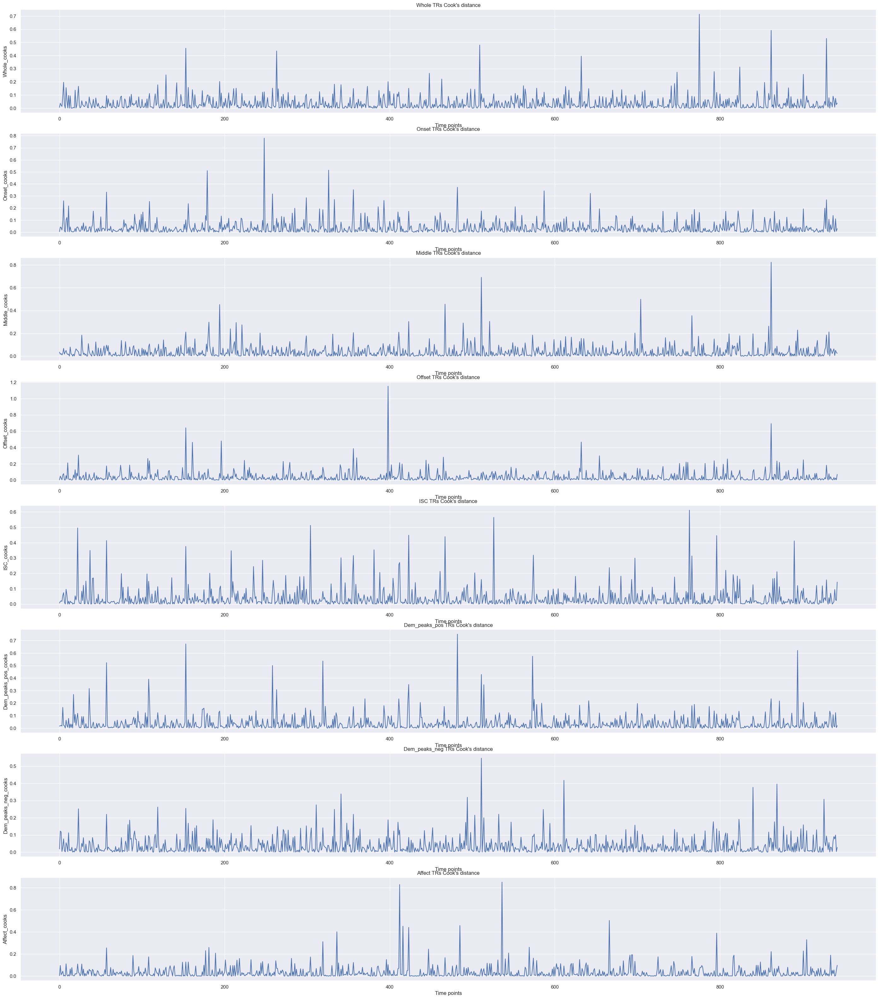

In [862]:
# Visualize cooks distance for each model.

fig, axs = plt.subplots(8, 1, figsize=(35, 40), sharex=False) 

time_points = np.arange(all_subs_events_df.shape[0])

sns.lineplot(data=all_subs_events_df, x=time_points, y='Whole_cooks', ax=axs[0])
axs[0].set_title("Whole TRs Cook's distance")
axs[0].set_xlabel("Time points")

sns.lineplot(data=all_subs_events_df, x=time_points, y='Onset_cooks', ax=axs[1])
axs[1].set_title("Onset TRs Cook's distance")
axs[1].set_xlabel("Time points")

sns.lineplot(data=all_subs_events_df, x=time_points, y='Middle_cooks', ax=axs[2])
axs[2].set_title("Middle TRs Cook's distance")
axs[2].set_xlabel("Time points")

sns.lineplot(data=all_subs_events_df, x=time_points, y='Offset_cooks', ax=axs[3])
axs[3].set_title("Offset TRs Cook's distance")
axs[3].set_xlabel("Time points")

sns.lineplot(data=all_subs_events_df, x=time_points, y='ISC_cooks', ax=axs[4])
axs[4].set_title("ISC TRs Cook's distance")
axs[4].set_xlabel("Time points")

sns.lineplot(data=all_subs_events_df, x=time_points, y='Dem_peaks_pos_cooks', ax=axs[5])
axs[5].set_title("Dem_peaks_pos TRs Cook's distance")
axs[5].set_xlabel("Time points")

sns.lineplot(data=all_subs_events_df, x=time_points, y='Dem_peaks_neg_cooks', ax=axs[6])
axs[6].set_title("Dem_peaks_neg TRs Cook's distance")
axs[6].set_xlabel("Time points")

sns.lineplot(data=all_subs_events_df, x=time_points, y='Affect_cooks', ax=axs[7])
axs[7].set_title("Affect TRs Cook's distance")
axs[7].set_xlabel("Time points")



In [863]:
print(all_subs_events_df[all_subs_events_df['Ind_peaks_pos_cooks'] > 1].shape)
print("The maximum Cook's distance for the whole model is: ", all_subs_events_df['Whole_cooks'].max())
print("The maximum Cook's distance for the onset model is: ", all_subs_events_df['Onset_cooks'].max())
print("The maximum Cook's distance for the middle model is: ", all_subs_events_df['Middle_cooks'].max())
print("The maximum Cook's distance for the offset model is: ", all_subs_events_df['Offset_cooks'].max())
print("The maximum Cook's distance for the ISC model is: ", all_subs_events_df['ISC_cooks'].max())
print("The maximum Cook's distance for the ind_peaks_pos model is: ", all_subs_events_df['Ind_peaks_pos_cooks'].max())
print("The maximum Cook's distance for the ind_peaks_neg model is: ", all_subs_events_df['Ind_peaks_neg_cooks'].max())
print("The maximum Cook's distance for the affect model is: ", all_subs_events_df['Affect_cooks'].max())
print("The maximum Cook's distance for the dem_peaks_pos model is: ", all_subs_events_df['Dem_peaks_pos_cooks'].max())
print("The maximum Cook's distance for the dem_peaks_neg model is: ", all_subs_events_df['Dem_peaks_neg_cooks'].max())
print("The maximum Cook's distance for the avg_peaks_pos model is: ", all_subs_events_df['Avg_peaks_pos_cooks'].max())
print("The maximum Cook's distance for the avg_peaks_pos_yes model is: ", all_subs_events_df['Avg_peaks_pos_yes_cooks'].max())





(1, 191)
The maximum Cook's distance for the whole model is:  0.71397431998954
The maximum Cook's distance for the onset model is:  0.7794892772010802
The maximum Cook's distance for the middle model is:  0.8239217078034191
The maximum Cook's distance for the offset model is:  1.1529378435230007
The maximum Cook's distance for the ISC model is:  0.6115814565368292
The maximum Cook's distance for the ind_peaks_pos model is:  1.0396324826191097
The maximum Cook's distance for the ind_peaks_neg model is:  0.9525690669481255
The maximum Cook's distance for the affect model is:  0.8506325536759258
The maximum Cook's distance for the dem_peaks_pos model is:  0.7514680084911446
The maximum Cook's distance for the dem_peaks_neg model is:  0.5464632299364154
The maximum Cook's distance for the avg_peaks_pos model is:  0.8101905472394723
The maximum Cook's distance for the avg_peaks_pos_yes model is:  0.519469219363547


In [864]:
drop_threshold = .15

# Drop rows with Cook's distance higher than the threshold.
#all_subs_events_df = all_subs_events_df[all_subs_events_df['Whole_cooks'] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df['Onset_cooks'] < drop_threshold]
#all_subs_events_df = all_subs_events_df[all_subs_events_df['Middle_cooks'] < drop_threshold]
#all_subs_events_df = all_subs_events_df[all_subs_events_df['Offset_cooks'] < drop_threshold]
#all_subs_events_df = all_subs_events_df[all_subs_events_df['ISC_cooks'] < drop_threshold]
#all_subs_events_df = all_subs_events_df[all_subs_events_df['Dem_peaks_pos_cooks'] < drop_threshold] #0.1 -> good for aggregate.
all_subs_events_df = all_subs_events_df[all_subs_events_df['Dem_peaks_pos_yes_cooks'] < drop_threshold] 
#all_subs_events_df = all_subs_events_df[all_subs_events_df['Dem_peaks_neg_cooks'] < drop_threshold]
#all_subs_events_df = all_subs_events_df[all_subs_events_df['Affect_cooks'] < drop_threshold]
#all_subs_events_df = all_subs_events_df[all_subs_events_df['Ind_peaks_pos_cooks'] < drop_threshold]
#all_subs_events_df = all_subs_events_df[all_subs_events_df['Ind_peaks_neg_cooks'] < drop_threshold]
#all_subs_events_df = all_subs_events_df[all_subs_events_df['Avg_peaks_pos_cooks'] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df['Avg_peaks_pos_yes_cooks'] < drop_threshold] # 0.1 -> Best for individual choice.

print("The shape of the dataframe after dropping rows is: ", all_subs_events_df.shape)

The shape of the dataframe after dropping rows is:  (842, 191)


In [865]:
# Separate files based on type of trailer. 
all_subs_events_df.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_ISC.csv')

all_subs_events_horror = all_subs_events_df[all_subs_events_df["Type"] == "Horror"]
all_subs_events_horror.reset_index(drop=True, inplace=True)
#all_subs_events_horror.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_ISC_Horror.csv')

all_subs_events_comedy = all_subs_events_df[all_subs_events_df["Type"] == "Comedy"]
all_subs_events_comedy.reset_index(drop=True, inplace=True)
#all_subs_events_comedy.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_ISC_Comedy.csv')


# Visualize data 

## Behavioral Associations. 

The correlation between W_score and Pos_arousal is: 0.5641 with a p-value of: 6.778356238666956e-72
The correlation between W_score and Neg_arousal is: -0.2077 with a p-value of: 1.1695158134337858e-09


Text(-1, -2, 'r= -0.2077; p-value: 1.1695158134337858e-09')

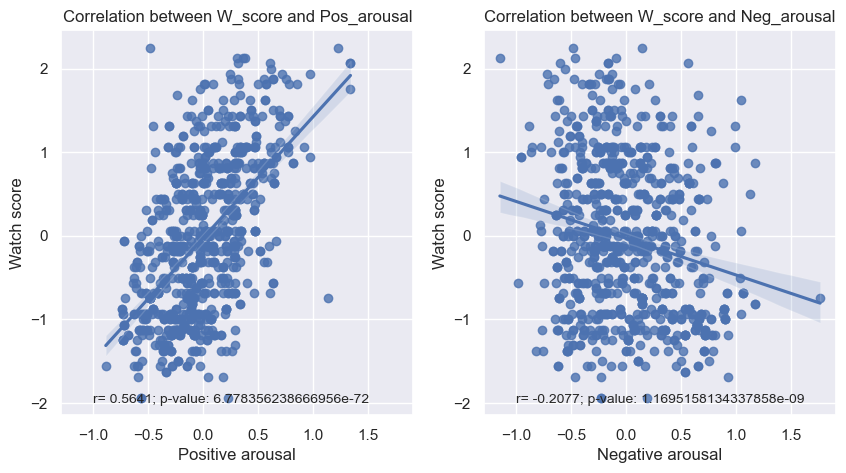

In [866]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for both types of trailers. 
W_PA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Pos_arousal_scaled"])
W_NA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal is: " + str(round(W_PA_All_corr[0], 4)) + " with a p-value of: " + str((W_PA_All_corr[1])))
print("The correlation between W_score and Neg_arousal is: " + str(round(W_NA_All_corr[0], 4)) + " with a p-value of: " + str((W_NA_All_corr[1])))

fig, axs = plt.subplots(1, 2, figsize=(10, 5), sharex=True)

# Plot the correlation between W_score and Pos_arousal.
W_PA_plot = sns.regplot(data=all_subs_events_df, x="Pos_arousal_scaled", y="W_score_scaled", ax=axs[0])
W_PA_plot.set_title("Correlation between W_score and Pos_arousal")
W_PA_plot.set_xlabel("Positive arousal")
W_PA_plot.set_ylabel("Watch score")

# Plot the correlation between W_score and Neg_arousal.
W_NA_plot = sns.regplot(data=all_subs_events_df, x="Neg_arousal_scaled", y="W_score_scaled", ax=axs[1])
W_NA_plot.set_title("Correlation between W_score and Neg_arousal")
W_NA_plot.set_xlabel("Negative arousal")
W_NA_plot.set_ylabel("Watch score")

# Add annotation to the plot. 
W_PA_string = "r= " + str(round(W_PA_All_corr[0], 4)) + "; p-value: " + str((W_PA_All_corr[1]))
axs[0].text(s=W_PA_string, x=-1, y=-2, fontsize=10)
W_NA_string = "r= " + str(round(W_NA_All_corr[0], 4)) + "; p-value: " + str((W_NA_All_corr[1]))
axs[1].text(s=W_NA_string, x=-1, y=-2, fontsize=10)


In [867]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for comedy trailers.
W_PA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Pos_arousal_scaled"])
W_NA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal for comedy trailers is: " + str(round(W_PA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_PA_comedy_corr[1])))
print("The correlation between W_score and Neg_arousal for comedy trailers is: " + str(round(W_NA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_NA_comedy_corr[1])))

# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for horror trailers.
W_PA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Pos_arousal_scaled"])
W_NA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Neg_arousal_scaled"])

print("\nThe correlation between W_score and Pos_arousal for horror trailers is: " + str(round(W_PA_horror_corr[0], 4)) + " with a p-value of: " + str((W_PA_horror_corr[1])))
print("The correlation between W_score and Neg_arousal for horror trailers is: " + str(round(W_NA_horror_corr[0], 4)) + " with a p-value of: " + str((W_NA_horror_corr[1])))


The correlation between W_score and Pos_arousal for comedy trailers is: 0.6148 with a p-value of: 5.517240015412991e-44
The correlation between W_score and Neg_arousal for comedy trailers is: -0.0366 with a p-value of: 0.4595871782793716

The correlation between W_score and Pos_arousal for horror trailers is: 0.4345 with a p-value of: 2.571595166603352e-21
The correlation between W_score and Neg_arousal for horror trailers is: -0.1368 with a p-value of: 0.00438101487604305


Text(-0.8, -2.5, 'H r= 0.4345; p-value: 2.571595166603352e-21')

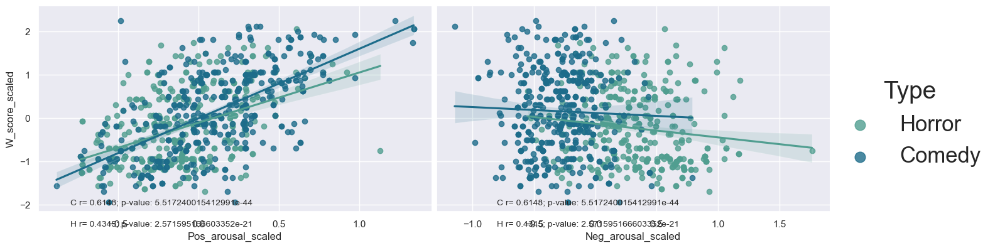

In [868]:

all_participants_cleaned_df = pd.read_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_ISC.csv')

W_PA_NA_bothTrailers_behavioral_plot = sns.pairplot(
     all_participants_cleaned_df,
     kind="reg",
     x_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"],
     y_vars=["W_score_scaled"], 
     palette="crest",
     hue="Type",
     height=4,
     aspect=1.7)

W_comedy_PA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_PA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_comedy_PA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_horror_PA_string, x=-.8, y=-2.5, fontsize=10)

W_comedy_NA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_NA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_comedy_NA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_horror_NA_string, x=-.8, y=-2.5, fontsize=10)

Text(0.5, 1.0, 'Standard deviation of watch score for each participant')

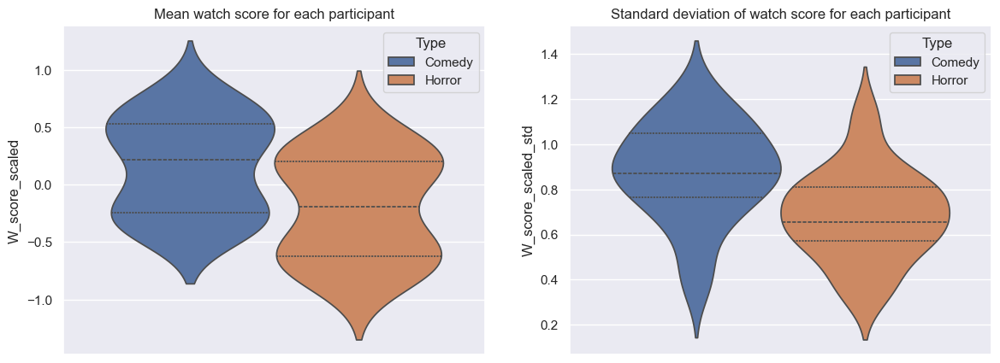

In [869]:
# Catching participants who consistently disliked horror/comedy movies. 
Individuals_mean_comedy_df = all_subs_events_comedy.groupby("Participant", as_index=False, dropna=False).mean()
Individuals_std_comedy_df = all_subs_events_comedy.groupby("Participant", as_index=False, dropna=False).std()
Individuals_mean_comedy_df["W_score_scaled_std"] = Individuals_std_comedy_df["W_score_scaled"]
Individuals_mean_comedy_df["Type"] = "Comedy"


Individuals_mean_horror_df = all_subs_events_horror.groupby("Participant", as_index=False, dropna=False).mean()
Individuals_std_horror_df = all_subs_events_horror.groupby("Participant", as_index=False, dropna=False).std()
Individuals_mean_horror_df["W_score_scaled_std"] = Individuals_std_horror_df["W_score_scaled"]
Individuals_mean_horror_df["Type"] = "Horror"

all_participants_means_df = pd.concat([Individuals_mean_comedy_df, Individuals_mean_horror_df], ignore_index=True)

sns.set(font_scale=1)

fig, axs = plt.subplots(1, 2, figsize=(14, 5), sharex=True)

sns.violinplot(data=all_participants_means_df, y="W_score_scaled", hue="Type", inner="quart", ax=axs[0])
axs[0].set_title("Mean watch score for each participant")

sns.violinplot(data=all_participants_means_df, y="W_score_scaled_std", hue="Type", inner="quart", ax=axs[1])
axs[1].set_title("Standard deviation of watch score for each participant")



In [870]:
# Get threshold for participants to exclude because the just don't like horror movies. 
Horror_w_threshold = Individuals_mean_horror_df["W_score_scaled"].describe()["50%"]
Comedy_w_threshold = Individuals_mean_comedy_df["W_score_scaled"].describe()["50%"]


#print("The threshold for the watch score for horror movies is: ", Horror_w_threshold)

Dislike_horror_list = []
Like_horror_list = []

Dislike_comedy_list = []
Like_comedy_list = []

for participant_id in range(len(participants_list)):

    if Individuals_mean_horror_df.loc[participant_id, "W_score_scaled"] < Horror_w_threshold: #0:
        Dislike_horror_list.append(participants_list[participant_id])
    else: 
        Like_horror_list.append(participants_list[participant_id])

    if Individuals_mean_comedy_df.loc[participant_id, "W_score_scaled"] < Comedy_w_threshold: #0:
        Dislike_comedy_list.append(participants_list[participant_id])
    else:
        Like_comedy_list.append(participants_list[participant_id])

print("Participants who dislike horror movies: ", Dislike_horror_list)
print("Participants who like horror movies: ", Like_horror_list)

print("\nParticipants who dislike comedy movies: ", Dislike_comedy_list)
print("Participants who like comedy movies: ", Like_comedy_list)


Participants who dislike horror movies:  ['sub-02', 'sub-03', 'sub-04', 'sub-09', 'sub-18', 'sub-21', 'sub-25', 'sub-26', 'sub-27', 'sub-28', 'sub-30', 'sub-33', 'sub-35', 'sub-36', 'sub-37']
Participants who like horror movies:  ['sub-01', 'sub-08', 'sub-10', 'sub-11', 'sub-12', 'sub-13', 'sub-15', 'sub-17', 'sub-19', 'sub-22', 'sub-23', 'sub-29', 'sub-31', 'sub-32', 'sub-34']

Participants who dislike comedy movies:  ['sub-01', 'sub-08', 'sub-11', 'sub-12', 'sub-13', 'sub-15', 'sub-17', 'sub-19', 'sub-22', 'sub-23', 'sub-27', 'sub-29', 'sub-31', 'sub-32', 'sub-34']
Participants who like comedy movies:  ['sub-02', 'sub-03', 'sub-04', 'sub-09', 'sub-10', 'sub-18', 'sub-21', 'sub-25', 'sub-26', 'sub-28', 'sub-30', 'sub-33', 'sub-35', 'sub-36', 'sub-37']


In [871]:
# Create separate dataframes for participants that like and dislike horror movies. 
Like_horror_df = pd.DataFrame()
Dislike_horror_df = pd.DataFrame()

for participant_id in range(len(participants_list)):

    if participants_list[participant_id] in Like_horror_list:
        Like_horror_df = pd.concat([Like_horror_df, all_subs_events_horror[all_subs_events_horror["Participant"] == participants_list[participant_id]]], ignore_index=True)

    if participants_list[participant_id] in Dislike_horror_list:
        Dislike_horror_df = pd.concat([Dislike_horror_df, all_subs_events_horror[all_subs_events_horror["Participant"] == participants_list[participant_id]]], ignore_index=True)

# Add column to main dataframe to distinguis participants that like and dislike horror movies. 
all_subs_events_df["H_preference"] = "Like"
all_participants_means_df["H_preference"] = "Like"

all_subs_events_df["C_preference"] = "Like"
all_participants_means_df["C_preference"] = "Like"

for participant_id in range(len(participants_list)):

    if participants_list[participant_id] in Dislike_horror_list:
        all_subs_events_df.loc[all_subs_events_df["Participant"] == participants_list[participant_id], "H_preference"] = "Dislike"
        all_participants_means_df.loc[all_participants_means_df["Participant"] == participants_list[participant_id], "H_preference"] = "Dislike"

    if participants_list[participant_id] in Dislike_comedy_list:
        all_subs_events_df.loc[all_subs_events_df["Participant"] == participants_list[participant_id], "C_preference"] = "Dislike"
        all_participants_means_df.loc[all_participants_means_df["Participant"] == participants_list[participant_id], "C_preference"] = "Dislike"



In [872]:
# Create separate dataframes for participants that like and dislike horror movies. 
Like_horror_df = pd.DataFrame()
Dislike_horror_df = pd.DataFrame()

for participant_id in range(len(participants_list)):

    if participants_list[participant_id] in Like_horror_list:
        Like_horror_df = pd.concat([Like_horror_df, all_subs_events_horror[all_subs_events_horror["Participant"] == participants_list[participant_id]]], ignore_index=True)

    if participants_list[participant_id] in Dislike_horror_list:
        Dislike_horror_df = pd.concat([Dislike_horror_df, all_subs_events_horror[all_subs_events_horror["Participant"] == participants_list[participant_id]]], ignore_index=True)

# Add column to main dataframe to distinguis participants that like and dislike horror movies. 
all_subs_events_df["H_preference"] = "Like"
all_participants_means_df["H_preference"] = "Like"

all_subs_events_df["C_preference"] = "Like"
all_participants_means_df["C_preference"] = "Like"

for participant_id in range(len(participants_list)):

    if participants_list[participant_id] in Dislike_horror_list:
        all_subs_events_df.loc[all_subs_events_df["Participant"] == participants_list[participant_id], "H_preference"] = "Dislike"
        all_participants_means_df.loc[all_participants_means_df["Participant"] == participants_list[participant_id], "H_preference"] = "Dislike"

    if participants_list[participant_id] in Dislike_comedy_list:
        all_subs_events_df.loc[all_subs_events_df["Participant"] == participants_list[participant_id], "C_preference"] = "Dislike"
        all_participants_means_df.loc[all_participants_means_df["Participant"] == participants_list[participant_id], "C_preference"] = "Dislike"



/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_32976/2937040998.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=all_subs_events_df, y="Pos_arousal_scaled", x="Type", palette="viridis", ax=axs[0])
/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_32976/2937040998.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=all_subs_events_df, y="Neg_arousal_scaled", x="Type", palette="viridis", ax=axs[1])
/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_32976/2937040998.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<Axes: xlabel='Type', ylabel='W_score_scaled'>

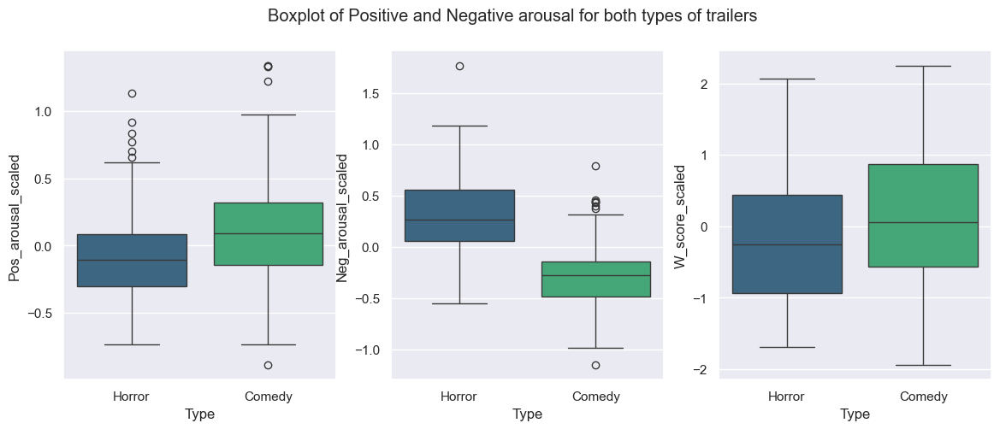

In [873]:
fig, axs = plt.subplots(1, 3, figsize=(14, 5), sharex=True)
fig.suptitle("Boxplot of Positive and Negative arousal for both types of trailers")
sns.boxplot(data=all_subs_events_df, y="Pos_arousal_scaled", x="Type", palette="viridis", ax=axs[0])
sns.boxplot(data=all_subs_events_df, y="Neg_arousal_scaled", x="Type", palette="viridis", ax=axs[1])
sns.boxplot(data=all_subs_events_df, y="W_score_scaled", x="Type", palette="viridis", ax=axs[2])


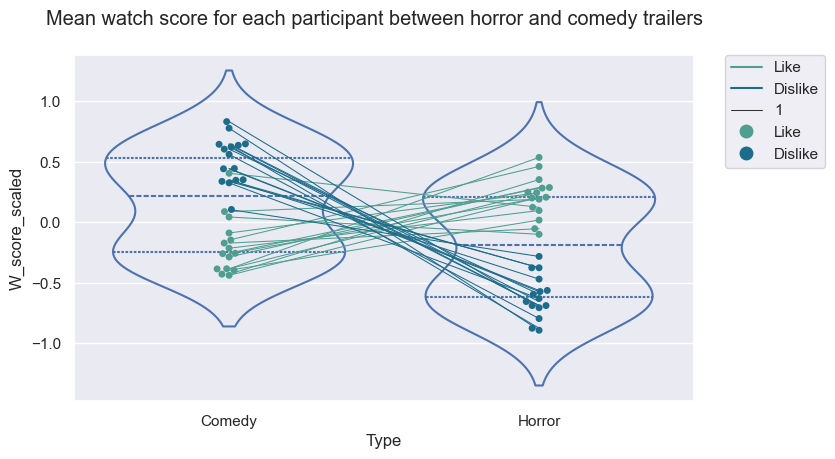

In [874]:
fig, axs = plt.subplots(figsize=(8, 4.5), sharex=True)

sns.violinplot(data=all_participants_means_df, y="W_score_scaled", x="Type", inner="quart", fill=False, palette=None, ax=axs)

sns.lineplot(data=all_participants_means_df, y="W_score_scaled", x="Type", hue="H_preference",
                 estimator=None, 
                 units="Participant",  
                 markers=True, 
                 size=1,
                 palette="crest",
                 ax=axs)

sns.swarmplot(data=all_participants_means_df, y="W_score_scaled", x="Type", hue="H_preference", palette="crest", 
              dodge=False, ax=axs) 

fig.suptitle("Mean watch score for each participant between horror and comedy trailers")

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.) #labels=["Like", "Dislike"], ,  

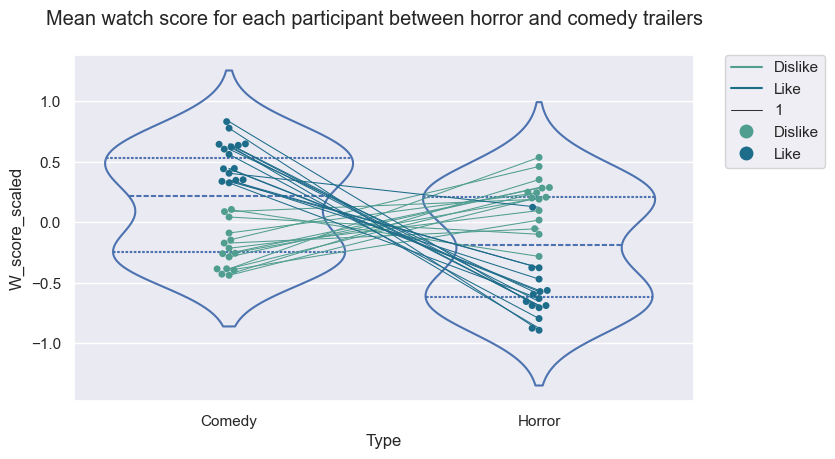

In [875]:
fig, axs = plt.subplots(figsize=(8, 4.5), sharex=True)

sns.violinplot(data=all_participants_means_df, y="W_score_scaled", x="Type", inner="quart", fill=False, palette=None, ax=axs)

sns.lineplot(data=all_participants_means_df, y="W_score_scaled", x="Type", hue="C_preference",
                 estimator=None, 
                 units="Participant",  
                 markers=True, 
                 size=1,
                 palette="crest",
                 ax=axs)

sns.swarmplot(data=all_participants_means_df, y="W_score_scaled", x="Type", hue="C_preference", palette="crest", 
              dodge=False, ax=axs) 

fig.suptitle("Mean watch score for each participant between horror and comedy trailers")

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)


The correlation between W_score and Pos_arousal for Like horror group is: 0.4794 with a p-value of: 4.021246667326865e-13
The correlation between W_score and Neg_arousal for Like horror group is: 0.2102 with a p-value of: 0.00254395581867244

The correlation between W_score and Pos_arousal for Dislike horror group is: 0.4079 with a p-value of: 1.4905718930747712e-10
The correlation between W_score and Neg_arousal for Dislike horror group is: -0.3284 with a p-value of: 3.9223949128699195e-07


Text(-0.5, 1.2, 'DH r= -0.3284; p-value: 3.9223949128699195e-07')

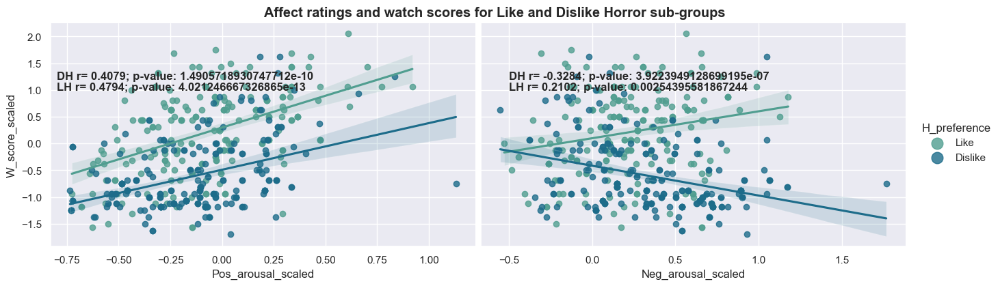

In [876]:
all_subs_events_horror = all_subs_events_df[all_subs_events_df["Type"] == "Horror"]
all_subs_events_horror.reset_index(drop=True, inplace=True)

# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for Like horror group.
W_PA_LH_corr = pearsonr(all_subs_events_horror[all_subs_events_horror["H_preference"] == "Like"]["W_score_scaled"], all_subs_events_horror[all_subs_events_horror["H_preference"] == "Like"]["Pos_arousal_scaled"])
W_NA_LH_corr = pearsonr(all_subs_events_horror[all_subs_events_horror["H_preference"] == "Like"]["W_score_scaled"], all_subs_events_horror[all_subs_events_horror["H_preference"] == "Like"]["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal for Like horror group is: " + str(round(W_PA_LH_corr[0], 4)) + " with a p-value of: " + str((W_PA_LH_corr[1])))
print("The correlation between W_score and Neg_arousal for Like horror group is: " + str(round(W_NA_LH_corr[0], 4)) + " with a p-value of: " + str((W_NA_LH_corr[1])))

# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for Dislike horror group.
W_PA_DH_corr = pearsonr(all_subs_events_horror[all_subs_events_horror["H_preference"] == "Dislike"]["W_score_scaled"], all_subs_events_horror[all_subs_events_horror["H_preference"] == "Dislike"]["Pos_arousal_scaled"])
W_NA_DH_corr = pearsonr(all_subs_events_horror[all_subs_events_horror["H_preference"] == "Dislike"]["W_score_scaled"], all_subs_events_horror[all_subs_events_horror["H_preference"] == "Dislike"]["Neg_arousal_scaled"])

print("\nThe correlation between W_score and Pos_arousal for Dislike horror group is: " + str(round(W_PA_DH_corr[0], 4)) + " with a p-value of: " + str((W_PA_DH_corr[1])))
print("The correlation between W_score and Neg_arousal for Dislike horror group is: " + str(round(W_NA_DH_corr[0], 4)) + " with a p-value of: " + str((W_NA_DH_corr[1])))

W_PA_NA_HorrorTrailers_plot = sns.pairplot(
     all_subs_events_horror,
     kind="reg",
     x_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"],
     y_vars=["W_score_scaled"], 
     palette="crest",
     hue="H_preference",
     height=4,
     aspect=1.7)
W_PA_NA_HorrorTrailers_plot.fig.suptitle("Affect ratings and watch scores for Like and Dislike Horror sub-groups", va="top", fontweight='bold', y=1.03)

W_LH_PA_string = "LH r= " + str(round(W_PA_LH_corr[0], 4)) + "; p-value: " + str((W_PA_LH_corr[1]))
W_DH_PA_string = "DH r= " + str(round(W_PA_DH_corr[0], 4)) + "; p-value: " + str((W_PA_DH_corr[1]))
W_PA_NA_HorrorTrailers_plot.axes[0, 0].text(s=W_LH_PA_string, x=-.8, y=1, fontsize=12, weight='bold')
W_PA_NA_HorrorTrailers_plot.axes[0, 0].text(s=W_DH_PA_string, x=-.8, y=1.2, fontsize=12, weight='bold')

W_LH_NA_string = "LH r= " + str(round(W_NA_LH_corr[0], 4)) + "; p-value: " + str((W_NA_LH_corr[1]))
W_DH_NA_string = "DH r= " + str(round(W_NA_DH_corr[0], 4)) + "; p-value: " + str((W_NA_DH_corr[1]))
W_PA_NA_HorrorTrailers_plot.axes[0, 1].text(s=W_LH_NA_string, x=-.5, y=1, fontsize=12, weight='bold')
W_PA_NA_HorrorTrailers_plot.axes[0, 1].text(s=W_DH_NA_string, x=-.5, y=1.2, fontsize=12, weight='bold')


The correlation between W_score and Pos_arousal for Like comedy group is: 0.6232 with a p-value of: 1.9049036891755188e-23
The correlation between W_score and Neg_arousal for Like comedy group is: -0.0396 with a p-value of: 0.5731460605240792

The correlation between W_score and Pos_arousal for Dislike comedy group is: 0.6763 with a p-value of: 9.33355230833071e-29
The correlation between W_score and Neg_arousal for Dislike comedy group is: 0.0751 with a p-value of: 0.28479494591849214


Text(-0.5, 2.3, 'DC r= 0.0751; p-value: 0.28479494591849214')

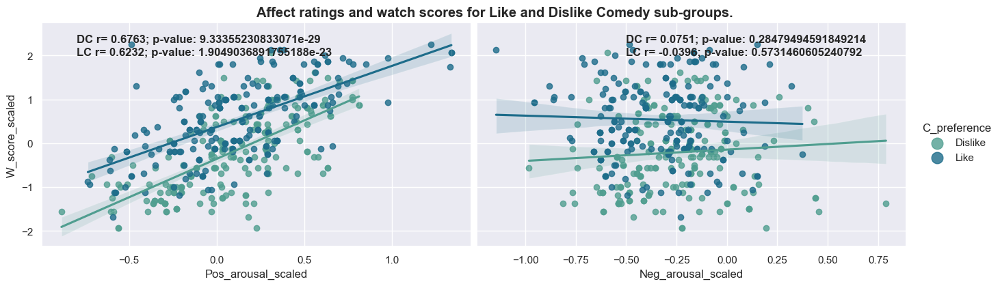

In [877]:
all_subs_events_comedy = all_subs_events_df[all_subs_events_df["Type"] == "Comedy"]
all_subs_events_comedy.reset_index(drop=True, inplace=True)

# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for Like comedy group.
W_PA_LC_corr = pearsonr(all_subs_events_comedy[all_subs_events_comedy["C_preference"] == "Like"]["W_score_scaled"], all_subs_events_comedy[all_subs_events_comedy["C_preference"] == "Like"]["Pos_arousal_scaled"])
W_NA_LC_corr = pearsonr(all_subs_events_comedy[all_subs_events_comedy["C_preference"] == "Like"]["W_score_scaled"], all_subs_events_comedy[all_subs_events_comedy["C_preference"] == "Like"]["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal for Like comedy group is: " + str(round(W_PA_LC_corr[0], 4)) + " with a p-value of: " + str((W_PA_LC_corr[1])))
print("The correlation between W_score and Neg_arousal for Like comedy group is: " + str(round(W_NA_LC_corr[0], 4)) + " with a p-value of: " + str((W_NA_LC_corr[1])))
      
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for Dislike comedy group.
W_PA_DC_corr = pearsonr(all_subs_events_comedy[all_subs_events_comedy["C_preference"] == "Dislike"]["W_score_scaled"], all_subs_events_comedy[all_subs_events_comedy["C_preference"] == "Dislike"]["Pos_arousal_scaled"])
W_NA_DC_corr = pearsonr(all_subs_events_comedy[all_subs_events_comedy["C_preference"] == "Dislike"]["W_score_scaled"], all_subs_events_comedy[all_subs_events_comedy["C_preference"] == "Dislike"]["Neg_arousal_scaled"])

print("\nThe correlation between W_score and Pos_arousal for Dislike comedy group is: " + str(round(W_PA_DC_corr[0], 4)) + " with a p-value of: " + str((W_PA_DC_corr[1])))
print("The correlation between W_score and Neg_arousal for Dislike comedy group is: " + str(round(W_NA_DC_corr[0], 4)) + " with a p-value of: " + str((W_NA_DC_corr[1])))

W_PA_NA_ComedyTrailers_plot = sns.pairplot(
     all_subs_events_comedy,
     kind="reg",
     x_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"],
     y_vars=["W_score_scaled"], 
     palette="crest",
     hue="C_preference",
     height=4,
     aspect=1.7)
W_PA_NA_ComedyTrailers_plot.fig.suptitle("Affect ratings and watch scores for Like and Dislike Comedy sub-groups.", va="top", fontweight='bold', y=1.03)

W_LC_PA_string = "LC r= " + str(round(W_PA_LC_corr[0], 4)) + "; p-value: " + str((W_PA_LC_corr[1]))
W_DC_PA_string = "DC r= " + str(round(W_PA_DC_corr[0], 4)) + "; p-value: " + str((W_PA_DC_corr[1]))

W_PA_NA_ComedyTrailers_plot.axes[0, 0].text(s=W_LC_PA_string, x=-.8, y=2, fontsize=12, weight='bold')
W_PA_NA_ComedyTrailers_plot.axes[0, 0].text(s=W_DC_PA_string, x=-.8, y=2.3, fontsize=12, weight='bold')

W_LC_NA_string = "LC r= " + str(round(W_NA_LC_corr[0], 4)) + "; p-value: " + str((W_NA_LC_corr[1]))
W_DC_NA_string = "DC r= " + str(round(W_NA_DC_corr[0], 4)) + "; p-value: " + str((W_NA_DC_corr[1]))

W_PA_NA_ComedyTrailers_plot.axes[0, 1].text(s=W_LC_NA_string, x=-.5, y=2, fontsize=12, weight='bold')
W_PA_NA_ComedyTrailers_plot.axes[0, 1].text(s=W_DC_NA_string, x=-.5, y=2.3, fontsize=12, weight='bold')

In [878]:
all_subs_events_df["F_score_scaled"] = 0

for sub_id in participants_list: 

    # Calculate mean feel score for current subject. 
    current_sub_mean_f = all_subs_events_df[all_subs_events_df["Participant"] == sub_id]["F_score"].mean()

    # Calculate std feel score for current subject. 
    current_sub_std_f = all_subs_events_df[all_subs_events_df["Participant"] == sub_id]["F_score"].std()

    # Mean center F score for current participant.
    all_subs_events_df.loc[all_subs_events_df["Participant"] == sub_id, "F_score_scaled"] = (all_subs_events_df[all_subs_events_df["Participant"] == sub_id]["F_score"] - current_sub_mean_f)/current_sub_std_f


## Neural Activation Whole Average 

In [879]:
#test_title = "Correlations for whole activation for both types of trailers"
#compute_and_plot_corrs(all_participants_cleaned_df, "whole", test_title)

The correlation between NAcc_whole activation and positive arousal for Comedy trailers is: 0.09569 with a p-value of: 0.05285987640839542
The correlation between AIns_whole activation and positive arousal for Comedy trailers is: 0.11786 with a p-value of: 0.01696099289646389
The correlation between MPFC_whole activation and positive arousal for Comedy trailers is: 0.04915 with a p-value of: 0.32083161092292767

The correlation between NAcc_whole activation and negative arousal for Comedy trailers is: 0.03535 with a p-value of: 0.47528129351947773
The correlation between AIns_whole activation and negative arousal for Comedy trailers is: 0.03657 with a p-value of: 0.46019839616405567
The correlation between MPFC_whole activation and negative arousal for Comedy trailers is: -0.01983 with a p-value of: 0.6888995678161239

The correlation between NAcc_whole activation and watch scores for Comedy trailers is: 0.13384 with a p-value of: 0.006645741801905402
The correlation between AIns_whole 

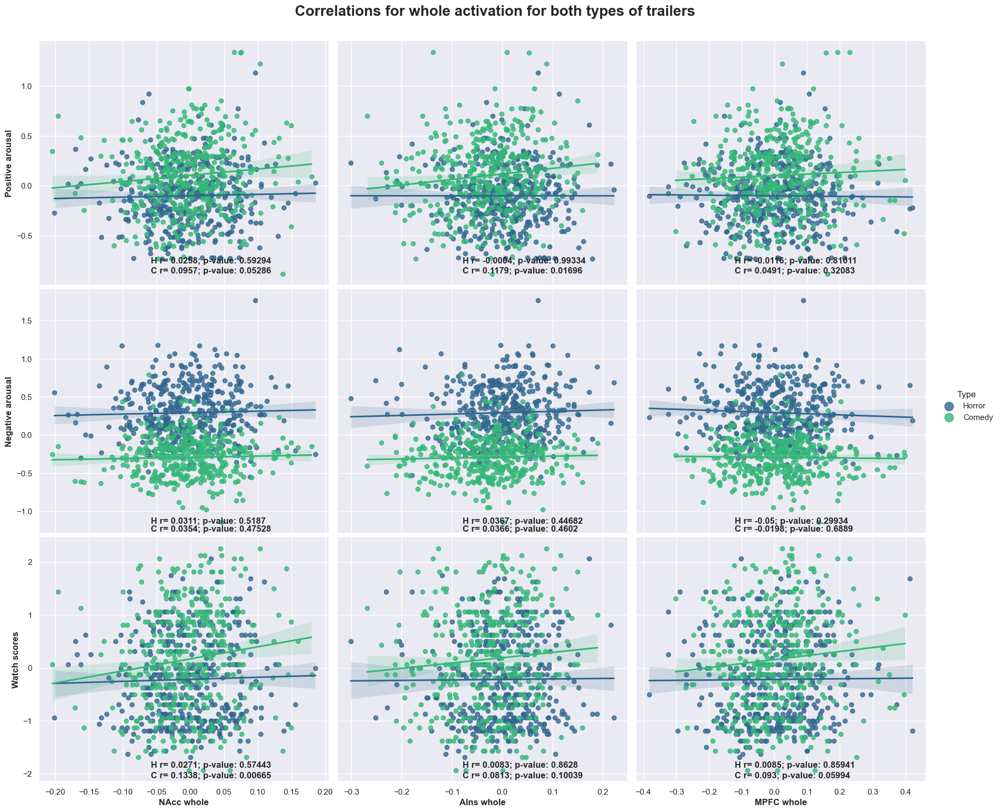

In [880]:

compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "whole", "Correlations for whole activation for both types of trailers")


## Neural Activation Offset 

In [881]:
#offset_title = "Correlations for offset activation for both types of trailers"
#compute_and_plot_corrs(all_participants_cleaned_df, "offset", offset_title)

The correlation between NAcc_offset activation and positive arousal for Comedy trailers is: -0.07647 with a p-value of: 0.1221114563996374
The correlation between AIns_offset activation and positive arousal for Comedy trailers is: 0.06699 with a p-value of: 0.1758183200980769
The correlation between MPFC_offset activation and positive arousal for Comedy trailers is: 0.04423 with a p-value of: 0.3717377261558118

The correlation between NAcc_offset activation and negative arousal for Comedy trailers is: -0.04262 with a p-value of: 0.38938105937602996
The correlation between AIns_offset activation and negative arousal for Comedy trailers is: 0.05056 with a p-value of: 0.3071172048407011
The correlation between MPFC_offset activation and negative arousal for Comedy trailers is: -0.04498 with a p-value of: 0.36367488998560177

The correlation between NAcc_offset activation and watch scores for Comedy trailers is: -0.05341 with a p-value of: 0.28060527496582066
The correlation between AIns_

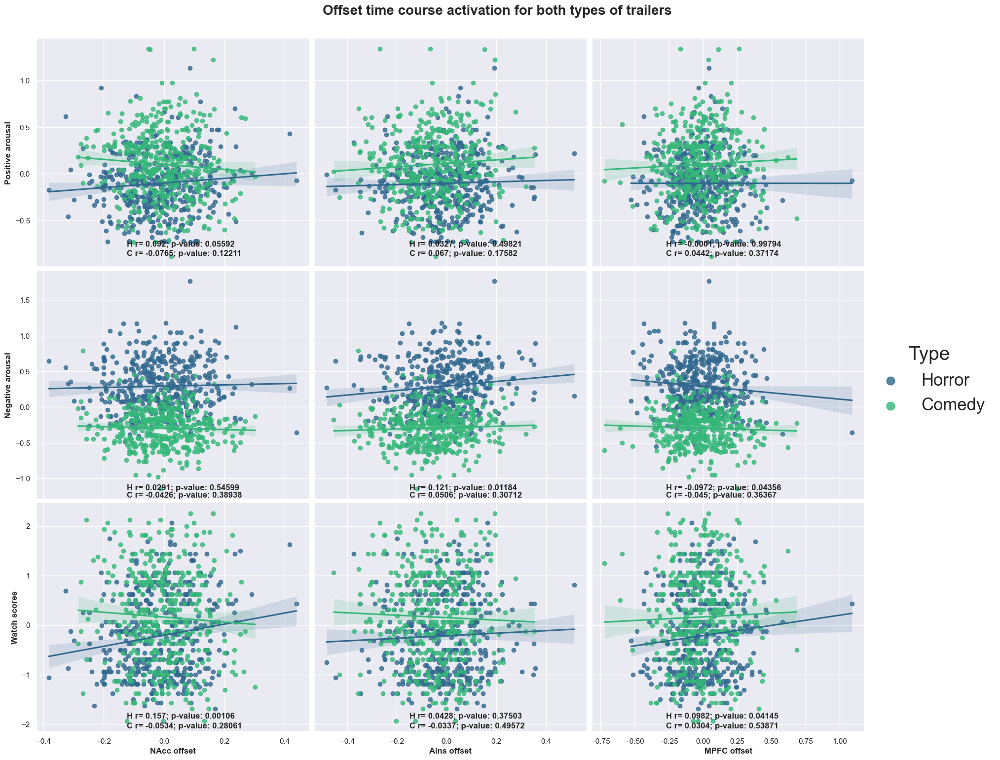

In [882]:
offset_title = 'Offset time course activation for both types of trailers'
compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "offset", offset_title)


# Neural activation middle

In [883]:
#middle_title = "Correlations for middle activation for both types of trailers"
#compute_and_plot_corrs(all_participants_cleaned_df, "middle", middle_title)

The correlation between NAcc_middle activation and positive arousal for Comedy trailers is: 0.02439 with a p-value of: 0.6224070862670464
The correlation between AIns_middle activation and positive arousal for Comedy trailers is: 0.03591 with a p-value of: 0.46838642493817945
The correlation between MPFC_middle activation and positive arousal for Comedy trailers is: -0.04213 with a p-value of: 0.39480256958239773

The correlation between NAcc_middle activation and negative arousal for Comedy trailers is: 0.03181 with a p-value of: 0.5206878135348624
The correlation between AIns_middle activation and negative arousal for Comedy trailers is: -0.0171 with a p-value of: 0.7299003686208932
The correlation between MPFC_middle activation and negative arousal for Comedy trailers is: -0.01614 with a p-value of: 0.7446069681479764

The correlation between NAcc_middle activation and watch scores for Comedy trailers is: 0.10513 with a p-value of: 0.033334587521485555
The correlation between AIns_m

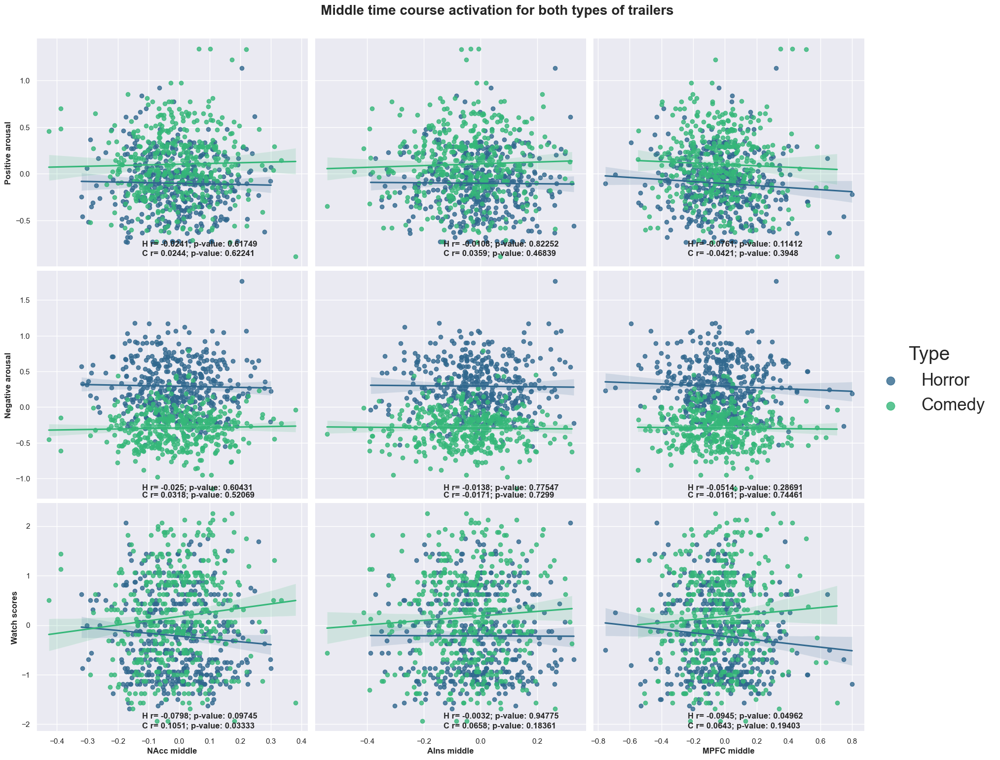

In [884]:
middle_title = 'Middle time course activation for both types of trailers'
compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "middle", middle_title)

## Neural activation onset

In [885]:
#onset_title = "Correlations for onset activation for both types of trailers"
#compute_and_plot_corrs(all_participants_cleaned_df, "onset", onset_title)

The correlation between NAcc_onset activation and positive arousal for Comedy trailers is: 0.18948 with a p-value of: 0.00011336450421203648
The correlation between AIns_onset activation and positive arousal for Comedy trailers is: 0.10295 with a p-value of: 0.03717769494167168
The correlation between MPFC_onset activation and positive arousal for Comedy trailers is: 0.09234 with a p-value of: 0.06174580583727581

The correlation between NAcc_onset activation and negative arousal for Comedy trailers is: 0.05932 with a p-value of: 0.23069528351056118
The correlation between AIns_onset activation and negative arousal for Comedy trailers is: 0.03171 with a p-value of: 0.5219279917745525
The correlation between MPFC_onset activation and negative arousal for Comedy trailers is: 0.02874 with a p-value of: 0.5617210460046166

The correlation between NAcc_onset activation and watch scores for Comedy trailers is: 0.14012 with a p-value of: 0.0044748319841028256
The correlation between AIns_onse

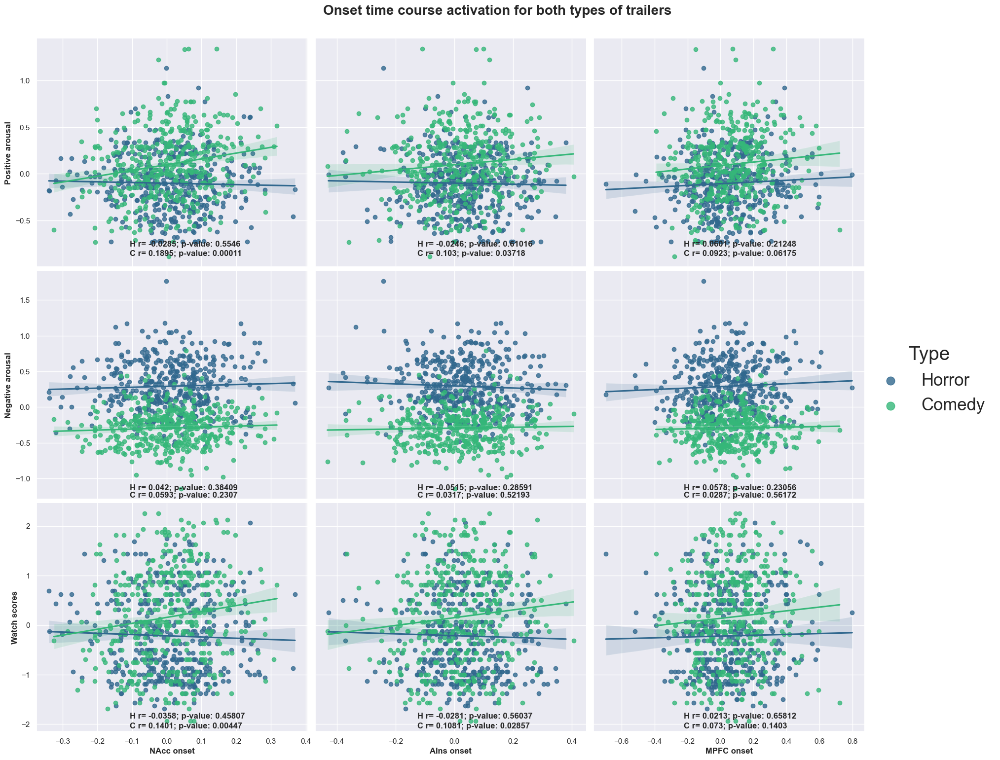

In [886]:
onset_title = 'Onset time course activation for both types of trailers'
compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "onset", onset_title)

## Individual peak (max)

In [887]:
#pos_peak_title = "Correlations for individuals positive peak activation for both types of trailers"
#compute_and_plot_corrs(all_participants_cleaned_df, "ind_peaks_pos", pos_peak_title)

The correlation between NAcc_ind_peaks_pos activation and positive arousal for Comedy trailers is: -0.00333 with a p-value of: 0.946399817758505
The correlation between AIns_ind_peaks_pos activation and positive arousal for Comedy trailers is: 0.02883 with a p-value of: 0.5604596469135404
The correlation between MPFC_ind_peaks_pos activation and positive arousal for Comedy trailers is: -0.01829 with a p-value of: 0.7119270709721639

The correlation between NAcc_ind_peaks_pos activation and negative arousal for Comedy trailers is: -0.00296 with a p-value of: 0.9524099904392549
The correlation between AIns_ind_peaks_pos activation and negative arousal for Comedy trailers is: -0.05058 with a p-value of: 0.3069477519128882
The correlation between MPFC_ind_peaks_pos activation and negative arousal for Comedy trailers is: 0.03268 with a p-value of: 0.5093523417429593

The correlation between NAcc_ind_peaks_pos activation and watch scores for Comedy trailers is: 0.03314 with a p-value of: 0.5

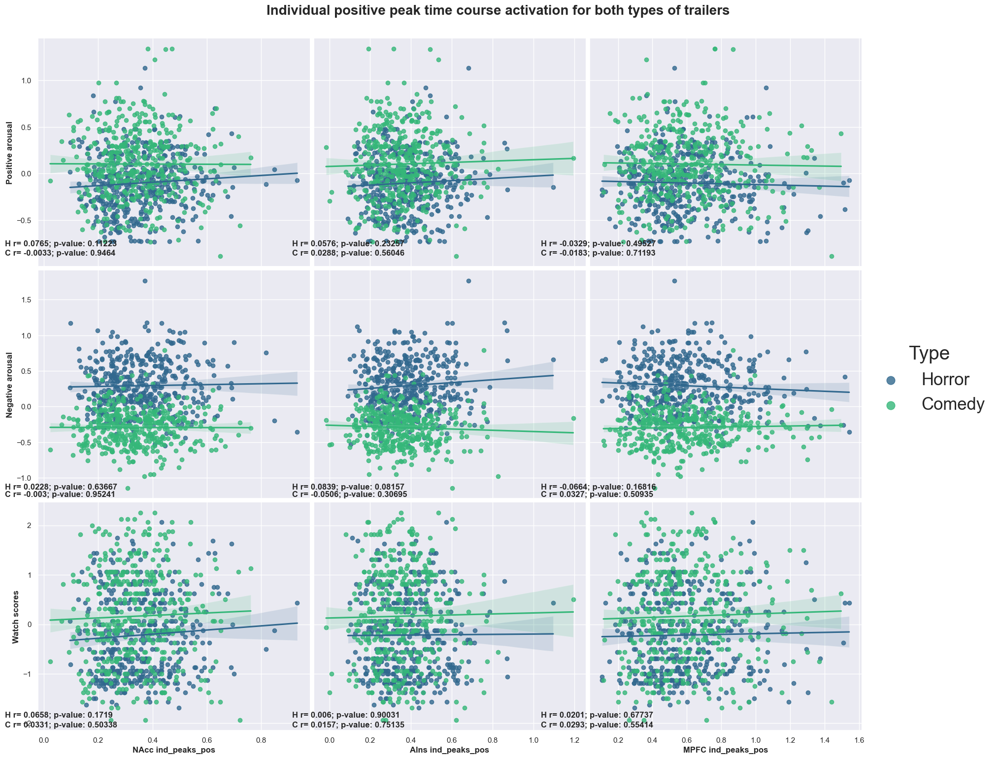

In [888]:
pos_peak_title = 'Individual positive peak time course activation for both types of trailers'
compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "ind_peaks_pos", pos_peak_title)

## Individual peaks (min)

In [889]:
# neg_peak_title = "Correlations for individual negative peak activation for both types of trailers"
# compute_and_plot_corrs(all_participants_cleaned_df, "ind_peaks_neg", neg_peak_title)

In [890]:
#neg_peak_title = 'Individuals negative peak time course activation for both types of trailers'
#compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "ind_peaks_neg", neg_peak_title)

The correlation between NAcc_dem_peak_pos activation and positive arousal for Comedy trailers is: 0.19902 with a p-value of: 4.9428308763037255e-05
The correlation between AIns_dem_peak_pos activation and positive arousal for Comedy trailers is: -0.08693 with a p-value of: 0.07873759607283173
The correlation between MPFC_dem_peak_pos activation and positive arousal for Comedy trailers is: 0.03736 with a p-value of: 0.45059216044886696

The correlation between NAcc_dem_peak_pos activation and negative arousal for Comedy trailers is: 0.05091 with a p-value of: 0.3037322049980542
The correlation between AIns_dem_peak_pos activation and negative arousal for Comedy trailers is: -0.01588 with a p-value of: 0.7485333063665681
The correlation between MPFC_dem_peak_pos activation and negative arousal for Comedy trailers is: 0.02055 with a p-value of: 0.6782883259031427

The correlation between NAcc_dem_peak_pos activation and watch scores for Comedy trailers is: 0.20715 with a p-value of: 2.360

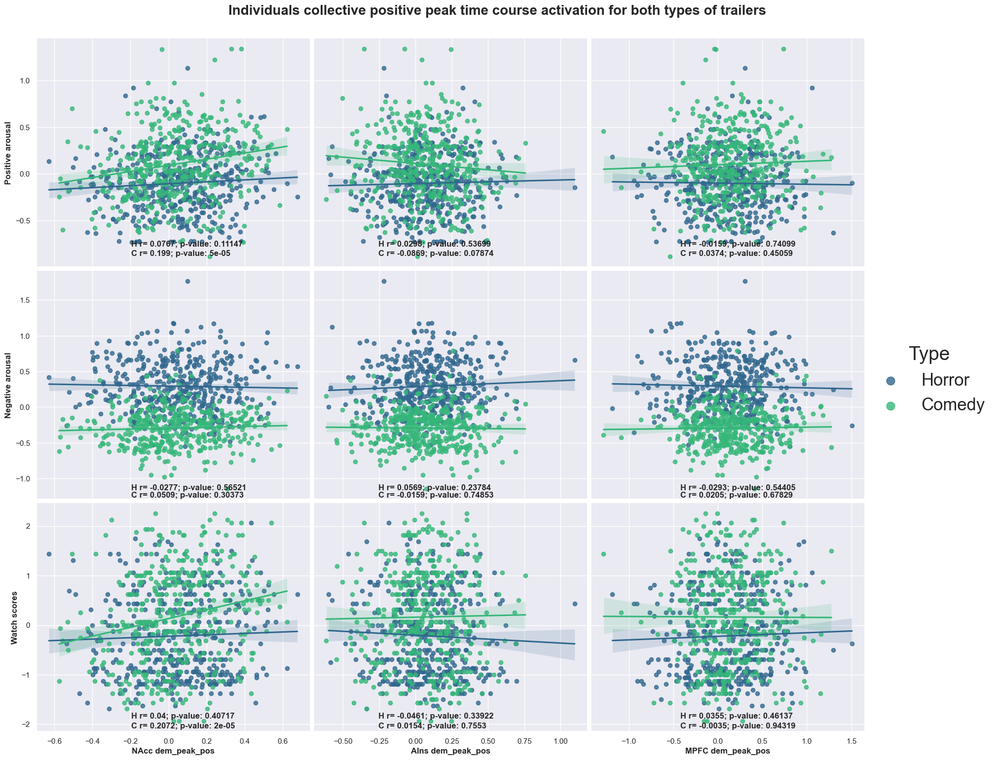

In [891]:
collective_peak_title = 'Individuals collective positive peak time course activation for both types of trailers'
compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "dem_peak_pos", collective_peak_title)

The correlation between NAcc_avg_peak_yes_pos activation and positive arousal for Comedy trailers is: 0.21949 with a p-value of: 7.2733230639729205e-06
The correlation between AIns_avg_peak_yes_pos activation and positive arousal for Comedy trailers is: 0.1648 with a p-value of: 0.0008092273333967742
The correlation between MPFC_avg_peak_yes_pos activation and positive arousal for Comedy trailers is: 0.20433 with a p-value of: 3.0634729970524075e-05

The correlation between NAcc_avg_peak_yes_pos activation and negative arousal for Comedy trailers is: 0.06704 with a p-value of: 0.17546065197581562
The correlation between AIns_avg_peak_yes_pos activation and negative arousal for Comedy trailers is: 0.04754 with a p-value of: 0.3369521329635365
The correlation between MPFC_avg_peak_yes_pos activation and negative arousal for Comedy trailers is: 0.02957 with a p-value of: 0.5504532822282628

The correlation between NAcc_avg_peak_yes_pos activation and watch scores for Comedy trailers is: 0

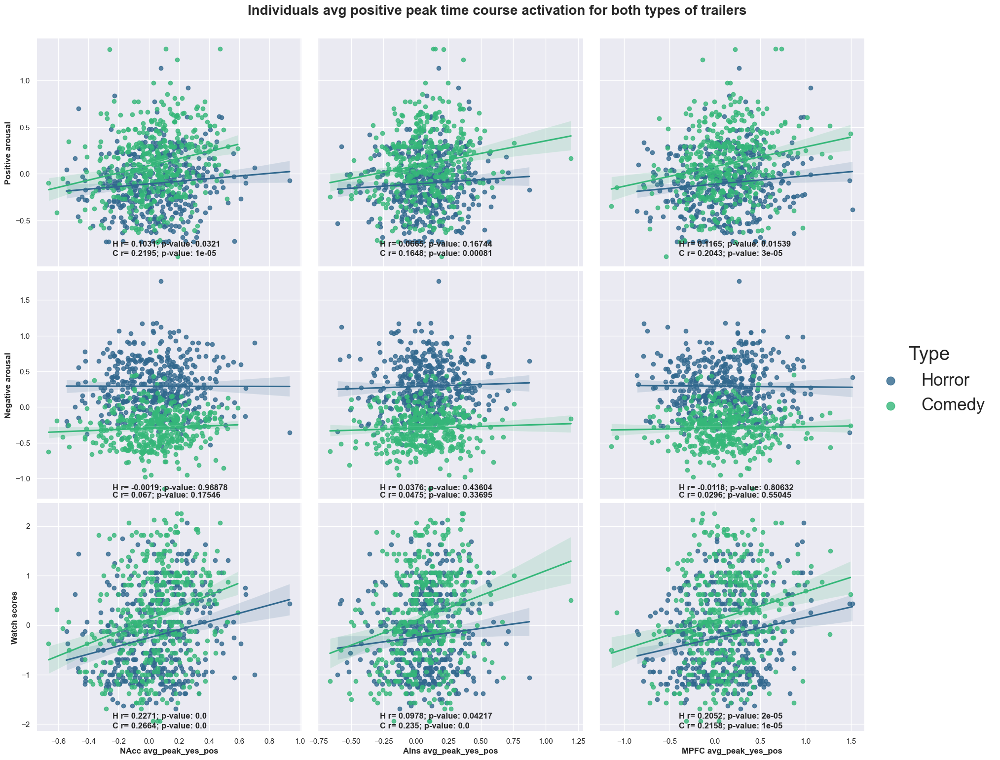

In [892]:
collective_peak_title = 'Individuals avg positive peak time course activation for both types of trailers'
compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "avg_peak_yes_pos", collective_peak_title)

## Neural ISC

In [893]:
# Correlation with Positive Arousal.
NAcc_PA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["W_score_scaled"])
AIns_W_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["W_score_scaled"])
MPFC_W_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_All_corr[1])))


For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: 0.03735 with a p-value of: 0.2789402569588263
For both types of trailers, the correlation between AIns ISC activation and positive arousal is: -0.00269 with a p-value of: 0.9377715998781279
For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: 0.04097 with a p-value of: 0.23496832501592857

For both types of trailers, the correlation between NAcc ISC activation and negative arousal is: -0.01267 with a p-value of: 0.7134522960027314
For both types of trailers, the correlation between AIns ISC activation and negative arousal is: -0.01127 with a p-value of: 0.7441160643279727
For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: 0.08337 with a p-value of: 0.015529725289140301

For both types of trailers, the correlation between NAcc ISC activation and watch scores is: 0.08529 with a p-value of: 0.013295746542

In [894]:
#ISC_all_corr = [NAcc_PA_ISC_All_corr, NAcc_NA_ISC_All_corr, NAcc_W_ISC_All_corr, AIns_PA_ISC_All_corr, AIns_NA_ISC_All_corr, AIns_W_ISC_All_corr, MPFC_PA_ISC_All_corr, MPFC_NA_ISC_All_corr, MPFC_W_ISC_All_corr]
#plot_correlations(all_subs_events_df, ISC_all_corr, "ISC", "Correlations for ISC activation for both types of trailers")


In [895]:
# ISC Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["W_score_scaled"])
AIns_W_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_C_corr[1])))


For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: 0.07132 with a p-value of: 0.1494213476658427
For comedy trailers, the correlation between AIns ISC activation and positive arousal is: 0.00632 with a p-value of: 0.8984663605004484
For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: 0.07252 with a p-value of: 0.14269859293749923

For comedy trailers, the correlation between NAcc ISC activation and negative arousal is: -0.01043 with a p-value of: 0.8332605460178544
For comedy trailers, the correlation between AIns ISC activation and negative arousal is: -0.05353 with a p-value of: 0.2795254921887157
For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: 0.00727 with a p-value of: 0.8832743830639175

For comedy trailers, the correlation between NAcc ISC activation and watch scores is: 0.11893 with a p-value of: 0.0159773887080088
For comedy trailers, the correlation between AI

In [896]:
# ISC Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["W_score_scaled"])
AIns_W_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["W_score_scaled"])
MPFC_W_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_H_corr[1])))



For horror trailers, the correlation between NAcc ISC activation and positive arousal is: -0.01442 with a p-value of: 0.7649817718363539
For horror trailers, the correlation between AIns ISC activation and positive arousal is: -0.03875 with a p-value of: 0.4217772280455679
For horror trailers, the correlation between MPFC ISC activation and positive arousal is: 0.01956 with a p-value of: 0.6852332286463775

For horror trailers, the correlation between NAcc ISC activation and negative arousal is: 0.00562 with a p-value of: 0.9073569671465352
For horror trailers, the correlation between AIns ISC activation and negative arousal is: 0.07357 with a p-value of: 0.12681133947743017
For horror trailers, the correlation between MPFC ISC activation and negative arousal is: 0.16542 with a p-value of: 0.0005563068382225988

For horror trailers, the correlation between NAcc ISC activation and watch scores is: 0.03892 with a p-value of: 0.41974987888450244
For horror trailers, the correlation betwee

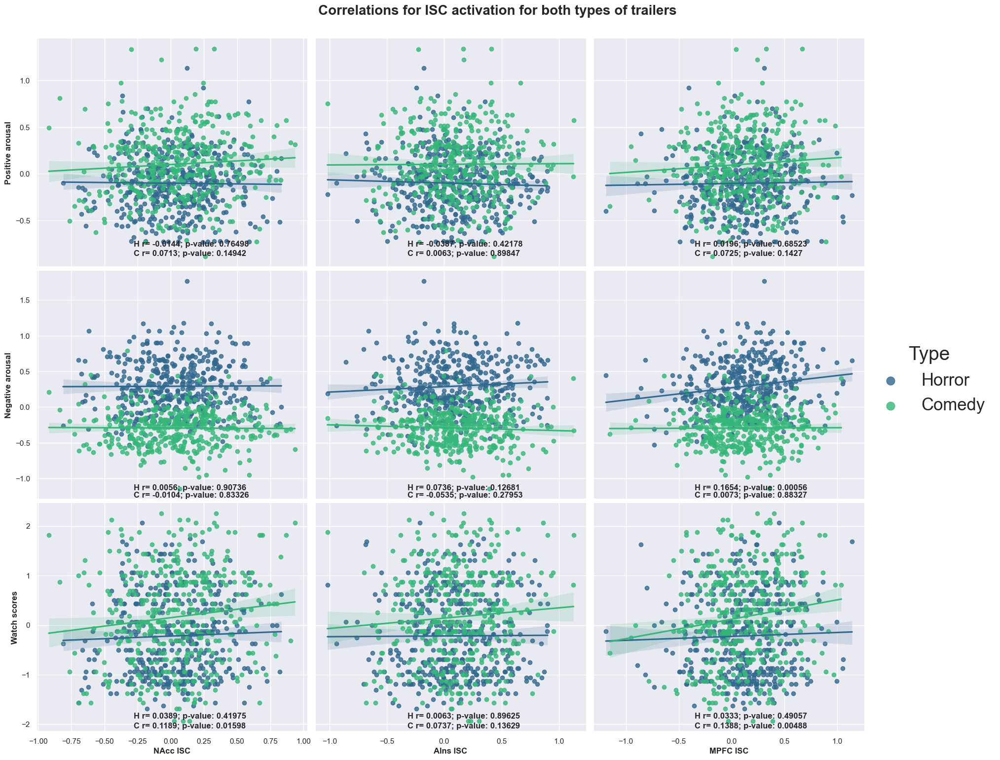

In [897]:
ISC_comedy_corr = [NAcc_PA_ISC_C_corr, NAcc_NA_ISC_C_corr, NAcc_W_ISC_C_corr, AIns_PA_ISC_C_corr, AIns_NA_ISC_C_corr, AIns_W_ISC_C_corr, MPFC_PA_ISC_C_corr, MPFC_NA_ISC_C_corr, MPFC_W_ISC_C_corr]
ISC_horror_corr = [NAcc_PA_ISC_H_corr, NAcc_NA_ISC_H_corr, NAcc_W_ISC_H_corr, AIns_PA_ISC_H_corr, AIns_NA_ISC_H_corr, AIns_W_ISC_H_corr, MPFC_PA_ISC_H_corr, MPFC_NA_ISC_H_corr, MPFC_W_ISC_H_corr]
plot_correlations3_bothTrailers(all_participants_cleaned_df, "ISC", ISC_comedy_corr, ISC_horror_corr, "Correlations for ISC activation for both types of trailers")


# Correlation Matrix for all variables.

In [898]:
relevant_cols = ['Pos_arousal_scaled', 'Neg_arousal_scaled', 'W_score_scaled',
       'NAcc_onset', 'AIns_onset', 'MPFC_onset', 'NAcc_middle', 'AIns_middle', 'MPFC_middle',
       'NAcc_offset', 'AIns_offset', 'MPFC_offset', 
       #'NAcc_ind_peaks_pos', 'AIns_ind_peaks_pos', 'MPFC_ind_peaks_pos',
       #'NAcc_ind_peaks_neg', 'AIns_ind_peaks_neg', 'MPFC_ind_peaks_neg', 
       'NAcc_ISC', 'AIns_ISC', 'MPFC_ISC',
       "NAcc_dem_peak_pos", "AIns_dem_peak_pos", "MPFC_dem_peak_pos",
       #"NAcc_dem_peak_neg", "AIns_dem_peak_neg", "MPFC_dem_peak_neg",
       "NAcc_dem_peak_pos_yes" , "AIns_dem_peak_pos_yes", "MPFC_dem_peak_pos_yes", 
       #"NAcc_dem_peak_pos_no" , "AIns_dem_peak_pos_no", "MPFC_dem_peak_pos_no",
       "NAcc_dem_slope_pos", "AIns_dem_slope_pos", "MPFC_dem_slope_pos", 
       "NAcc_dem_slope_pos_yes" , "AIns_dem_slope_pos_yes", "MPFC_dem_slope_pos_yes",
       "NAcc_avg_peak_pos", "AIns_avg_peak_pos", "MPFC_avg_peak_pos",
       "NAcc_avg_peak_yes_pos" , 'AIns_avg_peak_yes_pos', 'MPFC_avg_peak_yes_pos',
       "NAcc_avg_peak_pos2", "AIns_avg_peak_pos2", "MPFC_avg_peak_pos2",
       "NAcc_avg_peak_yes_pos2" , 'AIns_avg_peak_yes_pos2', 'MPFC_avg_peak_yes_pos2',
       #'NAcc_w', 'AIns_w', 'MPFC_w', 'NAcc_f', 'AIns_f', 'MPFC_f', 'NAcc_a', 'AIns_a', 'MPFC_a',
       #'NAcc_MPFC', 'AIns_MPFC', 'NAcc_AIns', 'NAcc_MPFC_ISFC', 'AIns_MPFC_ISFC', 'NAcc_AIns_ISFC', 'AIns_NAcc_ISFC',
       #'MPFC_NAcc_ISFC', 'MPFC_AIns_ISFC'
       ]

all_subs_events_matrix = all_subs_events_df[relevant_cols]
all_subs_events_comedy_matrix = all_subs_events_comedy[relevant_cols]
all_subs_events_horror_matrix = all_subs_events_horror[relevant_cols]
Like_horror_matrix = Like_horror_df[relevant_cols]
Dislike_horror_matrix = Dislike_horror_df[relevant_cols]

all_subs_events_matrix = all_subs_events_matrix.dropna()
all_subs_events_comedy_matrix = all_subs_events_comedy_matrix.dropna()
all_subs_events_horror_matrix = all_subs_events_horror_matrix.dropna()
Like_horror_matrix = Like_horror_matrix.dropna()
Dislike_horror_matrix = Dislike_horror_matrix.dropna()

all_subs_events_corr = all_subs_events_matrix.corr()
all_subs_events_comedy_corr = all_subs_events_comedy_matrix.corr()
all_subs_events_horror_corr = all_subs_events_horror_matrix.corr()
Like_horror_corr = Like_horror_matrix.corr()
Dislike_horror_corr = Dislike_horror_matrix.corr()



<Axes: >

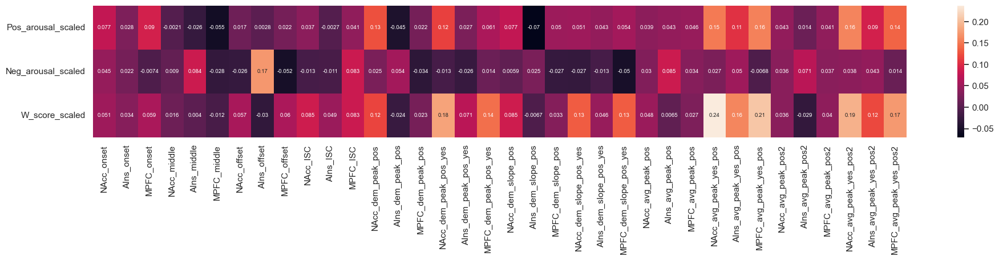

In [899]:
fig, axs = plt.subplots(1, 1, figsize=(23, 3), sharex=False) 

sns.heatmap(all_subs_events_corr.iloc[0:3, 3:], ax=axs, annot=True, annot_kws={'size':7})

<Axes: >

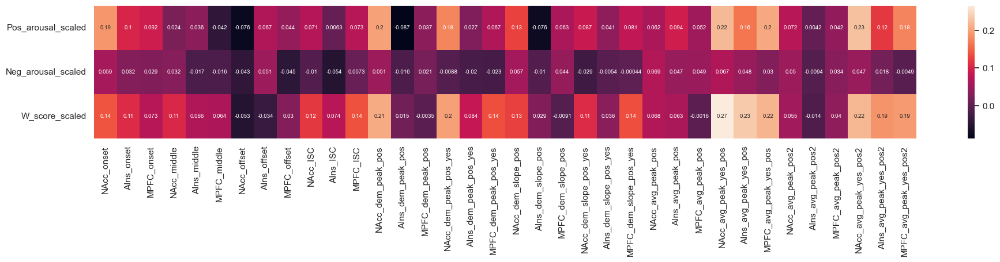

In [900]:
fig, axs = plt.subplots(1, 1, figsize=(23, 3), sharex=False) 

sns.heatmap(all_subs_events_comedy_corr.iloc[0:3, 3:], ax=axs, annot=True, annot_kws={'size':7})

<Axes: >

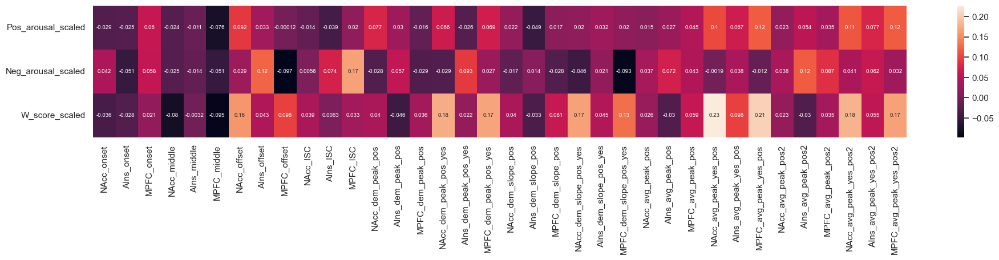

In [901]:
fig, axs = plt.subplots(1, 1, figsize=(23, 3), sharex=False) 

sns.heatmap(all_subs_events_horror_corr.iloc[0:3, 3:], ax=axs, annot=True, annot_kws={'size':7})

<Axes: >

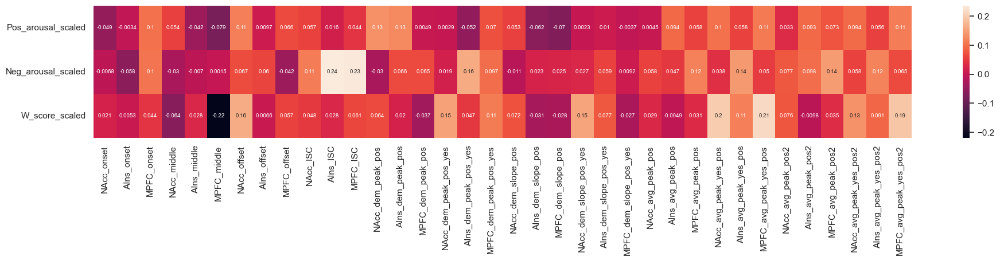

In [902]:
fig, axs = plt.subplots(1, 1, figsize=(23, 3), sharex=False) 

sns.heatmap(Like_horror_corr.iloc[0:3, 3:], ax=axs, annot=True, annot_kws={'size':7})

<Axes: >

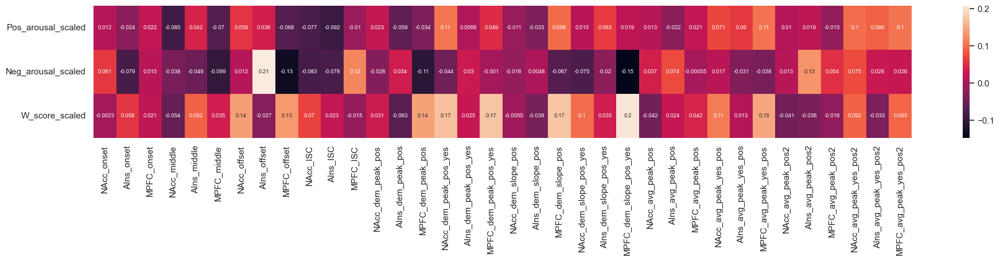

In [903]:
fig, axs = plt.subplots(1, 1, figsize=(23, 3), sharex=False) 

sns.heatmap(Dislike_horror_corr.iloc[0:3, 3:], ax=axs, annot=True, annot_kws={'size':7})

### Look at Genre preference sub-groups.

<Axes: >

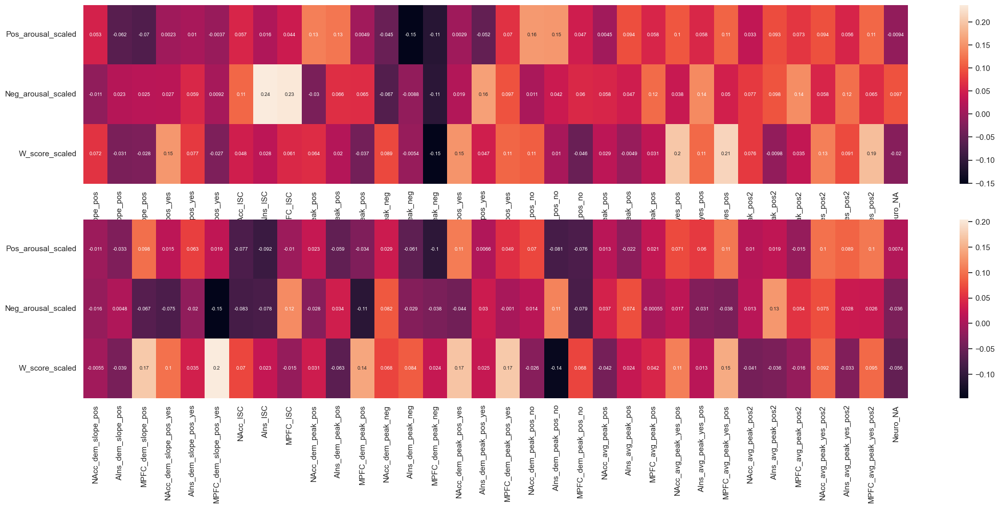

In [904]:
LH_df = all_subs_events_df[(all_subs_events_df["H_preference"] == "Like") & (all_subs_events_df["Type"] == "Horror")]
DH_df = all_subs_events_df[(all_subs_events_df["H_preference"] == "Dislike") & (all_subs_events_df["Type"] == "Horror")]

relevant_cols = ['Pos_arousal_scaled', 'Neg_arousal_scaled', 'W_score_scaled',
       "NAcc_dem_slope_pos", "AIns_dem_slope_pos", "MPFC_dem_slope_pos", 
       "NAcc_dem_slope_pos_yes" , "AIns_dem_slope_pos_yes", "MPFC_dem_slope_pos_yes",
       #'NAcc_onset', 'AIns_onset', 'MPFC_onset', 'NAcc_middle', 'AIns_middle', 'MPFC_middle',
       #'NAcc_offset', 'AIns_offset', 'MPFC_offset',
       "NAcc_ISC", "AIns_ISC", "MPFC_ISC",
       #"NAcc_LH_ISC", "AIns_LH_ISC", "MPFC_LH_ISC", "NAcc_DH_ISC", "AIns_DH_ISC", "MPFC_DH_ISC",
       #"NAcc_w", "AIns_w", #"MPFC_w", "NAcc_f", "AIns_f", "MPFC_f", "NAcc_a", "AIns_a", "MPFC_a", 
       "NAcc_dem_peak_pos", "AIns_dem_peak_pos", "MPFC_dem_peak_pos",
       "NAcc_dem_peak_neg", "AIns_dem_peak_neg", "MPFC_dem_peak_neg",
       "NAcc_dem_peak_pos_yes" , "AIns_dem_peak_pos_yes", "MPFC_dem_peak_pos_yes", 
       "NAcc_dem_peak_pos_no" , "AIns_dem_peak_pos_no", "MPFC_dem_peak_pos_no", 
       "NAcc_avg_peak_pos", "AIns_avg_peak_pos", "MPFC_avg_peak_pos",
       "NAcc_avg_peak_yes_pos" , 'AIns_avg_peak_yes_pos', 'MPFC_avg_peak_yes_pos',
       "NAcc_avg_peak_pos2", "AIns_avg_peak_pos2", "MPFC_avg_peak_pos2",
       "NAcc_avg_peak_yes_pos2" , 'AIns_avg_peak_yes_pos2', 'MPFC_avg_peak_yes_pos2',]

LH_df = LH_df[relevant_cols]
DH_df = DH_df[relevant_cols]

LH_df["Neuro_NA"] = (LH_df["AIns_avg_peak_yes_pos"] - (LH_df["NAcc_avg_peak_yes_pos"]/np.sqrt(2)))
DH_df["Neuro_NA"] = (DH_df["AIns_avg_peak_yes_pos"] - (DH_df["NAcc_avg_peak_yes_pos"]/np.sqrt(2)))

# LH_df["Neuro_NA2"] = (LH_df["AIns_offset"] - (LH_df["NAcc_dem_peak_pos"]/np.sqrt(2)))
# DH_df["Neuro_NA2"] = (DH_df["AIns_offset"] - (DH_df["NAcc_dem_peak_pos"]/np.sqrt(2)))

# LH_df["Neuro_NA3"] = (-LH_df["AIns_offset"] + (LH_df["NAcc_dem_peak_pos"]/np.sqrt(2)))
# DH_df["Neuro_NA3"] = (-DH_df["AIns_offset"] + (DH_df["NAcc_dem_peak_pos"]/np.sqrt(2)))

# LH_df["Neuro_NA4"] =  (LH_df["AIns_offset"] - (LH_df["NAcc_dem_peak_pos"]/-np.sqrt(3)))
# DH_df["Neuro_NA4"] =  (DH_df["AIns_offset"] - (DH_df["NAcc_dem_peak_pos"]/-np.sqrt(3)))

# LH_df["Neuro_NA5"] = (LH_df["AIns_offset"] - (LH_df["NAcc_dem_peak_pos_yes"]/np.sqrt(2)))
# DH_df["Neuro_NA5"] = (DH_df["AIns_offset"] - (DH_df["NAcc_dem_peak_pos_yes"]/np.sqrt(2)))

#LH_df["Neuro_NA5"] = (LH_df["NAcc_w"]*9) + (LH_df["AIns_w"]*10)
#DH_df["Neuro_NA5"] = (DH_df["AIns_dem_peak_pos"]/np.sqrt(2)) - (DH_df["NAcc_dem_peak_pos"])

#LH_df["Neuro_NA6"] = (LH_df["AIns_dem_peak_neg"]) + (LH_df["NAcc_dem_peak_pos"]/np.sqrt(2))
#DH_df["Neuro_NA6"] = (DH_df["AIns_dem_peak_neg"]) + (DH_df["NAcc_dem_peak_pos"]/np.sqrt(2))


LH_df = LH_df.dropna()
DH_df = DH_df.dropna()

LH_corr = LH_df.corr()
DH_corr = DH_df.corr()

fig, axs = plt.subplots(2, 1, figsize=(26, 10), sharex=False) 

sns.heatmap(LH_corr.iloc[:3, 3:], ax=axs[0], annot=True, annot_kws={'size':7})

sns.heatmap(DH_corr.iloc[:3, 3:], ax=axs[1], annot=True, annot_kws={'size':7})


<Axes: >

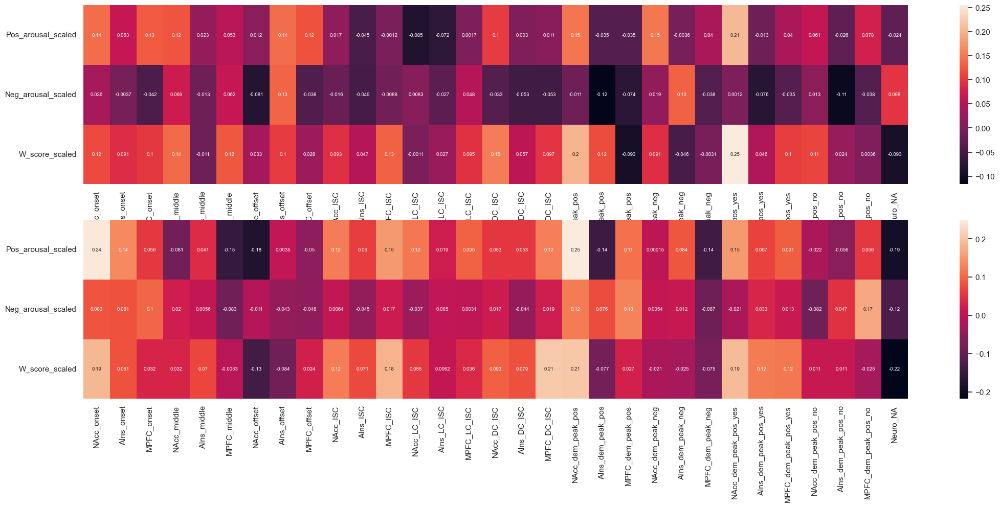

In [905]:
LC_df = all_subs_events_df[(all_subs_events_df["C_preference"] == "Like") & (all_subs_events_df["Type"] == "Comedy")]
DC_df = all_subs_events_df[(all_subs_events_df["C_preference"] == "Dislike") & (all_subs_events_df["Type"] == "Comedy")]

relevant_cols = ['Pos_arousal_scaled', 'Neg_arousal_scaled', 'W_score_scaled',
         'NAcc_onset', 'AIns_onset', 'MPFC_onset', 'NAcc_middle', 'AIns_middle', 'MPFC_middle',
         'NAcc_offset', 'AIns_offset', 'MPFC_offset', "NAcc_ISC", "AIns_ISC", "MPFC_ISC",
         "NAcc_LC_ISC", "AIns_LC_ISC", "MPFC_LC_ISC", "NAcc_DC_ISC", "AIns_DC_ISC", "MPFC_DC_ISC",
         "NAcc_dem_peak_pos", "AIns_dem_peak_pos", "MPFC_dem_peak_pos",
         "NAcc_dem_peak_neg", "AIns_dem_peak_neg", "MPFC_dem_peak_neg", 
         "NAcc_dem_peak_pos_yes" , "AIns_dem_peak_pos_yes", "MPFC_dem_peak_pos_yes", 
         "NAcc_dem_peak_pos_no" , "AIns_dem_peak_pos_no", "MPFC_dem_peak_pos_no"]

LC_df = LC_df[relevant_cols]
DC_df = DC_df[relevant_cols]

LC_df["Neuro_NA"] = (LC_df["AIns_offset"] - (LC_df["NAcc_dem_peak_pos"]/np.sqrt(2)))
DC_df["Neuro_NA"] = (DC_df["AIns_offset"] - (DC_df["NAcc_dem_peak_pos"]/np.sqrt(2)))

LC_df = LC_df.dropna()
DC_df = DC_df.dropna()

LC_corr = LC_df.corr()
DC_corr = DC_df.corr()

fig, axs = plt.subplots(2, 1, figsize=(26, 10), sharex=False)

sns.heatmap(LC_corr.iloc[:3, 3:], ax=axs[0], annot=True, annot_kws={'size':7})

sns.heatmap(DC_corr.iloc[:3, 3:], ax=axs[1], annot=True, annot_kws={'size':7})

# Neural Activation Optimize parameters.

In [906]:
# relevant_cols = ['Pos_arousal_scaled', 'Neg_arousal_scaled', 'W_score_scaled',
#        'NAcc_onset', 'AIns_onset', 'MPFC_onset', 'NAcc_middle', 'AIns_middle', 'MPFC_middle',
#        'NAcc_offset', 'AIns_offset', 'MPFC_offset', 'NAcc_ind_peaks_pos', 'AIns_ind_peaks_pos', 'MPFC_ind_peaks_pos',
#        'NAcc_ind_peaks_neg', 'AIns_ind_peaks_neg', 'MPFC_ind_peaks_neg', 
#        #'NAcc_pos_peak', 'AIns_pos_peak', 'MPFC_pos_peak', 'NAcc_neg_peak', 'AIns_neg_peak', 'MPFC_neg_peak',
#        #'NAcc_w', 'AIns_w', 'MPFC_w', 'NAcc_f', 'AIns_f', 'MPFC_f', 'NAcc_a', 'AIns_a', 'MPFC_a'
#         "NAcc_TR1" , "NAcc_TR2", "NAcc_TR3", "NAcc_TR4", "NAcc_TR5", "NAcc_TR6", "NAcc_TR7", "NAcc_TR8", 
#         "NAcc_TR9", "NAcc_TR10", "NAcc_TR11", "NAcc_TR12", "NAcc_TR13", "NAcc_TR14", "NAcc_TR15"]

# HVC_0_path = "/Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_HVC_0P.csv"
# HVC_010_path = "/Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_HVC_010P.csv"
# HVC_025_path = "/Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_HVC_025P.csv"
# HVC_05_path = "/Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_HVC_05P.csv"
# HVC_075_path = "/Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_HVC_075P.csv"
# HVC_100_path = "/Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_HVC_100P.csv"
# HVC_025_2L_path = "/Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_HVC_025P_2L.csv"
# HVC_025_3L_path = "/Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_HVC_025P_3L.csv"
# HVC_025_5L_path = "/Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_HVC_025P_5L.csv"
# HVC_025_6L_path = "/Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_HVC_025P_6L.csv"

# filter_threshold = 0.2

# HVC_0_df = process_clean_df(HVC_0_path, filter_threshold)
# HVC_010_df = process_clean_df(HVC_010_path, filter_threshold)
# HVC_025_df = process_clean_df(HVC_025_path, filter_threshold)
# HVC_05_df = process_clean_df(HVC_05_path, filter_threshold)
# HVC_075_df = process_clean_df(HVC_075_path, filter_threshold)
# HVC_100_df = process_clean_df(HVC_100_path, filter_threshold)
# HVC_025_2L_df = process_clean_df(HVC_025_2L_path, filter_threshold)
# HVC_025_3L_df = process_clean_df(HVC_025_3L_path, filter_threshold)
# HVC_025_5L_df = process_clean_df(HVC_025_5L_path, filter_threshold)
# HVC_025_6L_df = process_clean_df(HVC_025_6L_path, filter_threshold)

# HVC_0_df_C = HVC_0_df[HVC_0_df["Type"] == "Comedy"]
# HVC_010_df_C = HVC_010_df[HVC_010_df["Type"] == "Comedy"]
# HVC_025_df_C = HVC_025_df[HVC_025_df["Type"] == "Comedy"]
# HVC_05_df_C = HVC_05_df[HVC_05_df["Type"] == "Comedy"]
# HVC_075_df_C = HVC_075_df[HVC_075_df["Type"] == "Comedy"]
# HVC_100_df_C = HVC_100_df[HVC_100_df["Type"] == "Comedy"]
# HVC_025_2L_df_C = HVC_025_2L_df[HVC_025_2L_df["Type"] == "Comedy"]
# HVC_025_3L_df_C = HVC_025_3L_df[HVC_025_3L_df["Type"] == "Comedy"]
# HVC_025_5L_df_C = HVC_025_5L_df[HVC_025_5L_df["Type"] == "Comedy"]
# HVC_025_6L_df_C = HVC_025_5L_df[HVC_025_6L_df["Type"] == "Comedy"]

# HVC_0_df_C.reset_index(drop=True, inplace=True)
# HVC_010_df_C.reset_index(drop=True, inplace=True)
# HVC_025_df_C.reset_index(drop=True, inplace=True)
# HVC_05_df_C.reset_index(drop=True, inplace=True)
# HVC_075_df_C.reset_index(drop=True, inplace=True)
# HVC_100_df_C.reset_index(drop=True, inplace=True)
# HVC_025_2L_df_C.reset_index(drop=True, inplace=True)
# HVC_025_3L_df_C.reset_index(drop=True, inplace=True)
# HVC_025_5L_df_C.reset_index(drop=True, inplace=True)
# HVC_025_6L_df_C.reset_index(drop=True, inplace=True)

# HVC_0_matrix = HVC_0_df_C[relevant_cols]
# HVC_010_matrix = HVC_010_df_C[relevant_cols]
# HVC_025_matrix = HVC_025_df_C[relevant_cols]
# HVC_05_matrix = HVC_05_df_C[relevant_cols]
# HVC_075_matrix = HVC_075_df_C[relevant_cols]
# HVC_100_matrix = HVC_100_df_C[relevant_cols]
# HVC_025_2L_matrix = HVC_025_2L_df_C[relevant_cols]
# HVC_025_3L_matrix = HVC_025_3L_df_C[relevant_cols]
# HVC_025_5L_matrix = HVC_025_5L_df_C[relevant_cols]
# HVC_025_6L_matrix = HVC_025_6L_df_C[relevant_cols]

# HVC_0_matrix = HVC_0_matrix.dropna()
# HVC_010_matrix = HVC_010_matrix.dropna()
# HVC_025_matrix = HVC_025_matrix.dropna()
# HVC_05_matrix = HVC_05_matrix.dropna()
# HVC_075_matrix = HVC_075_matrix.dropna()
# HVC_100_matrix = HVC_100_matrix.dropna()
# HVC_025_2L_matrix = HVC_025_2L_matrix.dropna()
# HVC_025_3L_matrix = HVC_025_3L_matrix.dropna()
# HVC_025_5L_matrix = HVC_025_5L_matrix.dropna()
# HVC_025_6L_matrix = HVC_025_6L_matrix.dropna()

# HVC_0_corr = HVC_0_matrix.corr()
# HVC_010_corr = HVC_010_matrix.corr()
# HVC_025_corr = HVC_025_matrix.corr()
# HVC_05_corr = HVC_05_matrix.corr()
# HVC_075_corr = HVC_075_matrix.corr()
# HVC_100_corr = HVC_100_matrix.corr()
# HVC_025_2L_corr = HVC_025_2L_matrix.corr()
# HVC_025_3L_corr = HVC_025_3L_matrix.corr()
# HVC_025_5L_corr = HVC_025_5L_matrix.corr()
# HVC_025_6L_corr = HVC_025_6L_matrix.corr()

# HVC_0_corr_W = HVC_0_corr.iloc[2, 2:]
# HVC_010_corr_W = HVC_010_corr.iloc[2, 2:]
# HVC_025_corr_W = HVC_025_corr.iloc[2, 2:]
# HVC_05_corr_W = HVC_05_corr.iloc[2, 2:]
# HVC_075_corr_W = HVC_075_corr.iloc[2, 2:]
# HVC_100_corr_W = HVC_100_corr.iloc[2, 2:]
# HVC_025_2L_corr_W = HVC_025_2L_corr.iloc[2, 2:]
# HVC_025_3L_corr_W = HVC_025_3L_corr.iloc[2, 2:]
# HVC_025_5L_corr_W = HVC_025_5L_corr.iloc[2, 2:]
# HVC_025_6L_corr_W = HVC_025_6L_corr.iloc[2, 2:]

# # Concat all rows. 
# HVC_W_Comedy_corr = pd.concat([HVC_0_corr_W.T, HVC_010_corr_W.T, HVC_025_corr_W.T, HVC_05_corr_W.T, HVC_075_corr_W.T, HVC_100_corr_W.T, 
#                         HVC_025_2L_corr_W.T, HVC_025_3L_corr_W.T, HVC_025_5L_corr_W.T, HVC_025_6L_corr_W.T],
#                         axis=1, ignore_index=True).T

# HVC_W_Comedy_corr.set_index([pd.Index(["HVC_0", "HVC_010", "HVC_025", "HVC_05", "HVC_075", "HVC_100", "HVC_025_2L", 
#                                        "HVC_025_3L", "HVC_025_5L", "HVC_025_6L"])], inplace=True)


In [907]:
# For filter 1.0 -> Max correlation for comedy NAcc_onset - W_score_scaled occuers with HVC_025 (r=0.089).
# For filter 0.75 -> Max correlation for comedy NAcc_onset - W_score_scaled occuers with HVC_100 (r=0.093).
# For filter 0.5 -> Max correlation for comedy NAcc_onset - W_score_scaled occuers with HVC_25 (r=0.1).
# For filter 0.25 -> Max correlation for comedy NAcc_onset - W_score_scaled occuers with HVC_025 (r=0.11).
# For filter 0.2 -> Max correlation for comedy NAcc_onset - W_score_scaled occuers with HVC_025 (r=0.13).
# For filter 0.15 -> Max correlation for comedy NAcc_onset - W_score_scaled occuers with HVC_025 (r=0.13).
# # For filter 0.1 -> Max correlation for comedy NAcc_onset - W_score_scaled occuers with HVC_025 (r=0.13).

# fig, axs = plt.subplots(1, 1, figsize=(23, 4), sharex=False) 

# sns.heatmap(HVC_W_Comedy_corr.iloc[:, 1:], ax=axs, annot=True, annot_kws={'size':7})



In [908]:
# # HVC_0_df_H = HVC_0_df[HVC_0_df["Type"] == "Horror"]
# # HVC_010_df_H = HVC_010_df[HVC_010_df["Type"] == "Horror"]
# # HVC_025_df_H = HVC_025_df[HVC_025_df["Type"] == "Horror"]
# # HVC_05_df_H = HVC_05_df[HVC_05_df["Type"] == "Horror"]
# # HVC_075_df_H = HVC_075_df[HVC_075_df["Type"] == "Horror"]
# # HVC_100_df_H = HVC_100_df[HVC_100_df["Type"] == "Horror"]
# # HVC_025_3L_df_H = HVC_025_3L_df[HVC_025_3L_df["Type"] == "Horror"]
# # HVC_025_5L_df_H = HVC_025_5L_df[HVC_025_5L_df["Type"] == "Horror"]
# # HVC_025_6L_df_H = HVC_025_5L_df[HVC_025_6L_df["Type"] == "Horror"]

# # HVC_0_df_H["H_preference"] = "Like"
# # HVC_010_df_H["H_preference"] = "Like"
# # HVC_025_df_H["H_preference"] = "Like"
# # HVC_05_df_H["H_preference"] = "Like"
# # HVC_075_df_H["H_preference"] = "Like"
# # HVC_100_df_H["H_preference"] = "Like"
# # HVC_025_3L_df_H["H_preference"] = "Like"
# # HVC_025_5L_df_H["H_preference"] = "Like"
# # HVC_025_6L_df_H["H_preference"] = "Like"

# # Calculate Neuro_NA
# HVC_0_df_H["Neuro_NA"] = (HVC_0_df_H["AIns_TR8"] - (HVC_0_df_H["NAcc_offset"]/np.sqrt(2)))/np.sqrt(2)
# HVC_010_df_H["Neuro_NA"] = (HVC_010_df_H["AIns_TR8"] - (HVC_010_df_H["NAcc_offset"]/np.sqrt(2)))
# HVC_025_df_H["Neuro_NA"] = (HVC_025_df_H["AIns_TR8"] - (HVC_025_df_H["NAcc_offset"]/np.sqrt(2)))
# HVC_05_df_H["Neuro_NA"] = (HVC_05_df_H["AIns_TR8"] - (HVC_05_df_H["NAcc_offset"]/np.sqrt(2)))/np.sqrt(2)
# HVC_075_df_H["Neuro_NA"] = (HVC_075_df_H["AIns_TR8"] - (HVC_075_df_H["NAcc_offset"]/np.sqrt(2)))/np.sqrt(2)
# HVC_100_df_H["Neuro_NA"] = (HVC_100_df_H["AIns_TR8"] - (HVC_100_df_H["NAcc_offset"]/np.sqrt(2)))/np.sqrt(2)
# HVC_025_3L_df_H["Neuro_NA"] = (HVC_025_3L_df_H["AIns_TR8"] - (HVC_025_3L_df_H["NAcc_offset"]/np.sqrt(2)))/np.sqrt(2)
# HVC_025_5L_df_H["Neuro_NA"] = (HVC_025_5L_df_H["AIns_TR8"] - (HVC_025_5L_df_H["NAcc_offset"]/np.sqrt(2)))/np.sqrt(2)
# HVC_025_6L_df_H["Neuro_NA"] = (HVC_025_6L_df_H["AIns_TR8"] - (HVC_025_6L_df_H["NAcc_offset"]/np.sqrt(2)))/np.sqrt(2)

# # Calculate Neuro_NA2
# #HVC_0_df_H["Neuro_NA2"] = (HVC_0_df_H["AIns_f"] - (HVC_0_df_H["NAcc_f"]/np.sqrt(2)))/np.sqrt(2)
# HVC_010_df_H["Neuro_NA2"] = (HVC_010_df_H["AIns_f"] - (HVC_010_df_H["NAcc_f"]/np.sqrt(2)))
# HVC_025_df_H["Neuro_NA2"] = (HVC_025_df_H["AIns_f"] - (HVC_025_df_H["NAcc_f"]/np.sqrt(2)))
# HVC_05_df_H["Neuro_NA2"] = (HVC_05_df_H["AIns_f"] - (HVC_05_df_H["NAcc_f"]/np.sqrt(2)))/np.sqrt(2)
# HVC_075_df_H["Neuro_NA2"] = (HVC_075_df_H["AIns_f"] - (HVC_075_df_H["NAcc_f"]/np.sqrt(2)))/np.sqrt(2)
# HVC_100_df_H["Neuro_NA2"] = (HVC_100_df_H["AIns_f"] - (HVC_100_df_H["NAcc_f"]/np.sqrt(2)))/np.sqrt(2)
# HVC_025_3L_df_H["Neuro_NA2"] = (HVC_025_3L_df_H["AIns_f"] - (HVC_025_3L_df_H["NAcc_f"]/np.sqrt(2)))/np.sqrt(2)
# HVC_025_5L_df_H["Neuro_NA2"] = (HVC_025_5L_df_H["AIns_f"] - (HVC_025_5L_df_H["NAcc_f"]/np.sqrt(2)))/np.sqrt(2)
# HVC_025_6L_df_H["Neuro_NA2"] = (HVC_025_6L_df_H["AIns_f"] - (HVC_025_6L_df_H["NAcc_f"]/np.sqrt(2)))/np.sqrt(2)

# # Calulate NAcc peak ratio 
# HVC_0_df_H["NAcc_peak_alt"] = HVC_0_df_H["NAcc_ind_peaks_pos"] / HVC_0_df_H["NAcc_ind_peaks_neg"]
# HVC_010_df_H["NAcc_peak_alt"] = HVC_010_df_H["NAcc_ind_peaks_pos"] / HVC_010_df_H["NAcc_ind_peaks_neg"]
# HVC_025_df_H["NAcc_peak_alt"] = HVC_025_df_H["NAcc_ind_peaks_pos"] / HVC_025_df_H["NAcc_ind_peaks_neg"]
# HVC_05_df_H["NAcc_peak_alt"] = HVC_05_df_H["NAcc_ind_peaks_pos"] / HVC_05_df_H["NAcc_ind_peaks_neg"]
# HVC_075_df_H["NAcc_peak_alt"] = HVC_075_df_H["NAcc_ind_peaks_pos"] / HVC_075_df_H["NAcc_ind_peaks_neg"]
# HVC_100_df_H["NAcc_peak_alt"] = HVC_100_df_H["NAcc_ind_peaks_pos"] / HVC_100_df_H["NAcc_ind_peaks_neg"]
# HVC_025_3L_df_H["NAcc_peak_alt"] = HVC_025_3L_df_H["NAcc_ind_peaks_pos"] / HVC_025_3L_df_H["NAcc_ind_peaks_neg"]
# HVC_025_5L_df_H["NAcc_peak_alt"] = HVC_025_5L_df_H["NAcc_ind_peaks_pos"] / HVC_025_5L_df_H["NAcc_ind_peaks_neg"]
# HVC_025_6L_df_H["NAcc_peak_alt"] = HVC_025_6L_df_H["NAcc_ind_peaks_pos"] / HVC_025_6L_df_H["NAcc_ind_peaks_neg"]

# for participant_id in range(len(participants_list)):
#     if participants_list[participant_id] in Dislike_horror_list:
#         HVC_0_df_H.loc[HVC_0_df_H["Participant"] == participants_list[participant_id], "H_preference"] = "Dislike"
#         HVC_010_df_H.loc[HVC_010_df_H["Participant"] == participants_list[participant_id], "H_preference"] = "Dislike"
#         HVC_025_df_H.loc[HVC_025_df_H["Participant"] == participants_list[participant_id], "H_preference"] = "Dislike"
#         HVC_05_df_H.loc[HVC_05_df_H["Participant"] == participants_list[participant_id], "H_preference"] = "Dislike"
#         HVC_075_df_H.loc[HVC_075_df_H["Participant"] == participants_list[participant_id], "H_preference"] = "Dislike"
#         HVC_100_df_H.loc[HVC_100_df_H["Participant"] == participants_list[participant_id], "H_preference"] = "Dislike"
#         HVC_025_3L_df_H.loc[HVC_025_3L_df_H["Participant"] == participants_list[participant_id], "H_preference"] = "Dislike"
#         HVC_025_5L_df_H.loc[HVC_025_5L_df_H["Participant"] == participants_list[participant_id], "H_preference"] = "Dislike"
#         HVC_025_6L_df_H.loc[HVC_025_6L_df_H["Participant"] == participants_list[participant_id], "H_preference"] = "Dislike"

# # Separate the dataframes into Like and Dislike.
# HVC_0_df_H_Like = HVC_0_df_H[HVC_0_df_H["H_preference"] == "Like"].copy()
# HVC_010_df_H_Like = HVC_010_df_H[HVC_010_df_H["H_preference"] == "Like"].copy()
# HVC_025_df_H_Like = HVC_025_df_H[HVC_025_df_H["H_preference"] == "Like"].copy()
# HVC_05_df_H_Like = HVC_05_df_H[HVC_05_df_H["H_preference"] == "Like"].copy()
# HVC_075_df_H_Like = HVC_075_df_H[HVC_075_df_H["H_preference"] == "Like"].copy()
# HVC_100_df_H_Like = HVC_100_df_H[HVC_100_df_H["H_preference"] == "Like"].copy()
# HVC_025_3L_df_H_Like = HVC_025_3L_df_H[HVC_025_3L_df_H["H_preference"] == "Like"].copy()
# HVC_025_5L_df_H_Like = HVC_025_5L_df_H[HVC_025_5L_df_H["H_preference"] == "Like"].copy()
# HVC_025_6L_df_H_Like = HVC_025_6L_df_H[HVC_025_6L_df_H["H_preference"] == "Like"].copy()

# HVC_0_df_H_Dislike = HVC_0_df_H[HVC_0_df_H["H_preference"] == "Dislike"].copy()
# HVC_010_df_H_Dislike = HVC_010_df_H[HVC_010_df_H["H_preference"] == "Dislike"].copy()
# HVC_025_df_H_Dislike = HVC_025_df_H[HVC_025_df_H["H_preference"] == "Dislike"].copy()
# HVC_05_df_H_Dislike = HVC_05_df_H[HVC_05_df_H["H_preference"] == "Dislike"].copy()
# HVC_075_df_H_Dislike = HVC_075_df_H[HVC_075_df_H["H_preference"] == "Dislike"].copy()
# HVC_100_df_H_Dislike = HVC_100_df_H[HVC_100_df_H["H_preference"] == "Dislike"].copy()
# HVC_025_3L_df_H_Dislike = HVC_025_3L_df_H[HVC_025_3L_df_H["H_preference"] == "Dislike"].copy()
# HVC_025_5L_df_H_Dislike = HVC_025_5L_df_H[HVC_025_5L_df_H["H_preference"] == "Dislike"].copy()
# HVC_025_6L_df_H_Dislike = HVC_025_6L_df_H[HVC_025_6L_df_H["H_preference"] == "Dislike"].copy()

# HVC_0_df_H_Like.reset_index(drop=True, inplace=True)
# HVC_010_df_H_Like.reset_index(drop=True, inplace=True)
# HVC_025_df_H_Like.reset_index(drop=True, inplace=True)
# HVC_05_df_H_Like.reset_index(drop=True, inplace=True)
# HVC_075_df_H_Like.reset_index(drop=True, inplace=True)
# HVC_100_df_H_Like.reset_index(drop=True, inplace=True)
# HVC_025_3L_df_H_Like.reset_index(drop=True, inplace=True)
# HVC_025_5L_df_H_Like.reset_index(drop=True, inplace=True)
# HVC_025_6L_df_H_Like.reset_index(drop=True, inplace=True)

# HVC_0_df_H_Dislike.reset_index(drop=True, inplace=True)
# HVC_010_df_H_Dislike.reset_index(drop=True, inplace=True)
# HVC_025_df_H_Dislike.reset_index(drop=True, inplace=True)
# HVC_05_df_H_Dislike.reset_index(drop=True, inplace=True)
# HVC_075_df_H_Dislike.reset_index(drop=True, inplace=True)
# HVC_100_df_H_Dislike.reset_index(drop=True, inplace=True)
# HVC_025_3L_df_H_Dislike.reset_index(drop=True, inplace=True)
# HVC_025_5L_df_H_Dislike.reset_index(drop=True, inplace=True)
# HVC_025_6L_df_H_Dislike.reset_index(drop=True, inplace=True)

# relevant_cols = ['Pos_arousal_scaled', 'Neg_arousal_scaled', 'W_score_scaled', "Neuro_NA", "Neuro_NA2", "NAcc_peak_alt",
#        'NAcc_onset', 'AIns_onset', 'MPFC_onset', 'NAcc_middle', 'AIns_middle', 'MPFC_middle',
#        'NAcc_offset', 'AIns_offset', 'MPFC_offset', "NAcc_whole", "AIns_whole", "MPFC_whole", 
#        #'NAcc_ind_peaks_pos', 'AIns_ind_peaks_pos', 'MPFC_ind_peaks_pos',
#        #'NAcc_ind_peaks_neg', 'AIns_ind_peaks_neg', 'MPFC_ind_peaks_neg', 
#        #'NAcc_pos_peak', 'AIns_pos_peak', 'MPFC_pos_peak', 'NAcc_neg_peak', 'AIns_neg_peak', 'MPFC_neg_peak',
#        'NAcc_w', 'AIns_w', 'MPFC_w', 'NAcc_f', 'AIns_f', 'MPFC_f', 'NAcc_a', 'AIns_a', 'MPFC_a',
#         #"NAcc_TR1" , "NAcc_TR2", "NAcc_TR3", "NAcc_TR4", "NAcc_TR5", "NAcc_TR6", "NAcc_TR7", "NAcc_TR8", 
#         #"NAcc_TR9", "NAcc_TR10", "NAcc_TR11", "NAcc_TR12", "NAcc_TR13", "NAcc_TR14", "NAcc_TR15",
#         #"AIns_TR1" , "AIns_TR2", "AIns_TR3", "AIns_TR4", "AIns_TR5", "AIns_TR6", "AIns_TR7", "AIns_TR8",
#         #"AIns_TR9", "AIns_TR10", "AIns_TR11", "AIns_TR12", "AIns_TR13", "AIns_TR14", "AIns_TR15", 
#         #"MPFC_TR1" , "MPFC_TR2", "MPFC_TR3", "MPFC_TR4", "MPFC_TR5", "MPFC_TR6", "MPFC_TR7", "MPFC_TR8",
#         #"MPFC_TR9", "MPFC_TR10", "MPFC_TR11", "MPFC_TR12", "MPFC_TR13", "MPFC_TR14", "MPFC_TR15"
#         ]

# #HVC_0_matrix_H_Like = HVC_0_df_H_Like[relevant_cols]
# HVC_010_matrix_H_Like = HVC_010_df_H_Like[relevant_cols]
# HVC_025_matrix_H_Like = HVC_025_df_H_Like[relevant_cols]
# HVC_05_matrix_H_Like = HVC_05_df_H_Like[relevant_cols]
# HVC_075_matrix_H_Like = HVC_075_df_H_Like[relevant_cols]
# HVC_100_matrix_H_Like = HVC_100_df_H_Like[relevant_cols]
# HVC_025_3L_matrix_H_Like = HVC_025_3L_df_H_Like[relevant_cols]
# HVC_025_5L_matrix_H_Like = HVC_025_5L_df_H_Like[relevant_cols]
# HVC_025_6L_matrix_H_Like = HVC_025_6L_df_H_Like[relevant_cols]

# #HVC_0_matrix_H_Dislike = HVC_0_df_H_Dislike[relevant_cols]
# HVC_010_matrix_H_Dislike = HVC_010_df_H_Dislike[relevant_cols]
# HVC_025_matrix_H_Dislike = HVC_025_df_H_Dislike[relevant_cols]
# HVC_05_matrix_H_Dislike = HVC_05_df_H_Dislike[relevant_cols]
# HVC_075_matrix_H_Dislike = HVC_075_df_H_Dislike[relevant_cols]
# HVC_100_matrix_H_Dislike = HVC_100_df_H_Dislike[relevant_cols]
# HVC_025_3L_matrix_H_Dislike = HVC_025_3L_df_H_Dislike[relevant_cols]
# HVC_025_5L_matrix_H_Dislike = HVC_025_5L_df_H_Dislike[relevant_cols]
# HVC_025_6L_matrix_H_Dislike = HVC_025_6L_df_H_Dislike[relevant_cols]

# #HVC_0_matrix_H_Like = HVC_0_matrix_H_Like.dropna()
# HVC_010_matrix_H_Like = HVC_010_matrix_H_Like.dropna()
# HVC_025_matrix_H_Like = HVC_025_matrix_H_Like.dropna()
# HVC_05_matrix_H_Like = HVC_05_matrix_H_Like.dropna()
# HVC_075_matrix_H_Like = HVC_075_matrix_H_Like.dropna()
# HVC_100_matrix_H_Like = HVC_100_matrix_H_Like.dropna()
# HVC_025_3L_matrix_H_Like = HVC_025_3L_matrix_H_Like.dropna()
# HVC_025_5L_matrix_H_Like = HVC_025_5L_matrix_H_Like.dropna()
# HVC_025_6L_matrix_H_Like = HVC_025_6L_matrix_H_Like.dropna()

# #HVC_0_matrix_H_Dislike = HVC_0_matrix_H_Dislike.dropna()
# HVC_010_matrix_H_Dislike = HVC_010_matrix_H_Dislike.dropna()
# HVC_025_matrix_H_Dislike = HVC_025_matrix_H_Dislike.dropna()
# HVC_05_matrix_H_Dislike = HVC_05_matrix_H_Dislike.dropna()
# HVC_075_matrix_H_Dislike = HVC_075_matrix_H_Dislike.dropna()
# HVC_100_matrix_H_Dislike = HVC_100_matrix_H_Dislike.dropna()
# HVC_025_3L_matrix_H_Dislike = HVC_025_3L_matrix_H_Dislike.dropna()
# HVC_025_5L_matrix_H_Dislike = HVC_025_5L_matrix_H_Dislike.dropna()
# HVC_025_6L_matrix_H_Dislike = HVC_025_6L_matrix_H_Dislike.dropna()

# #HVC_0_corr_H_Like = HVC_0_matrix_H_Like.corr()
# HVC_010_corr_H_Like = HVC_010_matrix_H_Like.corr()
# HVC_025_corr_H_Like = HVC_025_matrix_H_Like.corr()
# HVC_05_corr_H_Like = HVC_05_matrix_H_Like.corr()
# HVC_075_corr_H_Like = HVC_075_matrix_H_Like.corr()
# HVC_100_corr_H_Like = HVC_100_matrix_H_Like.corr()
# HVC_025_3L_corr_H_Like = HVC_025_3L_matrix_H_Like.corr()
# HVC_025_5L_corr_H_Like = HVC_025_5L_matrix_H_Like.corr()
# HVC_025_6L_corr_H_Like = HVC_025_6L_matrix_H_Like.corr()

# #HVC_0_corr_H_Dislike = HVC_0_matrix_H_Dislike.corr()
# HVC_010_corr_H_Dislike = HVC_010_matrix_H_Dislike.corr()
# HVC_025_corr_H_Dislike = HVC_025_matrix_H_Dislike.corr()
# HVC_05_corr_H_Dislike = HVC_05_matrix_H_Dislike.corr()
# HVC_075_corr_H_Dislike = HVC_075_matrix_H_Dislike.corr()
# HVC_100_corr_H_Dislike = HVC_100_matrix_H_Dislike.corr()
# HVC_025_3L_corr_H_Dislike = HVC_025_3L_matrix_H_Dislike.corr()
# HVC_025_5L_corr_H_Dislike = HVC_025_5L_matrix_H_Dislike.corr()
# HVC_025_6L_corr_H_Dislike = HVC_025_6L_matrix_H_Dislike.corr()

# #HVC_0_corr_H_Like_W = HVC_0_corr_H_Like.iloc[2, 2:]
# HVC_010_corr_H_Like_W = HVC_010_corr_H_Like.iloc[2, 2:]
# HVC_025_corr_H_Like_W = HVC_025_corr_H_Like.iloc[2, 2:]
# HVC_05_corr_H_Like_W = HVC_05_corr_H_Like.iloc[2, 2:]
# HVC_075_corr_H_Like_W = HVC_075_corr_H_Like.iloc[2, 2:]
# HVC_100_corr_H_Like_W = HVC_100_corr_H_Like.iloc[2, 2:]
# HVC_025_3L_corr_H_Like_W = HVC_025_3L_corr_H_Like.iloc[2, 2:]
# HVC_025_5L_corr_H_Like_W = HVC_025_5L_corr_H_Like.iloc[2, 2:]
# HVC_025_6L_corr_H_Like_W = HVC_025_6L_corr_H_Like.iloc[2, 2:]

# #HVC_0_corr_H_Dislike_W = HVC_0_corr_H_Dislike.iloc[2, 2:]
# HVC_010_corr_H_Dislike_W = HVC_010_corr_H_Dislike.iloc[2, 2:]
# HVC_025_corr_H_Dislike_W = HVC_025_corr_H_Dislike.iloc[2, 2:]
# HVC_05_corr_H_Dislike_W = HVC_05_corr_H_Dislike.iloc[2, 2:]
# HVC_075_corr_H_Dislike_W = HVC_075_corr_H_Dislike.iloc[2, 2:]
# HVC_100_corr_H_Dislike_W = HVC_100_corr_H_Dislike.iloc[2, 2:]
# HVC_025_3L_corr_H_Dislike_W = HVC_025_3L_corr_H_Dislike.iloc[2, 2:]
# HVC_025_5L_corr_H_Dislike_W = HVC_025_5L_corr_H_Dislike.iloc[2, 2:]
# HVC_025_6L_corr_H_Dislike_W = HVC_025_6L_corr_H_Dislike.iloc[2, 2:]

# # Concat all rows. #HVC_0_corr_H_Like_W.T,
# HVC_W_Horror_Like_corr = pd.concat([HVC_010_corr_H_Like_W.T, HVC_025_corr_H_Like_W.T, HVC_05_corr_H_Like_W.T, HVC_075_corr_H_Like_W.T, HVC_100_corr_H_Like_W.T, 
#                         HVC_025_3L_corr_H_Like_W.T, HVC_025_5L_corr_H_Like_W.T, HVC_025_6L_corr_H_Like_W.T], axis=1,
#                        ignore_index=True).T
# #"HVC_0", 
# HVC_W_Horror_Like_corr.set_index([pd.Index(["HVC_010", "HVC_025", "HVC_05", "HVC_075", "HVC_100", "HVC_025_3L", "HVC_025_5L",
#                                 "HVC_025_6L"])], inplace=True)

# #HVC_0_corr_H_Dislike_W.T,
# HVC_W_Horror_Dislike_corr = pd.concat([ HVC_010_corr_H_Dislike_W.T, HVC_025_corr_H_Dislike_W.T, HVC_05_corr_H_Dislike_W.T, HVC_075_corr_H_Dislike_W.T, HVC_100_corr_H_Dislike_W.T,
#                         HVC_025_3L_corr_H_Dislike_W.T, HVC_025_5L_corr_H_Dislike_W.T, HVC_025_6L_corr_H_Dislike_W.T], axis=1,
#                           ignore_index=True).T
# #"HVC_0",
# HVC_W_Horror_Dislike_corr.set_index([pd.Index([ "HVC_010", "HVC_025", "HVC_05", "HVC_075", "HVC_100", "HVC_025_3L", "HVC_025_5L",
#                                 "HVC_025_6L"])], inplace=True)




In [909]:
# fig, axs = plt.subplots(2, 1, figsize=(26, 10), sharex=False) 

# sns.heatmap(HVC_W_Horror_Like_corr.iloc[:, 1:], ax=axs[0], annot=True, annot_kws={'size':7})

# sns.heatmap(HVC_W_Horror_Dislike_corr.iloc[:, 1:], ax=axs[1], annot=True, annot_kws={'size':7})

# Format data for LMM analysis.

In [910]:
# Save data from individual choice analysis. 
all_subs_events_df.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_ISC.csv')
all_subs_events_comedy.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_ISC_Comedy.csv')
all_subs_events_horror.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_ISC_Horror.csv')

In [911]:
# Open a datasets directory. 
fd = os.open("/Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData", os.O_RDONLY)

# Use os.fchdir() method to change the current dir/folder.
os.fchdir(fd)

# Safe check- Print current working directory
print("Current working dir : %s" % os.getcwd())

root_path = os.getcwd()

Current working dir : /Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData


In [912]:
# Get average neural signals for each trailer. 
aggregate_df = all_participants_cleaned_df.groupby("Trailer", as_index=False, dropna=False).mean()
aggregate_df.reset_index(inplace=True)

# Create df with only people that said 'yes' to Watch questions. 
all_participants_cleaned_yes_df = all_participants_cleaned_df[all_participants_cleaned_df["Watch_choice"] == "Yes"]
aggregate_yes_df = all_participants_cleaned_yes_df.groupby("Trailer", as_index=False, dropna=False).mean()
aggregate_yes_df.reset_index(inplace=True)

Like_horror_aggreate_df = Like_horror_df.groupby("Trailer", as_index=False, dropna=False).mean()
Like_horror_aggreate_df.reset_index(inplace=True)
Like_horror_aggreate_df["Type"] = "horror"

# Get average for Like-Comedy (LC).
LC_df = all_subs_events_df[(all_subs_events_df["C_preference"] == "Like") & (all_subs_events_df["Type"] == "Comedy")]
LC_aggregate_df = LC_df.groupby("Trailer", as_index=False, dropna=False).mean()
LC_aggregate_df.reset_index(inplace=True)
LC_aggregate_df["Type"] = "comedy"

LC_yes_df = all_subs_events_df[(all_participants_cleaned_df["Watch_choice"] == "Yes") & (all_subs_events_df["Type"] == "Comedy")]
LC_aggregate_yes_df = LC_yes_df.groupby("Trailer", as_index=False, dropna=False).mean()
LC_aggregate_yes_df.reset_index(inplace=True)
LC_aggregate_yes_df["Type"] = "comedy"

# Get average for Like-Horror (LH).
LH_df = all_subs_events_df[(all_subs_events_df["H_preference"] == "Like") & (all_subs_events_df["Type"] == "Horror")]
LH_aggregate_df = LH_df.groupby("Trailer", as_index=False, dropna=False).mean()
LH_aggregate_df.reset_index(inplace=True)
LH_aggregate_df["Type"] = "horror"

LH_yes_df = all_subs_events_df[(all_participants_cleaned_df["Watch_choice"] == "Yes") & (all_subs_events_df["Type"] == "Horror")]
LH_aggregate_yes_df = LH_yes_df.groupby("Trailer", as_index=False, dropna=False).mean()
LH_aggregate_yes_df.reset_index(inplace=True)
LH_aggregate_yes_df["Type"] = "horror"

relevant_cols = ["Trailer", 'Pos_arousal_scaled', 'Neg_arousal_scaled', 'W_score_scaled',
         'NAcc_onset', 'AIns_onset', 'MPFC_onset', 'NAcc_middle', 'AIns_middle', 'MPFC_middle',
         'NAcc_offset', 'AIns_offset', 'MPFC_offset', "NAcc_ISC", "AIns_ISC", "MPFC_ISC",
         "NAcc_LC_ISC", "AIns_LC_ISC", "MPFC_LC_ISC", "NAcc_DC_ISC", "AIns_DC_ISC", "MPFC_DC_ISC",
         "NAcc_dem_peak_pos", "AIns_dem_peak_pos", "MPFC_dem_peak_pos",
         "NAcc_dem_peak_neg", "AIns_dem_peak_neg", "MPFC_dem_peak_neg", 
         "NAcc_dem_peak_pos_yes" , "AIns_dem_peak_pos_yes", "MPFC_dem_peak_pos_yes", 
         "NAcc_dem_peak_pos_no" , "AIns_dem_peak_pos_no", "MPFC_dem_peak_pos_no"]

NAcc_TRs_keys = ['NAcc_TR1', 'NAcc_TR2', 'NAcc_TR3', 'NAcc_TR4', 'NAcc_TR5', 
                'NAcc_TR6', 'NAcc_TR7', 'NAcc_TR8', 'NAcc_TR9', 'NAcc_TR10',
                'NAcc_TR11', 'NAcc_TR12', 'NAcc_TR13', 'NAcc_TR14', 'NAcc_TR15']

AIns_TRs_keys = ['AIns_TR1', 'AIns_TR2', 'AIns_TR3', 'AIns_TR4', 'AIns_TR5',
                'AIns_TR6', 'AIns_TR7', 'AIns_TR8', 'AIns_TR9', 'AIns_TR10',
                'AIns_TR11', 'AIns_TR12', 'AIns_TR13', 'AIns_TR14', 'AIns_TR15']

MPFC_TRs_keys = ['MPFC_TR1', 'MPFC_TR2', 'MPFC_TR3', 'MPFC_TR4', 'MPFC_TR5',
                'MPFC_TR6', 'MPFC_TR7', 'MPFC_TR8', 'MPFC_TR9', 'MPFC_TR10',
                'MPFC_TR11', 'MPFC_TR12', 'MPFC_TR13', 'MPFC_TR14', 'MPFC_TR15']

# LC_df = LC_df[relevant_cols + NAcc_TRs_keys + AIns_TRs_keys + MPFC_TRs_keys]
# Like_comedy_aggregate_df = LC_df.groupby("Trailer", as_index=False, dropna=False).mean()
# Like_comedy_aggregate_df.reset_index(inplace=True)
# Like_comedy_aggregate_df["Type"] = "comedy"



/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_32976/4279083541.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  LC_yes_df = all_subs_events_df[(all_participants_cleaned_df["Watch_choice"] == "Yes") & (all_subs_events_df["Type"] == "Comedy")]
/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_32976/4279083541.py:31: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  LH_yes_df = all_subs_events_df[(all_participants_cleaned_df["Watch_choice"] == "Yes") & (all_subs_events_df["Type"] == "Horror")]


In [913]:
# Create lists to store values. 
NAcc_trailer_peak_pos = []
AIns_trailer_peak_pos = []
MPFC_trailer_peak_pos = []

NAcc_trailer_peak_pos_id = []
AIns_trailer_peak_pos_id = []
MPFC_trailer_peak_pos_id = []

NAcc_trailer_peak_pos_yes = []
AIns_trailer_peak_pos_yes = []
MPFC_trailer_peak_pos_yes = []

# Define keys. 
NAcc_TRs_keys = ['NAcc_TR1', 'NAcc_TR2', 'NAcc_TR3', 'NAcc_TR4', 'NAcc_TR5', 
                'NAcc_TR6', 'NAcc_TR7', 'NAcc_TR8', 'NAcc_TR9', 'NAcc_TR10',
                'NAcc_TR11', 'NAcc_TR12', 'NAcc_TR13', 'NAcc_TR14', 'NAcc_TR15']

AIns_TRs_keys = ['AIns_TR1', 'AIns_TR2', 'AIns_TR3', 'AIns_TR4', 'AIns_TR5',
                'AIns_TR6', 'AIns_TR7', 'AIns_TR8', 'AIns_TR9', 'AIns_TR10',
                'AIns_TR11', 'AIns_TR12', 'AIns_TR13', 'AIns_TR14', 'AIns_TR15']

MPFC_TRs_keys = ['MPFC_TR1', 'MPFC_TR2', 'MPFC_TR3', 'MPFC_TR4', 'MPFC_TR5',
                'MPFC_TR6', 'MPFC_TR7', 'MPFC_TR8', 'MPFC_TR9', 'MPFC_TR10',
                'MPFC_TR11', 'MPFC_TR12', 'MPFC_TR13', 'MPFC_TR14', 'MPFC_TR15']

# Calculate each trailer peak activation.
for trailer_id in range(aggregate_df.shape[0]):
    
    # Get time course for each region.
    NAcc_time_course = np.array(aggregate_df.iloc[trailer_id][NAcc_TRs_keys]).flatten()
    AIns_time_course = np.array(aggregate_df.iloc[trailer_id][AIns_TRs_keys]).flatten()
    MPFC_time_course = np.array(aggregate_df.iloc[trailer_id][MPFC_TRs_keys]).flatten()

    NAcc_time_course_yes = np.array(aggregate_yes_df.iloc[trailer_id][NAcc_TRs_keys]).flatten()
    AIns_time_course_yes = np.array(aggregate_yes_df.iloc[trailer_id][AIns_TRs_keys]).flatten()
    MPFC_time_course_yes = np.array(aggregate_yes_df.iloc[trailer_id][MPFC_TRs_keys]).flatten()

    # Get peak activation for each region.
    NAcc_peak_pos, NAcc_peak_pos_id = get_trailer_peak(NAcc_time_course, "max")
    AIns_peak_pos, AIns_peak_pos_id = get_trailer_peak(AIns_time_course, "max")
    MPFC_peak_pos, MPFC_peak_pos_id = get_trailer_peak(MPFC_time_course, "max")

    # NAcc_peak_neg = get_trailer_peak(NAcc_time_course, "min")
    # AIns_peak_neg = get_trailer_peak(AIns_time_course, "min")
    # MPFC_peak_neg = get_trailer_peak(MPFC_time_course, "min")

    NAcc_peak_pos_yes, _ = get_trailer_peak(NAcc_time_course_yes, "max")
    AIns_peak_pos_yes, _ = get_trailer_peak(AIns_time_course_yes, "max")
    MPFC_peak_pos_yes, _ = get_trailer_peak(MPFC_time_course_yes, "max")

    # Append values to lists.
    NAcc_trailer_peak_pos.append(NAcc_peak_pos)
    AIns_trailer_peak_pos.append(AIns_peak_pos)
    MPFC_trailer_peak_pos.append(MPFC_peak_pos)

    NAcc_trailer_peak_pos_id.append(NAcc_peak_pos_id)
    AIns_trailer_peak_pos_id.append(AIns_peak_pos_id)
    MPFC_trailer_peak_pos_id.append(MPFC_peak_pos_id)

    # NAcc_trailer_peak_neg.append(NAcc_peak_neg)
    # AIns_trailer_peak_neg.append(AIns_peak_neg)
    # MPFC_trailer_peak_neg.append(MPFC_peak_neg)

    NAcc_trailer_peak_pos_yes.append(NAcc_peak_pos_yes)
    AIns_trailer_peak_pos_yes.append(AIns_peak_pos_yes)
    MPFC_trailer_peak_pos_yes.append(MPFC_peak_pos_yes)


# Add values to dataframe.
aggregate_df["NAcc_trailer_peak_pos"] = NAcc_trailer_peak_pos
aggregate_df["AIns_trailer_peak_pos"] = AIns_trailer_peak_pos
aggregate_df["MPFC_trailer_peak_pos"] = MPFC_trailer_peak_pos

aggregate_df["NAcc_trailer_peak_pos_id"] = NAcc_trailer_peak_pos_id
aggregate_df["AIns_trailer_peak_pos_id"] = AIns_trailer_peak_pos_id
aggregate_df["MPFC_trailer_peak_pos_id"] = MPFC_trailer_peak_pos_id

# aggregate_df["NAcc_trailer_peak_neg"] = NAcc_trailer_peak_neg
# aggregate_df["AIns_trailer_peak_neg"] = AIns_trailer_peak_neg
# aggregate_df["MPFC_trailer_peak_neg"] = MPFC_trailer_peak_neg

aggregate_df["NAcc_trailer_peak_pos_yes"] = NAcc_trailer_peak_pos_yes
aggregate_df["AIns_trailer_peak_pos_yes"] = AIns_trailer_peak_pos_yes
aggregate_df["MPFC_trailer_peak_pos_yes"] = MPFC_trailer_peak_pos_yes

aggregate_df.head()

,index,Trailer,Unnamed: 0,Onset,Offset,Duration,W_score,A_score,F_score,NAcc_onset,...,Avg_peaks_pos_yes_cooks,NAcc_trailer_peak_pos,AIns_trailer_peak_pos,MPFC_trailer_peak_pos,NAcc_trailer_peak_pos_id,AIns_trailer_peak_pos_id,MPFC_trailer_peak_pos_id,NAcc_trailer_peak_pos_yes,AIns_trailer_peak_pos_yes,MPFC_trailer_peak_pos_yes
0,0,rc1,415.652174,108.0,138.0,30.0,2.869565,2.652174,3.521739,0.057765,...,0.033744,0.059055,-0.016260,0.122347,3,13,0,0.114596,0.051519,0.151558
1,1,rc10,484.791667,568.0,598.0,30.0,2.375000,2.083333,3.166667,-0.025969,...,0.021863,0.075246,0.007302,0.125133,7,14,9,0.144008,0.038928,0.157189
2,2,rc11,464.608696,512.0,542.0,30.0,2.130435,1.739130,3.260870,0.014519,...,0.022552,0.024890,0.062391,0.181570,2,2,2,0.015200,0.188232,0.302070
3,3,rc12,459.592593,656.0,686.0,30.0,2.000000,1.703704,3.037037,-0.043671,...,0.024811,0.041741,0.046880,0.066798,11,0,9,0.089002,0.096288,0.312840
4,4,rc2,431.192308,108.0,138.0,30.0,1.961538,1.846154,2.846154,0.000186,...,0.018273,0.037008,0.101838,0.218573,1,1,0,0.174147,0.212355,0.127761


In [914]:
# Get list of trailers in dataframe.
all_trailer_list = aggregate_df["Trailer"].unique().tolist()
horror_trailer_list = aggregate_df["Trailer"].unique().tolist()
comedy_trailer_list = LC_df["Trailer"].unique().tolist()

# Calculate trailer peak for horror sub-group. 
NAcc_trailer_peak_pos_LH = []
AIns_trailer_peak_pos_LH = []
MPFC_trailer_peak_pos_LH = []

NAcc_trailer_peak_yes_LH = []
AIns_trailer_peak_yes_LH = []
MPFC_trailer_peak_yes_LH = []

# Calculate each trailer peak activation.
for num_id in range(LH_aggregate_df.shape[0]):

    NAcc_time_course_LH = np.array(LH_aggregate_df.iloc[num_id][NAcc_TRs_keys]).flatten()
    AIns_time_course_LH = np.array(LH_aggregate_df.iloc[num_id][AIns_TRs_keys]).flatten()
    MPFC_time_course_LH = np.array(LH_aggregate_df.iloc[num_id][MPFC_TRs_keys]).flatten()

    NAcc_time_course_yes_LH = np.array(LH_aggregate_yes_df.iloc[num_id][NAcc_TRs_keys]).flatten()
    AIns_time_course_yes_LH = np.array(LH_aggregate_yes_df.iloc[num_id][AIns_TRs_keys]).flatten()
    MPFC_time_course_yes_LH = np.array(LH_aggregate_yes_df.iloc[num_id][MPFC_TRs_keys]).flatten()

    NAcc_peak_pos_LH, _ = get_trailer_peak(NAcc_time_course_LH, "max")
    AIns_peak_pos_LH, _ = get_trailer_peak(AIns_time_course_LH, "max")
    MPFC_peak_pos_LH, _ = get_trailer_peak(MPFC_time_course_LH, "max")

    NAcc_peak_pos_yes_LH, _ = get_trailer_peak(NAcc_time_course_yes_LH, "max")
    AIns_peak_pos_yes_LH, _ = get_trailer_peak(AIns_time_course_yes_LH, "max")
    MPFC_peak_pos_yes_LH, _ = get_trailer_peak(MPFC_time_course_yes_LH, "max")

    NAcc_trailer_peak_pos_LH.append(NAcc_peak_pos_LH)
    AIns_trailer_peak_pos_LH.append(AIns_peak_pos_LH)
    MPFC_trailer_peak_pos_LH.append(MPFC_peak_pos_LH)

    NAcc_trailer_peak_yes_LH.append(NAcc_peak_pos_yes_LH)
    AIns_trailer_peak_yes_LH.append(AIns_peak_pos_yes_LH)
    MPFC_trailer_peak_yes_LH.append(MPFC_peak_pos_yes_LH)

LH_aggregate_df["NAcc_trailer_peak_pos"] = NAcc_trailer_peak_pos_LH
LH_aggregate_df["AIns_trailer_peak_pos"] = AIns_trailer_peak_pos_LH
LH_aggregate_df["MPFC_trailer_peak_pos"] = MPFC_trailer_peak_pos_LH

LH_aggregate_df["NAcc_trailer_peak_pos_yes"] = NAcc_trailer_peak_yes_LH 
LH_aggregate_df["AIns_trailer_peak_pos_yes"] = AIns_trailer_peak_yes_LH
LH_aggregate_df["MPFC_trailer_peak_pos_yes"] = MPFC_trailer_peak_yes_LH



In [915]:
# Calculate trailer peak for comedy sub-group. 
NAcc_trailer_peak_pos_LC = []
AIns_trailer_peak_pos_LC = []
MPFC_trailer_peak_pos_LC = []

NAcc_trailer_peak_yes_LC = []
AIns_trailer_peak_yes_LC = []
MPFC_trailer_peak_yes_LC = []

# Calculate each trailer peak activation.
for trailer_id in range(LC_df["Trailer"].unique().shape[0]):

    NAcc_time_course_LC = np.array(LC_aggregate_df.iloc[trailer_id][NAcc_TRs_keys]).flatten()
    AIns_time_course_LC = np.array(LC_aggregate_df.iloc[trailer_id][AIns_TRs_keys]).flatten()
    MPFC_time_course_LC = np.array(LC_aggregate_df.iloc[trailer_id][MPFC_TRs_keys]).flatten()

    NAcc_time_course_yes_LC = np.array(LC_aggregate_yes_df.iloc[trailer_id][NAcc_TRs_keys]).flatten()
    AIns_time_course_yes_LC = np.array(LC_aggregate_yes_df.iloc[trailer_id][AIns_TRs_keys]).flatten()
    MPFC_time_course_yes_LC = np.array(LC_aggregate_yes_df.iloc[trailer_id][MPFC_TRs_keys]).flatten()

    NAcc_peak_pos_LC, _ = get_trailer_peak(NAcc_time_course_LC, "max")
    AIns_peak_pos_LC, _ = get_trailer_peak(AIns_time_course_LC, "max")
    MPFC_peak_pos_LC, _ = get_trailer_peak(MPFC_time_course_LC, "max")

    NAcc_peak_pos_yes_LC, _ = get_trailer_peak(NAcc_time_course_yes_LC, "max")
    AIns_peak_pos_yes_LC, _ = get_trailer_peak(AIns_time_course_yes_LC, "max")
    MPFC_peak_pos_yes_LC, _ = get_trailer_peak(MPFC_time_course_yes_LC, "max")

    NAcc_trailer_peak_pos_LC.append(NAcc_peak_pos_LC)
    AIns_trailer_peak_pos_LC.append(AIns_peak_pos_LC)
    MPFC_trailer_peak_pos_LC.append(MPFC_peak_pos_LC)

    NAcc_trailer_peak_yes_LC.append(NAcc_peak_pos_yes_LC)
    AIns_trailer_peak_yes_LC.append(AIns_peak_pos_yes_LC)
    MPFC_trailer_peak_yes_LC.append(MPFC_peak_pos_yes_LC)

LC_aggregate_df["NAcc_trailer_peak_pos"] = NAcc_trailer_peak_pos_LC
LC_aggregate_df["AIns_trailer_peak_pos"] = AIns_trailer_peak_pos_LC
LC_aggregate_df["MPFC_trailer_peak_pos"] = MPFC_trailer_peak_pos_LC

LC_aggregate_df["NAcc_trailer_peak_pos_yes"] = NAcc_trailer_peak_yes_LC
LC_aggregate_df["AIns_trailer_peak_pos_yes"] = AIns_trailer_peak_yes_LC
LC_aggregate_df["MPFC_trailer_peak_pos_yes"] = MPFC_trailer_peak_yes_LC



In [916]:
# After dropping outliers from the neural activation data, save the new dataframe to a csv file.
# Calculate the mean measures for each trailer accross participants.
#aggregate_df = all_participants_cleaned_df.groupby("Trailer", as_index=False, dropna=False).mean()
#aggregate_df.reset_index(inplace=True)

type_list = []
for id_trailer in range(len(aggregate_df)):
    if "c" in aggregate_df["Trailer"][id_trailer]:
        type_list.append("comedy")
    else:
        type_list.append("horror")

aggregate_df["Type"] = type_list

# I'm not sure why, but I am loosing the 'W_score' column. 
# I will add it back to the dataframe.
w_scores_dict = {}
for trailer_id in all_subs_events_df["Trailer"].unique():
    current_trailer_mean_w_score = all_subs_events_df[all_subs_events_df["Trailer"] == trailer_id]["W_score"].mean()
    w_scores_dict[trailer_id] = current_trailer_mean_w_score

w_scores_list = []
for trailer_id in aggregate_df["Trailer"].unique():
    w_scores_list.append(w_scores_dict[trailer_id])

aggregate_df["W_score"] = w_scores_list


# Re-order columns.
cols_ordered = ['Trailer', 'Type', 'Onset', 'Offset', 'Pos_arousal', 'Neg_arousal',
        'Pos_arousal_scaled', 'Neg_arousal_scaled', 'W_score', 'W_score_scaled',
        'NAcc_onset', 'AIns_onset', 'MPFC_onset',
        'NAcc_middle', 'AIns_middle', 'MPFC_middle', 'NAcc_offset',
        'AIns_offset', 'MPFC_offset', 'NAcc_whole', 'AIns_whole', 'MPFC_whole',
        #'NAcc_onset_z', 'AIns_onset_z', 'MPFC_onset_z', 'NAcc_middle_z',
        #'AIns_middle_z', 'MPFC_middle_z', 'NAcc_offset_z', 'AIns_offset_z',
        #'MPFC_offset_z',v'NAcc_whole_z', 'AIns_whole_z', 'MPFC_whole_z', 
        "NAcc_ind_peaks_pos", "AIns_ind_peaks_pos", "MPFC_ind_peaks_pos",
        "NAcc_ind_peaks_neg", "AIns_ind_peaks_neg", "MPFC_ind_peaks_neg",
        "NAcc_trailer_peak_pos", "AIns_trailer_peak_pos", "MPFC_trailer_peak_pos",
        #"NAcc_trailer_peak_pos_id", "AIns_trailer_peak_pos_id", "MPFC_trailer_peak_pos_id",
        #"NAcc_trailer_peak_neg", "AIns_trailer_peak_neg", "MPFC_trailer_peak_neg",
        "NAcc_trailer_peak_pos_yes", "AIns_trailer_peak_pos_yes", "MPFC_trailer_peak_pos_yes",
        'NAcc_pos_peak','AIns_pos_peak', 'MPFC_pos_peak', 'NAcc_neg_peak', 
        'AIns_neg_peak', 'MPFC_neg_peak',
        'NAcc_w', 'AIns_w', 'MPFC_w', 'NAcc_f', 'AIns_f', 'MPFC_f',
        'NAcc_a', 'AIns_a', 'MPFC_a', 
        "NAcc_dem_peak_pos", "AIns_dem_peak_pos", "MPFC_dem_peak_pos",
        "NAcc_dem_peak_neg", "AIns_dem_peak_neg", "MPFC_dem_peak_neg",
        "NAcc_dem_peak_pos_yes" , "AIns_dem_peak_pos_yes", "MPFC_dem_peak_pos_yes", 
        "NAcc_dem_peak_pos_no" , "AIns_dem_peak_pos_no", "MPFC_dem_peak_pos_no",
        "NAcc_avg_peak_pos", "AIns_avg_peak_pos", "MPFC_avg_peak_pos",
        "NAcc_avg_peak_yes_pos" , 'AIns_avg_peak_yes_pos', 'MPFC_avg_peak_yes_pos',
        "NAcc_avg_peak_pos2", "AIns_avg_peak_pos2", "MPFC_avg_peak_pos2",
        "NAcc_avg_peak_yes_pos2" , 'AIns_avg_peak_yes_pos2', 'MPFC_avg_peak_yes_pos2',
        # 'NAcc_slope_peak', 'AIns_slope_peak', 'MPFC_slope_peak', 
        # "NAcc_TR1" , "NAcc_TR2", "NAcc_TR3", "NAcc_TR4", "NAcc_TR5", "NAcc_TR6", "NAcc_TR7", "NAcc_TR8",
        # "NAcc_TR9", "NAcc_TR10", "NAcc_TR11", "NAcc_TR12", "NAcc_TR13", "NAcc_TR14", "NAcc_TR15",
        # "AIns_TR1" , "AIns_TR2", "AIns_TR3", "AIns_TR4", "AIns_TR5", "AIns_TR6", "AIns_TR7", "AIns_TR8",
        # "AIns_TR9", "AIns_TR10", "AIns_TR11", "AIns_TR12", "AIns_TR13", "AIns_TR14", "AIns_TR15",
        # "MPFC_TR1" , "MPFC_TR2", "MPFC_TR3", "MPFC_TR4", "MPFC_TR5", "MPFC_TR6", "MPFC_TR7", "MPFC_TR8",
        # "MPFC_TR9", "MPFC_TR10", "MPFC_TR11", "MPFC_TR12", "MPFC_TR13", "MPFC_TR14", "MPFC_TR15",
        #'NAcc_slope_peak_avg', 'AIns_slope_peak_avg', 'MPFC_slope_peak_avg', 
        #'NAcc_narrow_slope_peak',
        #'AIns_narrow_slope_peak', 'MPFC_narrow_slope_peak',
        #'NAcc_narrow_slope_peak_avg', 'AIns_narrow_slope_peak_avg',
        #'MPFC_narrow_slope_peak_avg', 
        #'NAcc_delta_peak', 'AIns_delta_peak',
        #'MPFC_delta_peak', 'NAcc_delta_peak_avg', 'AIns_delta_peak_avg',
        #'MPFC_delta_peak_avg', 
        #'NAcc_narrow_delta_peak',
        #'AIns_narrow_delta_peak', 'MPFC_narrow_delta_peak',
        #'NAcc_narrow_delta_peak_avg', 'AIns_narrow_delta_peak_avg',
        #'MPFC_narrow_delta_peak_avg', 
        'NAcc_ISC', 'AIns_ISC', 'MPFC_ISC',]

aggregate_df = aggregate_df[cols_ordered]
LH_aggregate_df = LH_aggregate_df[cols_ordered]
LC_aggregate_df = LC_aggregate_df[cols_ordered]

root_path = os.getcwd()

aggregate_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_clean.csv", index=True)
aggregate_df

,Trailer,Type,Onset,Offset,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,...,MPFC_avg_peak_yes_pos,NAcc_avg_peak_pos2,AIns_avg_peak_pos2,MPFC_avg_peak_pos2,NAcc_avg_peak_yes_pos2,AIns_avg_peak_yes_pos2,MPFC_avg_peak_yes_pos2,NAcc_ISC,AIns_ISC,MPFC_ISC
0,rc1,comedy,108.0,138.0,1.771807,-0.267915,0.357594,-0.267915,2.869565,0.578804,...,0.101387,0.069154,-0.016260,0.077077,0.069154,0.032091,0.077077,0.155002,0.044496,0.129337
1,rc10,comedy,568.0,598.0,1.534593,-0.316886,0.120379,-0.316886,2.375000,0.203125,...,0.123022,0.075246,0.132659,0.094728,0.055454,0.132659,0.060823,0.050203,0.064631,0.056441
2,rc11,comedy,512.0,542.0,1.436229,-0.356264,0.022016,-0.356264,2.130435,-0.152174,...,0.120992,0.024890,0.062391,0.181570,0.017990,0.024795,0.118870,-0.136785,0.160590,-0.020281
3,rc12,comedy,656.0,686.0,1.351676,-0.310499,-0.062538,-0.310499,2.000000,-0.275463,...,0.157134,0.041741,0.046880,0.140264,0.054401,0.046880,0.137608,-0.198430,-0.032134,0.058591
4,rc2,comedy,108.0,138.0,1.363252,-0.234217,-0.050961,-0.234217,1.961538,-0.302885,...,0.071812,0.037008,0.101838,0.218573,0.037008,0.101838,0.005494,-0.001549,0.132974,0.204303
5,rc3,comedy,12.0,42.0,1.460702,-0.324493,0.046488,-0.324493,2.538462,0.283654,...,0.067287,0.076736,0.067448,0.157297,0.076736,0.067448,-0.012594,0.069965,0.119236,0.231051
6,rc4,comedy,332.0,362.0,1.855215,-0.370695,0.441001,-0.370695,3.217391,0.983696,...,0.155137,0.074593,0.067091,0.155137,0.074593,0.067091,0.155137,0.071403,0.002364,0.130248
7,rc5,comedy,700.0,730.0,1.594758,-0.192108,0.180544,-0.192108,2.566667,0.277083,...,0.287230,0.091390,0.149792,0.206924,0.087277,0.149792,0.206924,0.091794,0.102146,0.260355
8,rc6,comedy,420.0,450.0,1.358115,-0.240855,-0.056099,-0.240855,2.178571,-0.125000,...,0.055551,0.004808,0.050949,0.081284,0.008707,0.015169,0.081284,-0.020590,0.258952,0.179902
9,rc7,comedy,660.0,690.0,1.436449,-0.474987,0.022236,-0.474987,2.038462,-0.192308,...,0.014235,0.087866,0.177511,0.220558,-0.029410,0.177511,0.020400,0.131432,0.216486,0.127040


In [917]:
# Read aggregate metrics dataframe. 
aggregate_metricts_path = "/Users/luisalvarez/Documents/SpanLab/Aggregate_metrics_labeled_updated.csv"

aggregate_metrics_df = pd.read_csv(aggregate_metricts_path)

# Remove nan.
aggregate_metrics_df.dropna(subset=['label'], inplace=True)
aggregate_metrics_df.reset_index(inplace=True)
aggregate_metrics_df

,index,number,title,label,year,Release time,genre,"released (1 = yes, 0 = no)",url to trailer,Domestic Gross,...,IMDb_vote,Unnamed: 33,Unnamed: 34,downloaded,video trimmed,audio extracted,budget,Unnamed: 39,Unnamed: 40,"The tool used to get the thumbnail: https://youtu.be/otNh9bTjXWg?si=NJaRcikG3tZUpNBl , size of thumbnail 640*480"
0,0,1,Joy Ride,rc1,2023,July 7,comedy,1,https://youtu.be/jyI-AM5VXDo?si=mZtAKMiPG0Ac2myk,12897789.0,...,9400.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"The pilot data collected by prolific, sample s..."
1,1,2,80 For Brady,rc2,2023,Feb 3,comedy,1,https://youtu.be/-UeGXB2NjR8?si=JU3SbpBjbO05o2xl,39330588.0,...,7600.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,3,A Man Called Otto,rc3,2022,Dec 30,comedy,1,https://youtu.be/eFYUX9l-m5I,64267657.0,...,43000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,4,Puss in Boots: The Last Wish,rc4,2022,Dec 21,comedy,1,https://youtu.be/RqrXhwS33yc?si=jhP7bbiB2SUukjNb,185535345.0,...,46000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,5,Strays,rc5,2023,Aug 18,comedy,1,https://youtu.be/26Xq6_g2r6Q?si=W1w0lLc7rlqiJ8TI,23988885.0,...,12000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,7,Champions,rc6,2023,Mar 10,comedy,1,https://youtu.be/pCHiWnj5Oek?si=3Rq4Yp7lOL2GySLb,16271910.0,...,11000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,8,Book Club: The Next Chapter,rc7,2023,May 12,comedy,1,https://youtu.be/i9k213d5FU0?si=B8j2urRDZmCpvSOJ,17556340.0,...,2900.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,10,11,No Hard Feelings,rc8,2023,23-Jun,comedy,1,https://youtu.be/P15S6ND8kbQ?si=gjAiNLYLM0PQdiXv,50452282.0,...,47000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,11,12,House Party,rc9,2023,13-Jan,comedy,1,https://youtu.be/XgOP67mTgZg?si=r135es4jieCvHxg7,9002247.0,...,2300.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,16,17,Easter Sunday,rc10,2022,5-Aug,comedy,1,https://youtu.be/YIixb42aJPg?si=W_YbI5jjV8SOzHAJ,13013690.0,...,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [918]:
# Join both dataframes.
aggregate_combined_df = aggregate_df.set_index('Trailer').join(aggregate_metrics_df.set_index('label'))
aggregate_combined_df.dropna(subset=['Gross_World_num'], inplace=True)
aggregate_combined_df.reset_index(inplace=True)

aggregate_combined_col = aggregate_combined_df.columns

print("The shape of the combined dataframe is: ", aggregate_combined_df.shape)

columns_to_drop = ["Onset", "Offset", 
                   #'NAcc_pos_peak','AIns_pos_peak', 'MPFC_pos_peak',
       'NAcc_neg_peak', 'AIns_neg_peak',
       'MPFC_neg_peak', #'NAcc_slope_peak', 'AIns_slope_peak',
       #'MPFC_slope_peak', 'NAcc_slope_peak_avg', 'AIns_slope_peak_avg', 'MPFC_slope_peak_avg', 
       #'NAcc_narrow_slope_peak', 'AIns_narrow_slope_peak', 'MPFC_narrow_slope_peak',
       #'NAcc_narrow_slope_peak_avg', 'AIns_narrow_slope_peak_avg', 'MPFC_narrow_slope_peak_avg', 
       #'NAcc_delta_peak', 'AIns_delta_peak',
       #'MPFC_delta_peak', 'NAcc_delta_peak_avg', 'AIns_delta_peak_avg','MPFC_delta_peak_avg', 
       #'NAcc_narrow_delta_peak', 'AIns_narrow_delta_peak', 'MPFC_narrow_delta_peak',
       #'NAcc_narrow_delta_peak_avg', 'AIns_narrow_delta_peak_avg', 'MPFC_narrow_delta_peak_avg', 
       'year', 'Release time', 'genre',
       'released (1 = yes, 0 = no)', 'url to trailer', 'Unnamed: 33', 'Unnamed: 34',
       'The tool used to get the thumbnail: https://youtu.be/otNh9bTjXWg?si=NJaRcikG3tZUpNBl , size of thumbnail 640*480',
       'downloaded', 'video trimmed', 'audio extracted', 'budget', 'Unnamed: 39', 'Unnamed: 40']

# Drop columns that are not needed.
aggregate_combined_df.drop(columns=columns_to_drop, inplace=True) 
print("After dropping columns, the shape of the combined dataframe is: ", aggregate_combined_df.shape)

# Calculate first month gross for US.
aggregate_combined_df["Gross_US_M1"] = aggregate_combined_df["Gross_US_W4_num"] 
aggregate_combined_df["Theaters_US_M1"] = aggregate_combined_df["Theaters_US_W1_num"] + aggregate_combined_df["Theaters_US_W2_num"] + aggregate_combined_df["Theaters_US_W3_num"] + aggregate_combined_df["Theaters_US_W4_num"]

# Save the new dataframe to a csv file.
aggregate_comedy_df = aggregate_combined_df[aggregate_combined_df["Type"] == "comedy"]
aggregate_comedy_df.reset_index(drop=True, inplace=True)
aggregate_comedy_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_comedy.csv", index=True)

# Save the new dataframe to a csv file.
aggregate_horror_df = aggregate_combined_df[aggregate_combined_df["Type"] == "horror"]
aggregate_horror_df.reset_index(drop=True, inplace=True)
aggregate_horror_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_horror.csv", index=True)

aggregate_combined_df.head(30)


The shape of the combined dataframe is:  (30, 118)
After dropping columns, the shape of the combined dataframe is:  (30, 99)


,Trailer,Type,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,NAcc_onset,AIns_onset,...,Total_Theaters_US,Total_weeks,Weeks_avg_per_theater,Gross_World_num,Released_Month,Budget,IMDb_rating,IMDb_vote,Gross_US_M1,Theaters_US_M1
0,rc1,comedy,1.771807,-0.267915,0.357594,-0.267915,2.869565,0.578804,0.057765,-0.031083,...,6041.0,4.0,2.0,15518636.0,7.0,20000000.0,7.0,9400.0,12897789.0,6041.0
1,rc10,comedy,1.534593,-0.316886,0.120379,-0.316886,2.375000,0.203125,-0.025969,-0.048999,...,9026.0,7.0,3.0,13021859.0,8.0,17000000.0,6.0,2.0,12660865.0,8478.0
2,rc11,comedy,1.436229,-0.356264,0.022016,-0.356264,2.130435,-0.152174,0.014519,0.054200,...,13576.0,7.0,4.0,39126983.0,9.0,NaN,5.0,4000.0,26897765.0,11880.0
3,rc12,comedy,1.351676,-0.310499,-0.062538,-0.310499,2.000000,-0.275463,-0.043671,-0.030987,...,6570.0,7.0,3.0,17657217.0,5.0,29100000.0,6.0,3900.0,11681574.0,6161.0
4,rc2,comedy,1.363252,-0.234217,-0.050961,-0.234217,1.961538,-0.302885,0.000186,0.014341,...,15397.0,7.0,4.0,40384027.0,2.0,28000000.0,6.0,7600.0,37473383.0,13367.0
5,rc3,comedy,1.460702,-0.324493,0.046488,-0.324493,2.538462,0.283654,0.047019,0.080954,...,24008.0,15.0,6.0,108641148.0,1.0,50000000.0,8.0,43000.0,39302864.0,8245.0
6,rc4,comedy,1.855215,-0.370695,0.441001,-0.370695,3.217391,0.983696,0.012899,0.018368,...,47972.0,18.0,11.0,485252376.0,12.0,90000000.0,8.0,46000.0,92969975.0,16232.0
7,rc5,comedy,1.594758,-0.192108,0.180544,-0.192108,2.566667,0.277083,0.042754,0.069175,...,11576.0,6.0,4.0,35958110.0,8.0,46000000.0,6.0,12000.0,23236435.0,10441.0
8,rc6,comedy,1.358115,-0.240855,-0.056099,-0.240855,2.178571,-0.125000,-0.037625,0.031673,...,9913.0,8.0,3.0,19115227.0,3.0,NaN,7.0,11000.0,15199130.0,9107.0
9,rc7,comedy,1.436449,-0.474987,0.022236,-0.474987,2.038462,-0.192308,0.020542,0.061290,...,9079.0,6.0,3.0,29121628.0,5.0,20000000.0,6.0,2900.0,17274770.0,8742.0


In [919]:
# # Process aggregate combined for LC and LH sub-groups.
LC_aggregate_combined_df = LC_aggregate_df.set_index('Trailer').join(aggregate_metrics_df.set_index('label'))
LC_aggregate_combined_df.dropna(subset=['Gross_World_num'], inplace=True)
LC_aggregate_combined_df.reset_index(inplace=True)

LH_aggregate_combined_df = LH_aggregate_df.set_index('Trailer').join(aggregate_metrics_df.set_index('label'))
LH_aggregate_combined_df.dropna(subset=['Gross_World_num'], inplace=True)
LH_aggregate_combined_df.reset_index(inplace=True)

# # Drop columns that are not needed.
LC_aggregate_combined_df.drop(columns=columns_to_drop, inplace=True)
LH_aggregate_combined_df.drop(columns=columns_to_drop, inplace=True)

# # Calculate first month gross for US.
LC_aggregate_combined_df["Gross_US_M1"] = LC_aggregate_combined_df["Gross_US_W4_num"]
LC_aggregate_combined_df["Theaters_US_M1"] = LC_aggregate_combined_df["Theaters_US_W1_num"] + LC_aggregate_combined_df["Theaters_US_W2_num"] + LC_aggregate_combined_df["Theaters_US_W3_num"] + LC_aggregate_combined_df["Theaters_US_W4_num"]

LH_aggregate_combined_df["Gross_US_M1"] = LH_aggregate_combined_df["Gross_US_W4_num"]
LH_aggregate_combined_df["Theaters_US_M1"] = LH_aggregate_combined_df["Theaters_US_W1_num"] + LH_aggregate_combined_df["Theaters_US_W2_num"] + LH_aggregate_combined_df["Theaters_US_W3_num"] + LH_aggregate_combined_df["Theaters_US_W4_num"]

# # Save the new dataframe to a csv file.
LC_aggregate_combined_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_LC.csv", index=True)
LH_aggregate_combined_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_LH.csv", index=True)



In [920]:
aggregate_combined_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_Combined_clean.csv", index=False)

# Separate files based on type of trailer. 
aggregate_combined_horror_df = aggregate_combined_df[aggregate_combined_df["Type"] == "horror"]
aggregate_combined_horror_df.reset_index(drop=True, inplace=True)
aggregate_combined_horror_df.to_csv(root_path +'/AllSubs_NeuralActivation_Aggregate_Combined_Horror_clean.csv')

aggregate_combined_comedy_df = aggregate_combined_df[aggregate_combined_df["Type"] == "comedy"]
aggregate_combined_comedy_df.reset_index(drop=True, inplace=True)
aggregate_combined_comedy_df.to_csv(root_path +'/AllSubs_NeuralActivation_Aggregate_Combined_Comedy_clean.csv')

#aggregate_combined_df.head(40)
aggregate_combined_comedy_df.head()

,Trailer,Type,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,NAcc_onset,AIns_onset,...,Total_Theaters_US,Total_weeks,Weeks_avg_per_theater,Gross_World_num,Released_Month,Budget,IMDb_rating,IMDb_vote,Gross_US_M1,Theaters_US_M1
0,rc1,comedy,1.771807,-0.267915,0.357594,-0.267915,2.869565,0.578804,0.057765,-0.031083,...,6041.0,4.0,2.0,15518636.0,7.0,20000000.0,7.0,9400.0,12897789.0,6041.0
1,rc10,comedy,1.534593,-0.316886,0.120379,-0.316886,2.375000,0.203125,-0.025969,-0.048999,...,9026.0,7.0,3.0,13021859.0,8.0,17000000.0,6.0,2.0,12660865.0,8478.0
2,rc11,comedy,1.436229,-0.356264,0.022016,-0.356264,2.130435,-0.152174,0.014519,0.054200,...,13576.0,7.0,4.0,39126983.0,9.0,NaN,5.0,4000.0,26897765.0,11880.0
3,rc12,comedy,1.351676,-0.310499,-0.062538,-0.310499,2.000000,-0.275463,-0.043671,-0.030987,...,6570.0,7.0,3.0,17657217.0,5.0,29100000.0,6.0,3900.0,11681574.0,6161.0
4,rc2,comedy,1.363252,-0.234217,-0.050961,-0.234217,1.961538,-0.302885,0.000186,0.014341,...,15397.0,7.0,4.0,40384027.0,2.0,28000000.0,6.0,7600.0,37473383.0,13367.0


In [921]:
aggregate_combined_comedy_df[["NAcc_trailer_peak_pos", "NAcc_avg_peak_pos", "NAcc_avg_peak_yes_pos", "NAcc_avg_peak_pos2", "NAcc_avg_peak_yes_pos2"]].head(20)

,NAcc_trailer_peak_pos,NAcc_avg_peak_pos,NAcc_avg_peak_yes_pos,NAcc_avg_peak_pos2,NAcc_avg_peak_yes_pos2
0,0.059055,0.069154,0.069154,0.069154,0.069154
1,0.075246,0.127707,0.036376,0.075246,0.055454
2,0.024890,0.077023,0.054603,0.024890,0.017990
3,0.041741,0.079032,0.056743,0.041741,0.054401
4,0.037008,0.043556,0.043556,0.037008,0.037008
5,0.076736,0.081521,0.081521,0.076736,0.076736
6,0.074593,0.074593,0.074593,0.074593,0.074593
7,0.091390,0.126084,0.048471,0.091390,0.087277
8,0.033030,0.027723,-0.034368,0.004808,0.008707
9,0.087866,0.087866,-0.029863,0.087866,-0.029410


# Plot Aggregate metrics. 

/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_32976/1405845724.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  aggregate_comedy_df["GrossOverTheaters_M1"] = aggregate_comedy_df["Gross_US_M1"] / aggregate_comedy_df["Theaters_US_M1"]
/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_32976/1405845724.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  aggregate_horror_df["GrossOverTheaters_M1"] = aggregate_horror_df["Gross_US_M1"] / aggregate_horror_df["Theaters_US_M1"]


<Axes: >

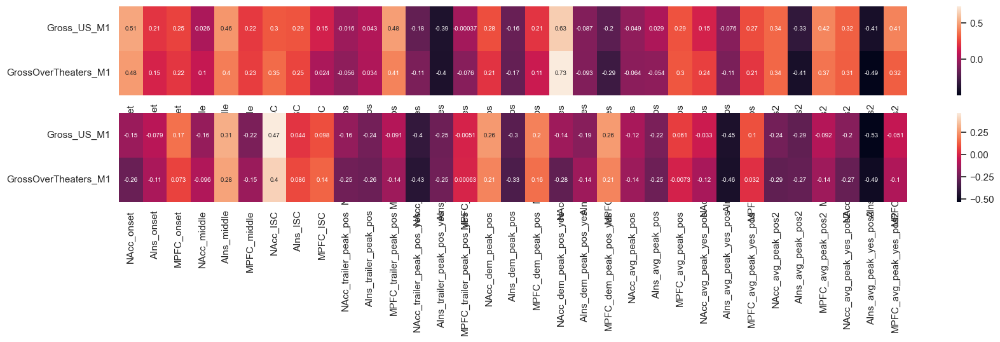

In [922]:
aggregate_comedy_df["GrossOverTheaters_M1"] = aggregate_comedy_df["Gross_US_M1"] / aggregate_comedy_df["Theaters_US_M1"]
aggregate_horror_df["GrossOverTheaters_M1"] = aggregate_horror_df["Gross_US_M1"] / aggregate_horror_df["Theaters_US_M1"]

relevant_neuro_cols = ["Gross_US_M1", "GrossOverTheaters_M1", 
                        'NAcc_onset', 'AIns_onset', 'MPFC_onset', 'NAcc_middle', 'AIns_middle', 'MPFC_middle',
                         #'NAcc_offset', 'AIns_offset', 'MPFC_offset',
                         #'NAcc_whole', 'AIns_whole', 'MPFC_whole', 
                         'NAcc_ISC', 'AIns_ISC', 'MPFC_ISC', 
                         #'NAcc_ind_peaks_pos', 'AIns_ind_peaks_pos', 'MPFC_ind_peaks_pos',
                         #'NAcc_ind_peaks_neg', 'AIns_ind_peaks_neg', 'MPFC_ind_peaks_neg', 
                         'NAcc_trailer_peak_pos', 'AIns_trailer_peak_pos', 'MPFC_trailer_peak_pos', 
                         "NAcc_trailer_peak_pos_yes", "AIns_trailer_peak_pos_yes", "MPFC_trailer_peak_pos_yes",
                         #"NAcc_trailer_peak_neg", "AIns_trailer_peak_neg", "MPFC_trailer_peak_neg", 
                         "NAcc_dem_peak_pos", "AIns_dem_peak_pos", "MPFC_dem_peak_pos", 
                         "NAcc_dem_peak_pos_yes", "AIns_dem_peak_pos_yes", "MPFC_dem_peak_pos_yes", 
                         "NAcc_avg_peak_pos", "AIns_avg_peak_pos", "MPFC_avg_peak_pos",
                         "NAcc_avg_peak_yes_pos" , 'AIns_avg_peak_yes_pos', 'MPFC_avg_peak_yes_pos', 
                         "NAcc_avg_peak_pos2", "AIns_avg_peak_pos2", "MPFC_avg_peak_pos2",
                         "NAcc_avg_peak_yes_pos2" , 'AIns_avg_peak_yes_pos2', 'MPFC_avg_peak_yes_pos2']

aggregate_comedy_filtered_df = aggregate_comedy_df[relevant_neuro_cols]
aggregate_comedy_filtered_df = aggregate_comedy_filtered_df.dropna()
aggregate_comedy_filtered_df = aggregate_comedy_filtered_df.corr()

aggregate_horror_filtered_df = aggregate_horror_df[relevant_neuro_cols]
aggregate_horror_filtered_df = aggregate_horror_filtered_df.dropna()
aggregate_horror_filtered_df = aggregate_horror_filtered_df.corr()

fig, axs = plt.subplots(2, 1, figsize=(20, 4), sharex=False) 

sns.heatmap(aggregate_comedy_filtered_df.iloc[0:2, 2:], ax=axs[0], annot=True, annot_kws={'size': 7})
sns.heatmap(aggregate_horror_filtered_df.iloc[0:2, 2:], ax=axs[1], annot=True, annot_kws={'size': 7})

<Axes: >

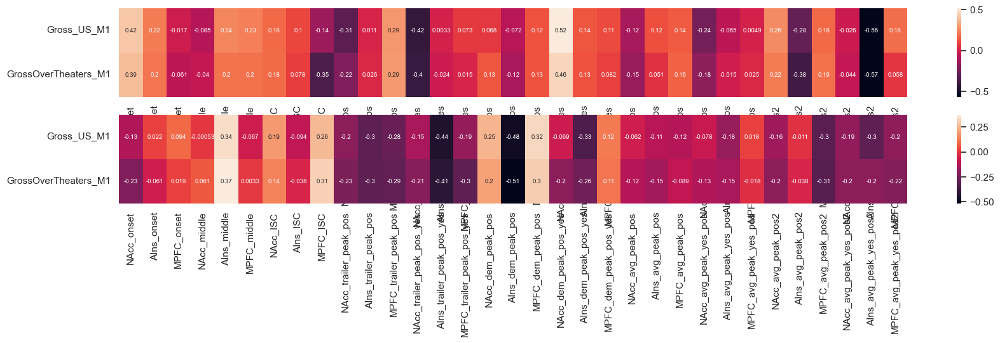

In [923]:
LC_aggregate_combined_df["GrossOverTheaters_M1"] = LC_aggregate_combined_df["Gross_US_M1"] / LC_aggregate_combined_df["Theaters_US_M1"]
LH_aggregate_combined_df["GrossOverTheaters_M1"] = LH_aggregate_combined_df["Gross_US_M1"] / LH_aggregate_combined_df["Theaters_US_M1"]

relevant_neuro_cols = ["Gross_US_M1", "GrossOverTheaters_M1", 
                        'NAcc_onset', 'AIns_onset', 'MPFC_onset', 'NAcc_middle', 'AIns_middle', 'MPFC_middle',
                         #'NAcc_offset', 'AIns_offset', 'MPFC_offset',
                         #'NAcc_whole', 'AIns_whole', 'MPFC_whole', 
                         'NAcc_ISC', 'AIns_ISC', 'MPFC_ISC', 
                         #'NAcc_ind_peaks_pos', 'AIns_ind_peaks_pos', 'MPFC_ind_peaks_pos',
                         #'NAcc_ind_peaks_neg', 'AIns_ind_peaks_neg', 'MPFC_ind_peaks_neg', 
                         'NAcc_trailer_peak_pos', 'AIns_trailer_peak_pos', 'MPFC_trailer_peak_pos', 
                         "NAcc_trailer_peak_pos_yes", "AIns_trailer_peak_pos_yes", "MPFC_trailer_peak_pos_yes",
                         "NAcc_dem_peak_pos", "AIns_dem_peak_pos", "MPFC_dem_peak_pos", 
                         "NAcc_dem_peak_pos_yes", "AIns_dem_peak_pos_yes", "MPFC_dem_peak_pos_yes", 
                         "NAcc_avg_peak_pos", "AIns_avg_peak_pos", "MPFC_avg_peak_pos",
                         "NAcc_avg_peak_yes_pos" , 'AIns_avg_peak_yes_pos', 'MPFC_avg_peak_yes_pos', 
                         "NAcc_avg_peak_pos2", "AIns_avg_peak_pos2", "MPFC_avg_peak_pos2",
                         "NAcc_avg_peak_yes_pos2" , 'AIns_avg_peak_yes_pos2', 'MPFC_avg_peak_yes_pos2']

LC_aggregate_filtered_df = LC_aggregate_combined_df[relevant_neuro_cols]
LC_aggregate_filtered_df = LC_aggregate_filtered_df.dropna()
LC_aggregate_filtered_df = LC_aggregate_filtered_df.corr()

LH_aggregate_filtered_df = LH_aggregate_combined_df[relevant_neuro_cols]
LH_aggregate_filtered_df = LH_aggregate_filtered_df.dropna()
LH_aggregate_filtered_df = LH_aggregate_filtered_df.corr()

fig, axs = plt.subplots(2, 1, figsize=(20, 4), sharex=False)

sns.heatmap(LC_aggregate_filtered_df.iloc[0:2, 2:], ax=axs[0], annot=True, annot_kws={'size': 7})
sns.heatmap(LH_aggregate_filtered_df.iloc[0:2, 2:], ax=axs[1], annot=True, annot_kws={'size': 7})

